In [2]:
# import libraries
# to handle paths
import sys
import os
from pathlib import Path
# to handle datasets
import pandas as pd
import numpy as np
# for iterating
from itertools import product
# for plotting
import matplotlib.pyplot as plt
import seaborn as sns
# to load trained model
import joblib
# to calculate and visualize shap values
import shap

# to visualise al the columns in the dataframe
pd.pandas.set_option('display.max_columns', 10)

In [3]:
shap.__version__

'0.41.0'

In [2]:
# variables
project_name = "RF+Clust"
project_folder = f"C:/Users/anani/Downloads/{project_name}"
sys.path.append(project_folder)

from variables import suite_name, features, target, transformation, n_folds, budgets, algorithms
from variables import model_name, explainer_type

In [3]:
# define directories
if features != "all":
    data_folder = f"{project_folder}/Data/{suite_name}/preprocessed/transformation={transformation}_features={features}/{model_name}"
else: 
    data_folder = f"{project_folder}/Data/{suite_name}/preprocessed/transformation={transformation}_features={features}"

results_folder = f"{project_folder}/Results/{suite_name}/transformation={transformation}_features={features}/{model_name}"

In [4]:
# helper functions
def calculate_shap_values(data: pd.DataFrame, model: object, explainer_type: str) -> pd.DataFrame:
    """
    Function used to calculate shapley values with the SHAP method.
    
    data: pandas df with f_id and i_id as index and features as columns.
    model: fitted ML model.
    explainer_type: options: "tree" or "kernel".
    """
    # init SHAP explainer
    if explainer_type == 'tree':
        explainer = shap.TreeExplainer(model=model)
    
    elif explainer_type == 'kernel':
        explainer = shap.KernelExplainer(model=model.predict, data=data)

    # calculate SHAP values and convert result to data frame
    shap_values = pd.DataFrame(explainer.shap_values(X=data), columns=data.columns, index=data.index)
    
    return shap_values


def visualise_shap_values(shap_values: pd.DataFrame, data: pd.DataFrame, plot_type: str, figsize: tuple, max_display: int
                          , title: str, save_path:str) -> None:
    """
    Function to plot shapley values with shap summary plot.
    
    shap_values: pandas df with f_id and i_id as index and features as columns.
    data: pandas df with f_id and i_id as index and features as columns.
    plot_type: "dot" or "bar"
    max_display: maximum number of features to be displayed on the Shapley plot.
    """
    # set up figure 
    sns.set()
    sns.set_theme(style='white', font_scale=1.3)
    f, ax = plt.subplots(1, 1, figsize=figsize)

    # plot
    shap.summary_plot(shap_values=shap_values, features=data,  plot_type=plot_type
                      , max_display=max_display, plot_size=None, show=False, alpha=0.8)
    # enhance plot
    plt.gcf().axes[-1].set_aspect(70)
    plt.gcf().axes[-1].set_box_aspect(70)
    plt.tight_layout()

    # save
    plt.savefig(f"{save_path}/{title}.png", bbox_inches='tight', dpi=300)
    
    plt.show()
    plt.close()
    
    
def calculate_shap_importance(data: pd.DataFrame) -> pd.DataFrame:
    """
    Function to calculate mean feature importance by aggregating shapley values per feature.
    
    data: pandas df with f_id and i_id as index and shap values as columns.
    """
    # not to change the original shapley values
    shap_importance = data.copy()
    
    # convert to abs values
    shap_importance = shap_importance.abs()
    
    # calculate mean per column
    shap_importance = shap_importance.mean().reset_index()
    
    # rename columns
    shap_importance = shap_importance.rename(columns={'index': 'feature_name', 0: 'feature_importance'})
    
    # sort by feature importance
    shap_importance = shap_importance.sort_values(by='feature_importance', ascending=False)
    
    # rank features 
    shap_importance['rank'] = np.arange(1, len(shap_importance)+1)

    return shap_importance


def calculate_crossval_shap_importance(data: pd.DataFrame, method: str, topn_feature_number=None) -> pd.DataFrame:
    """
    Function to calculate SHAP feature importance in cross-validation scenario.
    Calculates feature importance as mean per feature, over all folds.
    
    data: pandas df containing fold_number, feature_name and feature_importance values in columns.
    method: Options: ["mean", "counts"]
    topn_feature_number: default=None, needs to be specified when method is "counts".
    """
    # not to change the original data
    shap_crossval_importance = data.copy()
    
    if method == "mean": # calculate mean over all folds
        shap_crossval_importance = shap_crossval_importance.groupby('feature_name')[
            'feature_importance'].mean().reset_index()

    elif method == "counts": # count in how many folds a feature appears in topn features
        
        # select topn features
        topn = shap_crossval_importance.groupby(["fold_number"]).apply(
        lambda x: x.nlargest(topn_feature_number, 'feature_importance')).reset_index(drop=True)
        
        # count feature appearance in topn features across folds
        shap_crossval_importance = topn.groupby(["feature_name"])["feature_name"].count() \
        .to_frame().rename(columns={'feature_name': 'feature_importance'}).reset_index()

    # sort by importance
    shap_crossval_importance = shap_crossval_importance.sort_values(by='feature_importance', ascending=False)

    # rank features 
    shap_crossval_importance['rank'] = np.arange(1, len(shap_crossval_importance)+1)

    return shap_crossval_importance

## Shapley values

algorithm name: DE1
budget: 5000
dataset: train
fold_number: 1
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
2    1              0.532267           0.515056           0.552000   
     2              0.578658           0.514219           0.518899   
     3              0.560064           0.571474           0.620045   
     4              0.510119           0.566219           0.516654   
     5              0.563693           0.528451           0.489367   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                          ...                          
2    1              0.425284             0.547406  ...              -1.343457   
     2              0.414263             0.598520  ...              -1.343457   
     3              0.531847             0.585370  ...              -1.343457   
     4              0.3195

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


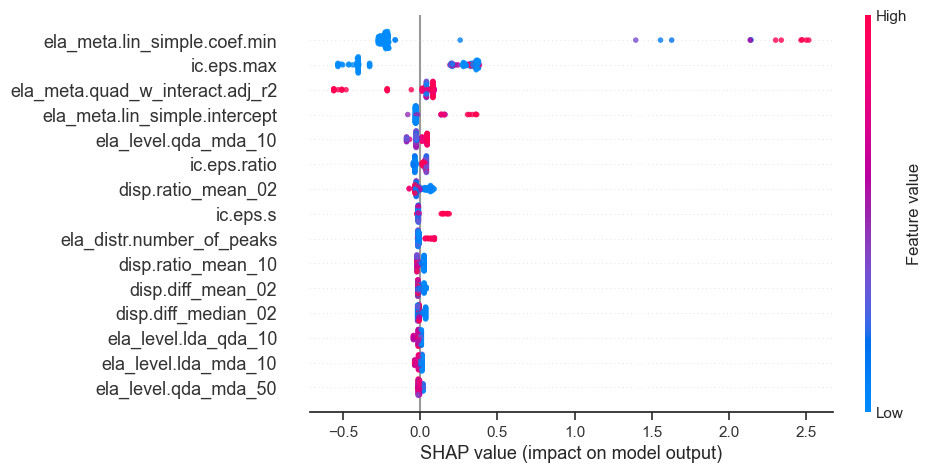

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.432102     1
46                       ic.eps.max            0.355355     2
45  ela_meta.quad_w_interact.adj_r2            0.106794     3
41    ela_meta.lin_simple.intercept            0.053418     4
34             ela_level.qda_mda_10            0.035930     5
(61, 3)
fold_number: 2
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.339078          -1.389661          -1.411350   
     2             -0.969076          -0.945719          -0.873538   
     3             -0.993784          -0.936401          -0.911410   
     4             -1.138232          -1.118260          -1.066391   
     5             -1.199783          -1.179622          -1.125340   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


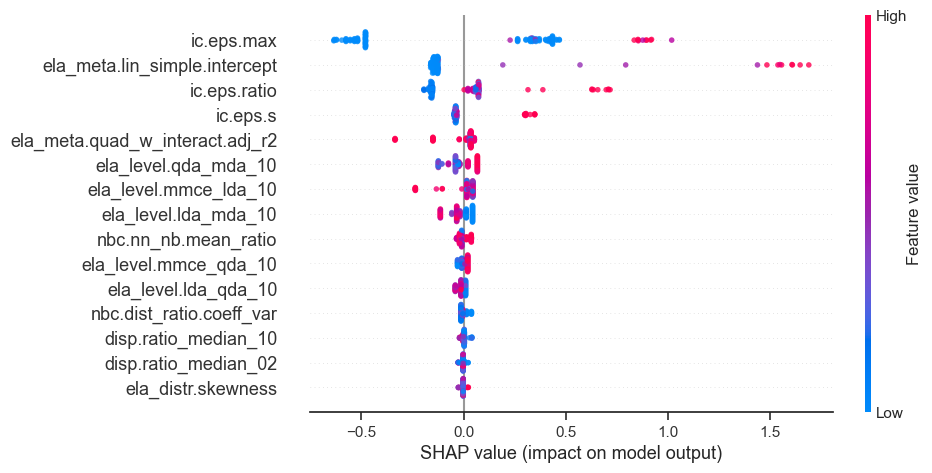

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.483294     1
41    ela_meta.lin_simple.intercept            0.261077     2
47                     ic.eps.ratio            0.148910     3
48                         ic.eps.s            0.075459     4
45  ela_meta.quad_w_interact.adj_r2            0.056877     5
(61, 3)
fold_number: 3
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.401136          -1.449504          -1.470875   
     2             -1.029651          -1.003992          -0.931178   
     3             -1.054458          -0.994642          -0.969182   
     4             -1.199485          -1.177143          -1.124707   
     5             -1.261283          -1.238722          -1.183862   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


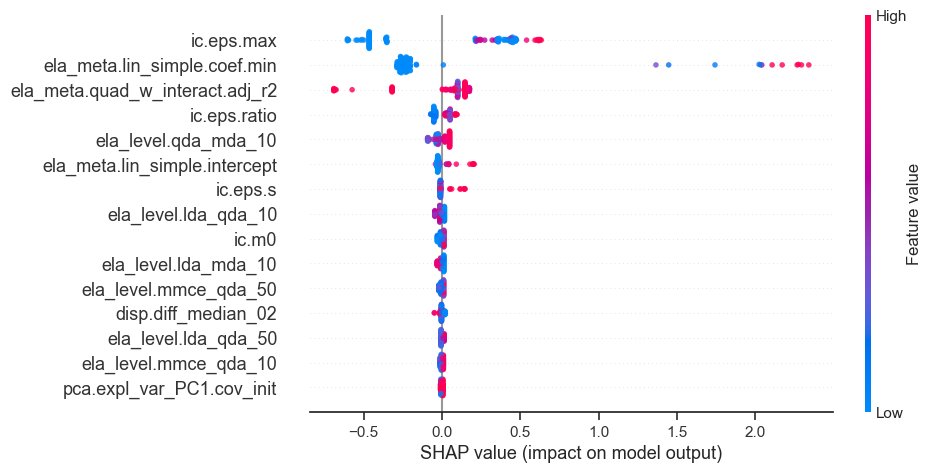

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.429633     1
40     ela_meta.lin_simple.coef.min            0.422484     2
45  ela_meta.quad_w_interact.adj_r2            0.181810     3
47                     ic.eps.ratio            0.048426     4
34             ela_level.qda_mda_10            0.039959     5
(61, 3)
fold_number: 4
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.398394          -1.452617          -1.472214   
     2             -1.027319          -1.006705          -0.932417   
     3             -1.052099          -0.997346          -0.970429   
     4             -1.196966          -1.180011          -1.125982   
     5             -1.258696          -1.241645          -1.185148   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


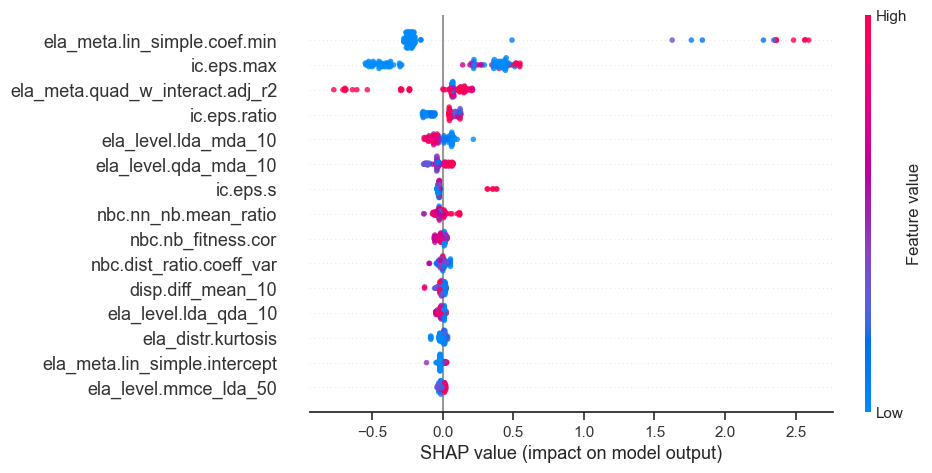

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.441822     1
46                       ic.eps.max            0.408599     2
45  ela_meta.quad_w_interact.adj_r2            0.169518     3
47                     ic.eps.ratio            0.095376     4
19             ela_level.lda_mda_10            0.062644     5
(61, 3)
fold_number: 5
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.339762          -1.389631          -1.411040   
     2             -0.970368          -0.945615          -0.872236   
     3             -0.995035          -0.936295          -0.910178   
     4             -1.139246          -1.118184          -1.065445   
     5             -1.200697          -1.179556          -1.124502   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


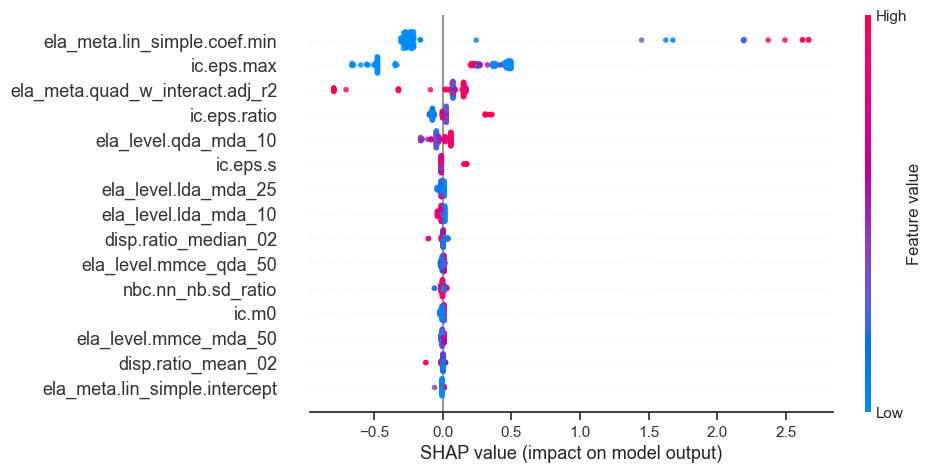

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.453891     1
46                       ic.eps.max            0.427060     2
45  ela_meta.quad_w_interact.adj_r2            0.178082     3
47                     ic.eps.ratio            0.060856     4
34             ela_level.qda_mda_10            0.055291     5
(61, 3)
fold_number: 6
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.365241          -1.414042          -1.433830   
     2             -0.997552          -0.972924          -0.899618   
     3             -1.022106          -0.963665          -0.937236   
     4             -1.165651          -1.144367          -1.091180   
     5             -1.226818          -1.205338          -1.149734   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


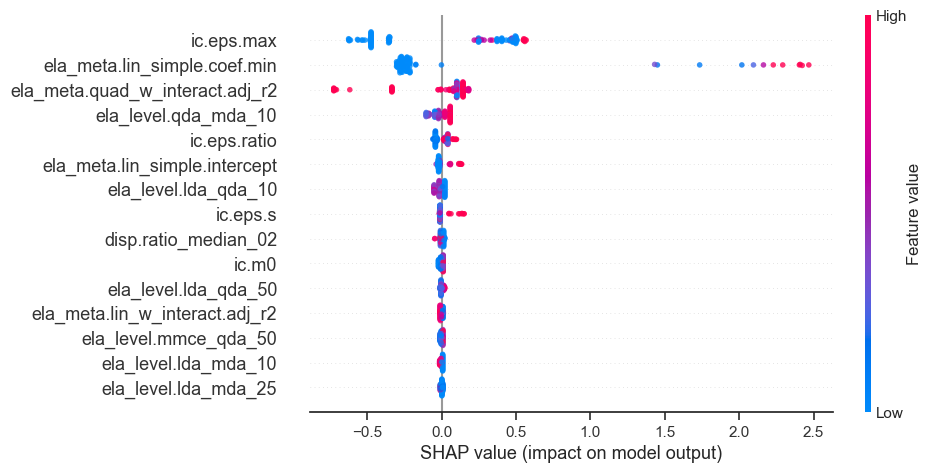

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.446956     1
40     ela_meta.lin_simple.coef.min            0.441134     2
45  ela_meta.quad_w_interact.adj_r2            0.185099     3
34             ela_level.qda_mda_10            0.044058     4
47                     ic.eps.ratio            0.039259     5
(61, 3)
fold_number: 7
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.355841          -1.404300          -1.424546   
     2             -0.988467          -0.963396          -0.890466   
     3             -1.013000          -0.954142          -0.928075   
     4             -1.156422          -1.134756          -1.081981   
     5             -1.217536          -1.195698          -1.140521   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


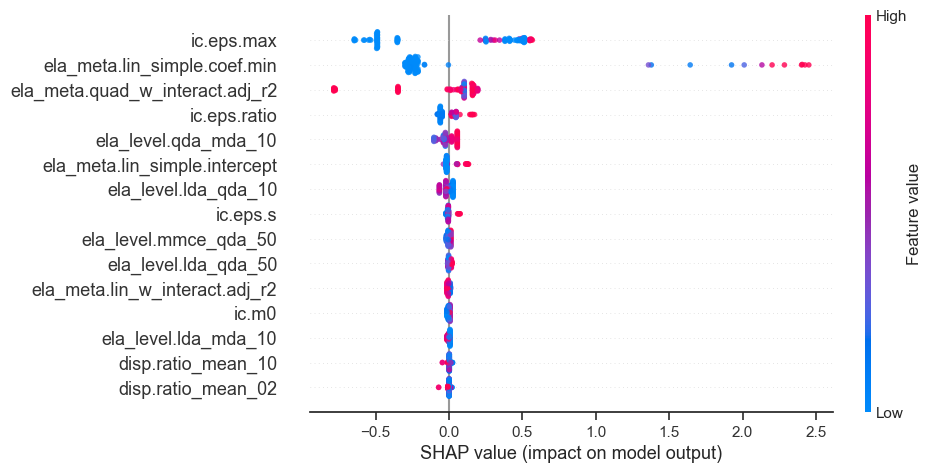

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.457082     1
40     ela_meta.lin_simple.coef.min            0.433777     2
45  ela_meta.quad_w_interact.adj_r2            0.200451     3
47                     ic.eps.ratio            0.053630     4
34             ela_level.qda_mda_10            0.042285     5
(61, 3)
fold_number: 8
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.432010          -1.481996          -1.500571   
     2             -1.055970          -1.030940          -0.954906   
     3             -1.081082          -1.021473          -0.993331   
     4             -1.227887          -1.206246          -1.150575   
     5             -1.290443          -1.268591          -1.210384   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


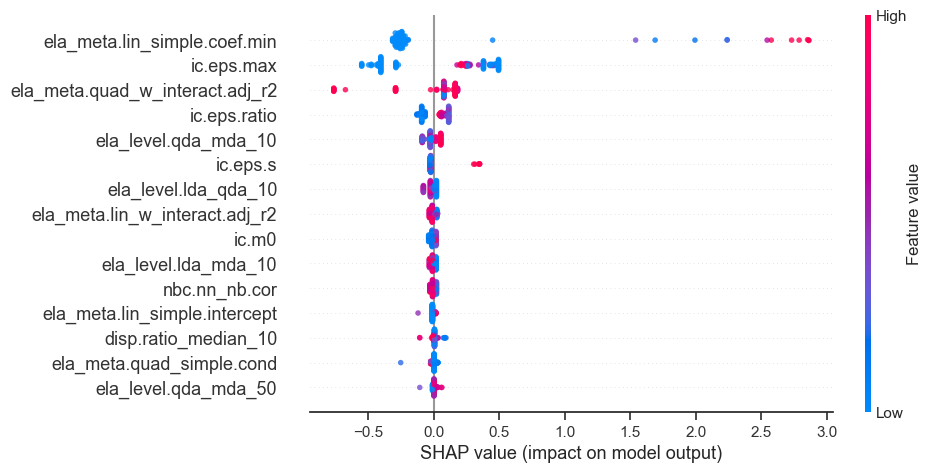

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.485266     1
46                       ic.eps.max            0.389903     2
45  ela_meta.quad_w_interact.adj_r2            0.186615     3
47                     ic.eps.ratio            0.089965     4
34             ela_level.qda_mda_10            0.041374     5
(61, 3)
fold_number: 9
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.409472          -1.472203          -1.508899   
     2             -1.036865          -1.022941          -0.961372   
     3             -1.061748          -1.013511          -0.999928   
     4             -1.207212          -1.197549          -1.157708   
     5             -1.269197          -1.259646          -1.217722   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


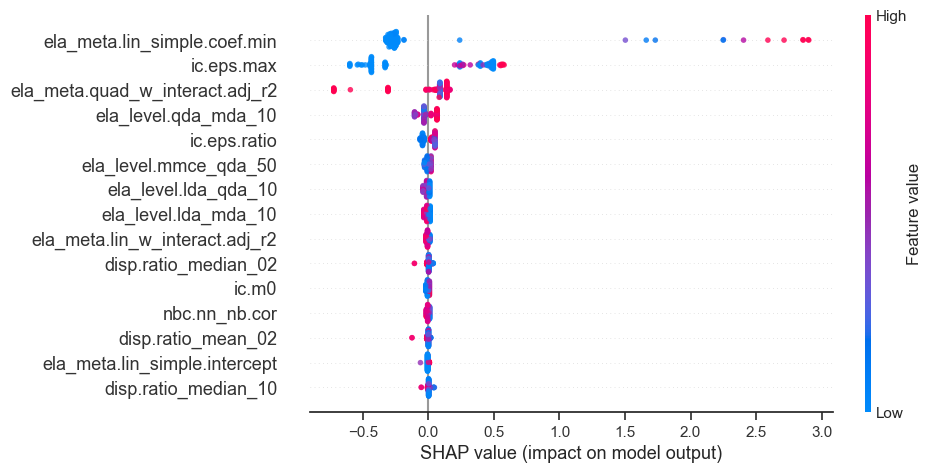

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.490190     1
46                       ic.eps.max            0.432758     2
45  ela_meta.quad_w_interact.adj_r2            0.174872     3
34             ela_level.qda_mda_10            0.050858     4
47                     ic.eps.ratio            0.042488     5
(61, 3)
fold_number: 10
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.338952          -1.389955          -1.411950   
     2             -0.967121          -0.943563          -0.870885   
     3             -0.991951          -0.934194          -0.908986   
     4             -1.137113          -1.117056          -1.064904   
     5             -1.198969          -1.178757          -1.124210   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


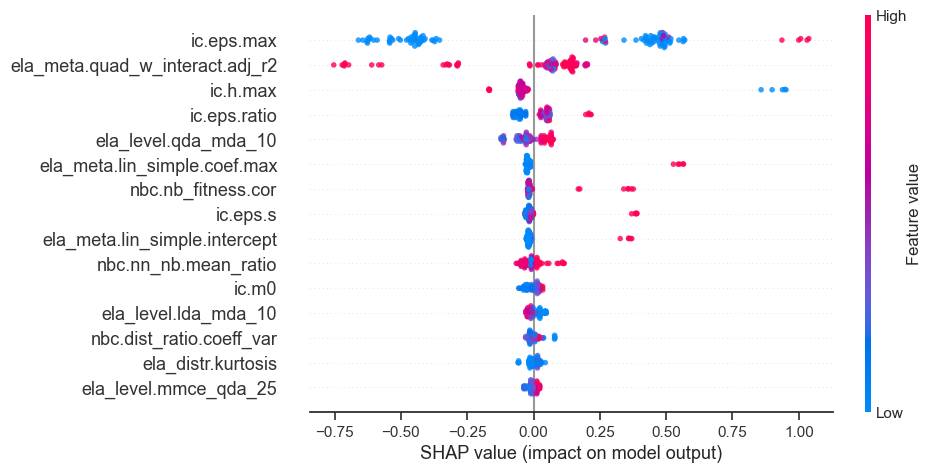

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.482213     1
45  ela_meta.quad_w_interact.adj_r2            0.171695     2
49                         ic.h.max            0.089501     3
47                     ic.eps.ratio            0.058771     4
34             ela_level.qda_mda_10            0.050065     5
(61, 3)
fold_number: 11
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.380109          -1.431570          -1.450081   
     2             -0.983171          -0.956595          -0.877581   
     3             -1.009678          -0.946626          -0.917896   
     4             -1.164642          -1.141196          -1.082873   
     5             -1.230674          -1.206848          -1.145624   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


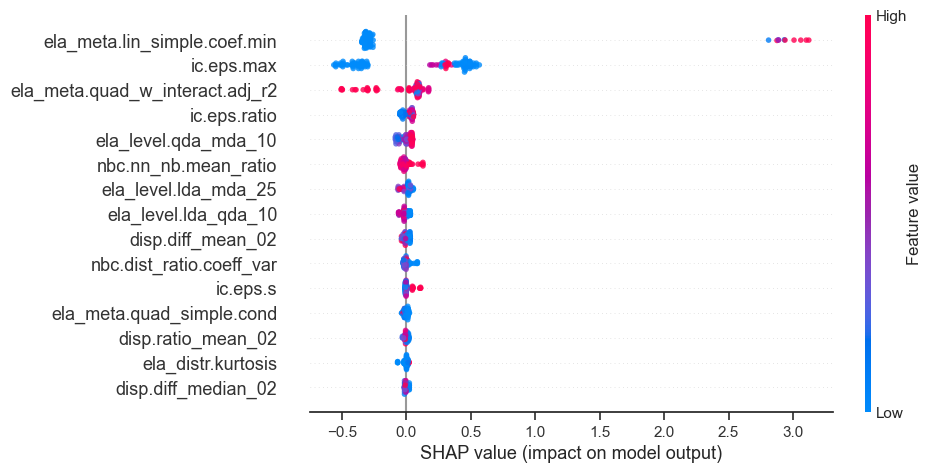

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.535867     1
46                       ic.eps.max            0.407458     2
45  ela_meta.quad_w_interact.adj_r2            0.131381     3
47                     ic.eps.ratio            0.036728     4
34             ela_level.qda_mda_10            0.034849     5
(61, 3)
fold_number: 12
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.414407          -1.455316          -1.466269   
     2             -1.041050          -1.008911          -0.927490   
     3             -1.065982          -0.999541          -0.965430   
     4             -1.211740          -1.182409          -1.120689   
     5             -1.273850          -1.244111          -1.179744   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


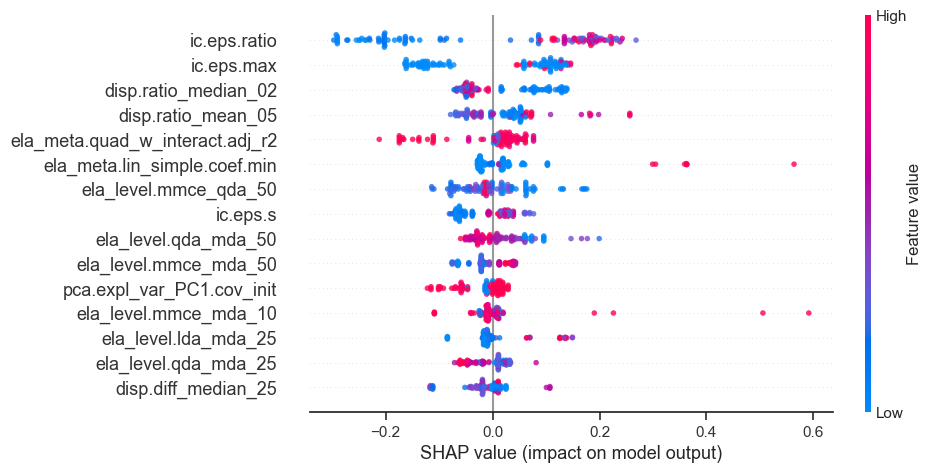

preview shap feature importance: 
                       feature_name  feature_importance  rank
47                     ic.eps.ratio            0.182608     1
46                       ic.eps.max            0.113390     2
12             disp.ratio_median_02            0.065436     3
9                disp.ratio_mean_05            0.054453     4
45  ela_meta.quad_w_interact.adj_r2            0.048876     5
(61, 3)
fold_number: 13
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.403482          -1.449799          -1.468379   
     2             -1.031719          -1.004312          -0.929261   
     3             -1.056545          -0.994961          -0.967225   
     4             -1.201680          -1.177453          -1.122582   
     5             -1.263524          -1.239029          -1.181674   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


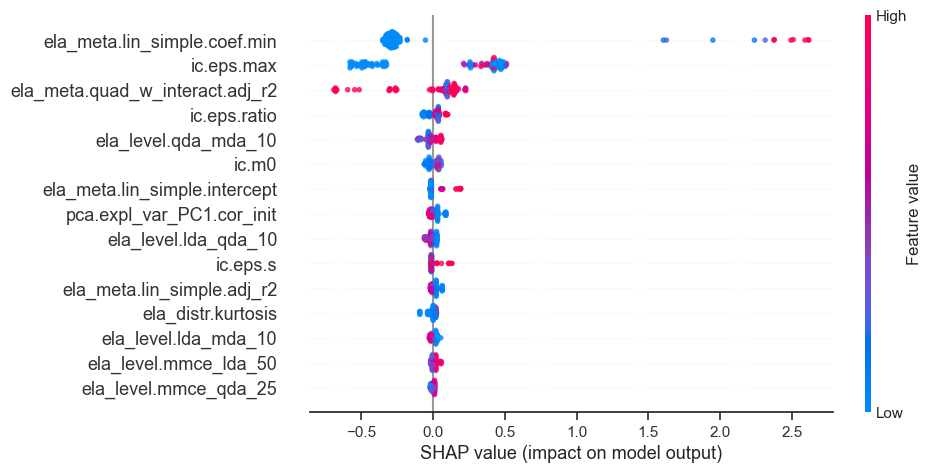

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.492375     1
46                       ic.eps.max            0.434180     2
45  ela_meta.quad_w_interact.adj_r2            0.173154     3
47                     ic.eps.ratio            0.044651     4
34             ela_level.qda_mda_10            0.040944     5
(61, 3)
fold_number: 14
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.376872          -1.417891          -1.432685   
     2             -1.008327          -0.976534          -0.898595   
     3             -1.032938          -0.967270          -0.936204   
     4             -1.176817          -1.148070          -1.090113   
     5             -1.238126          -1.209075          -1.148654   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


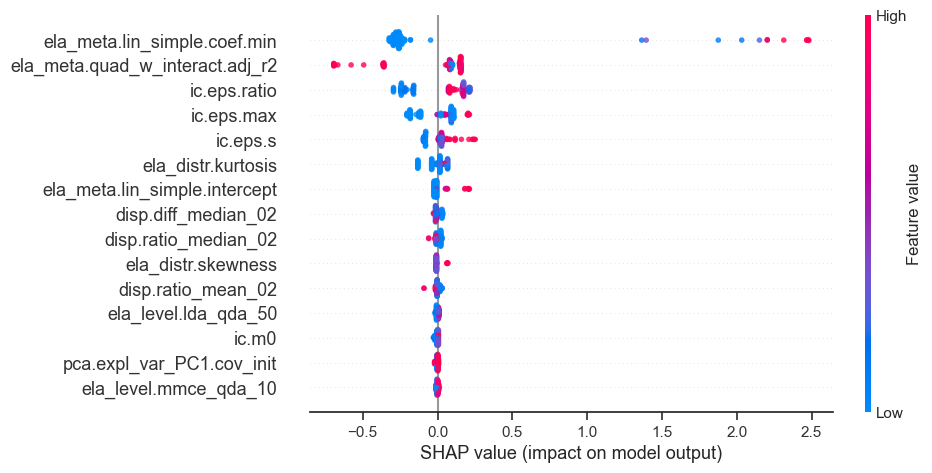

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.458423     1
45  ela_meta.quad_w_interact.adj_r2            0.186931     2
47                     ic.eps.ratio            0.181215     3
46                       ic.eps.max            0.120909     4
48                         ic.eps.s            0.057123     5
(61, 3)
fold_number: 15
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.406236          -1.451997          -1.470427   
     2             -1.034078          -1.006152          -0.930889   
     3             -1.058930          -0.996794          -0.968883   
     4             -1.204220          -1.179432          -1.124361   
     5             -1.266130          -1.241057          -1.183499   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


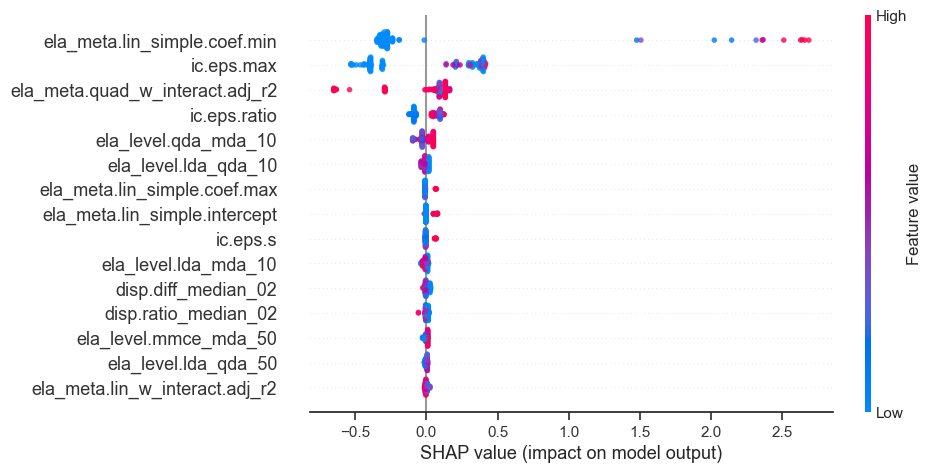

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.494765     1
46                       ic.eps.max            0.362856     2
45  ela_meta.quad_w_interact.adj_r2            0.165661     3
47                     ic.eps.ratio            0.083816     4
34             ela_level.qda_mda_10            0.040855     5
(61, 3)
fold_number: 16
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.410323          -1.471862          -1.500991   
     2             -1.000448          -0.977362          -0.899207   
     3             -1.027819          -0.966982          -0.941583   
     4             -1.187833          -1.169552          -1.114999   
     5             -1.256018          -1.237902          -1.180960   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


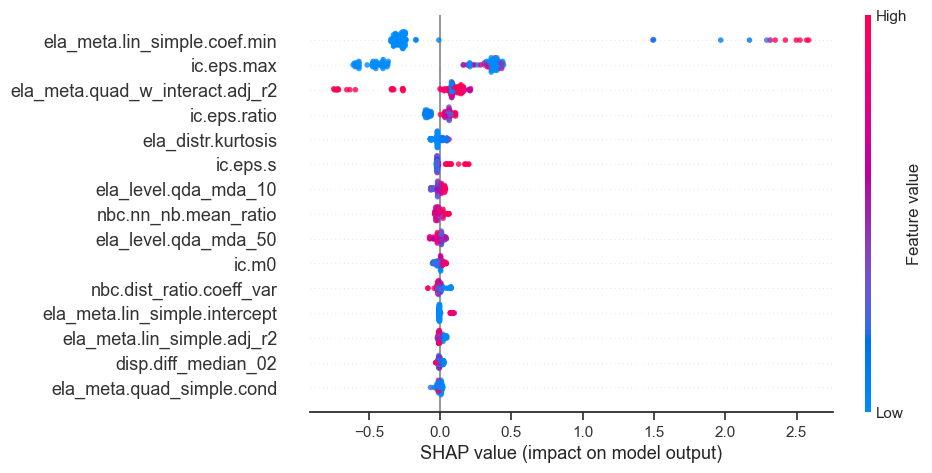

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.483730     1
46                       ic.eps.max            0.400796     2
45  ela_meta.quad_w_interact.adj_r2            0.178230     3
47                     ic.eps.ratio            0.070427     4
16               ela_distr.kurtosis            0.031150     5
(61, 3)
fold_number: 17
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.371845          -1.416570          -1.434553   
     2             -1.003744          -0.975319          -0.900275   
     3             -1.028325          -0.966057          -0.937898   
     4             -1.172031          -1.146814          -1.091860   
     5             -1.233266          -1.207804          -1.150422   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


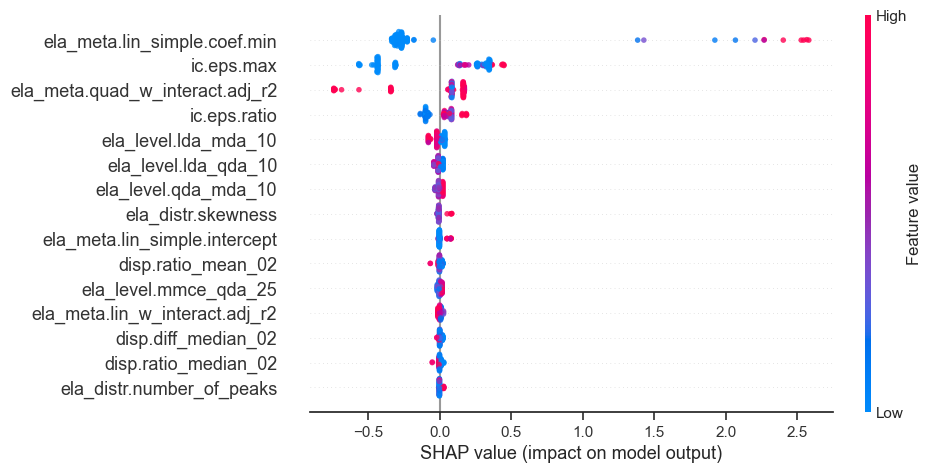

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.475845     1
46                       ic.eps.max            0.344026     2
45  ela_meta.quad_w_interact.adj_r2            0.194014     3
47                     ic.eps.ratio            0.083942     4
19             ela_level.lda_mda_10            0.026686     5
(61, 3)
fold_number: 18
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.360160          -1.407634          -1.426709   
     2             -0.992772          -0.966888          -0.892803   
     3             -1.017306          -0.957637          -0.930400   
     4             -1.160733          -1.138186          -1.084255   
     5             -1.221850          -1.199106          -1.142776   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


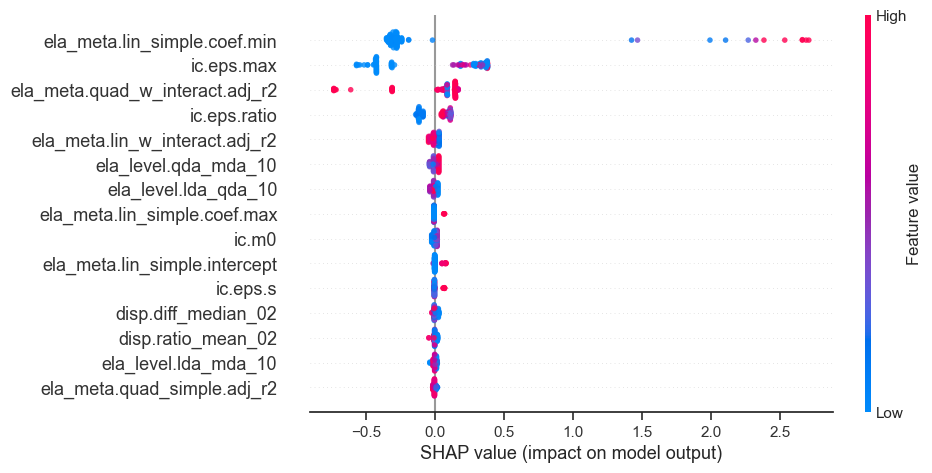

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.497088     1
46                       ic.eps.max            0.355449     2
45  ela_meta.quad_w_interact.adj_r2            0.181009     3
47                     ic.eps.ratio            0.097598     4
42   ela_meta.lin_w_interact.adj_r2            0.019293     5
(61, 3)
fold_number: 19
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.399816          -1.465934          -1.504934   
     2             -1.028554          -1.017785          -0.958306   
     3             -1.053346          -1.008379          -0.996799   
     4             -1.198286          -1.191961          -1.154320   
     5             -1.260047          -1.253904          -1.214236   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


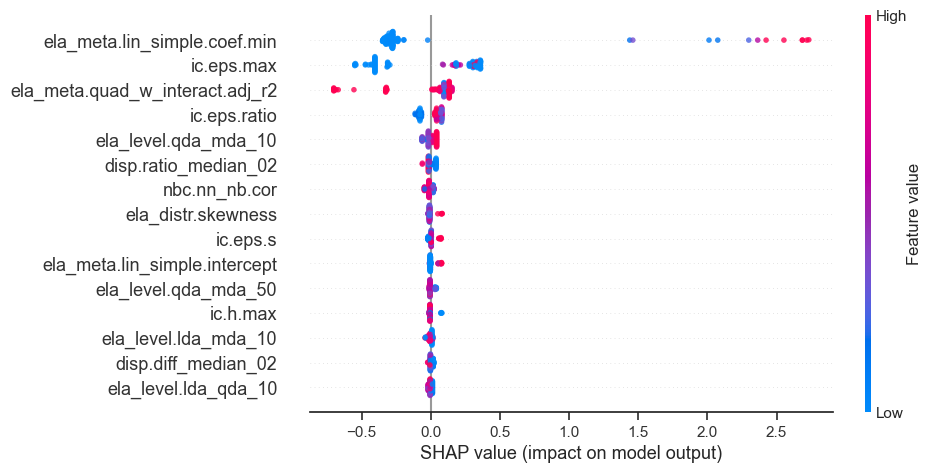

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.495855     1
46                       ic.eps.max            0.339406     2
45  ela_meta.quad_w_interact.adj_r2            0.174808     3
47                     ic.eps.ratio            0.069600     4
34             ela_level.qda_mda_10            0.026867     5
(61, 3)
fold_number: 20
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.399962          -1.453126          -1.474696   
     2             -1.028688          -1.007140          -0.934451   
     3             -1.053481          -0.997780          -0.972494   
     4             -1.198426          -1.180475          -1.128176   
     5             -1.260189          -1.242120          -1.187392   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


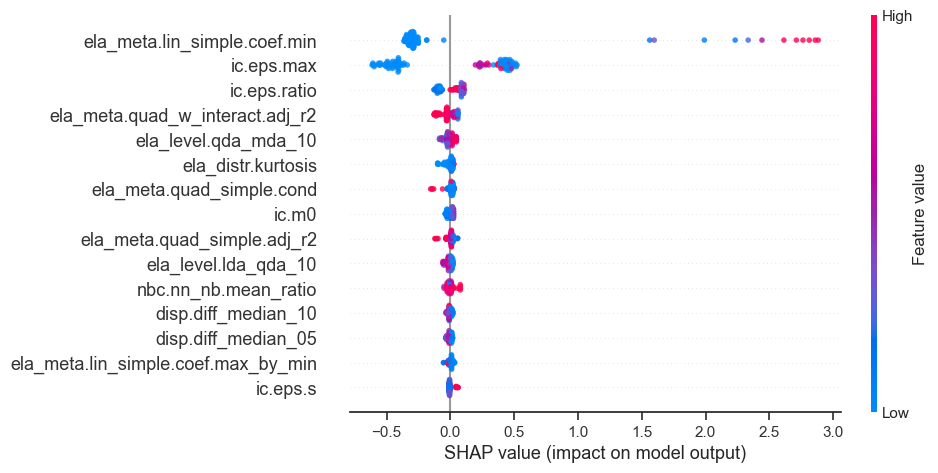

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.520069     1
46                       ic.eps.max            0.430097     2
47                     ic.eps.ratio            0.084690     3
45  ela_meta.quad_w_interact.adj_r2            0.046473     4
34             ela_level.qda_mda_10            0.030222     5
(61, 3)
fold_number: 21
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.346117          -1.394013          -1.413053   
     2             -0.967025          -0.942128          -0.869487   
     3             -0.992340          -0.932643          -0.907763   
     4             -1.140337          -1.117756          -1.064403   
     5             -1.203400          -1.180215          -1.123982   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


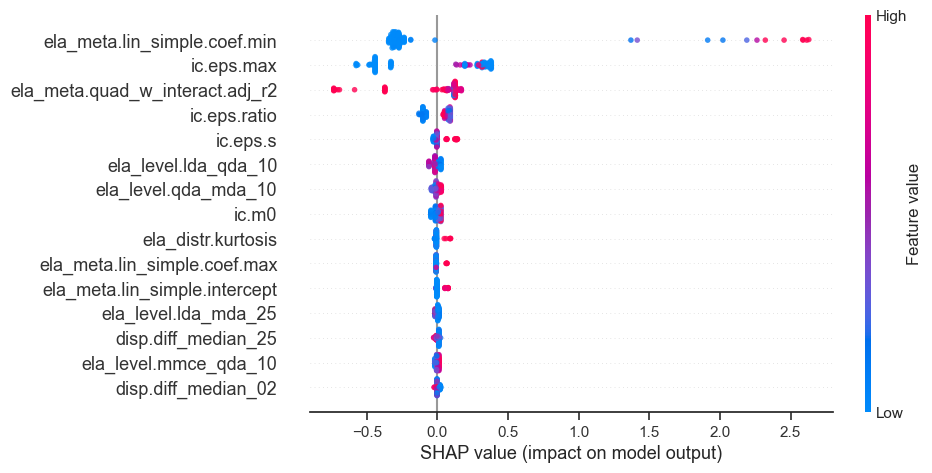

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.482968     1
46                       ic.eps.max            0.359450     2
45  ela_meta.quad_w_interact.adj_r2            0.185270     3
47                     ic.eps.ratio            0.083742     4
48                         ic.eps.s            0.023058     5
(61, 3)
fold_number: 22
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.341410          -1.391181          -1.412366   
     2             -0.967111          -0.943838          -0.872651   
     3             -0.992106          -0.934449          -0.910657   
     4             -1.138231          -1.117701          -1.066186   
     5             -1.200498          -1.179533          -1.125344   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


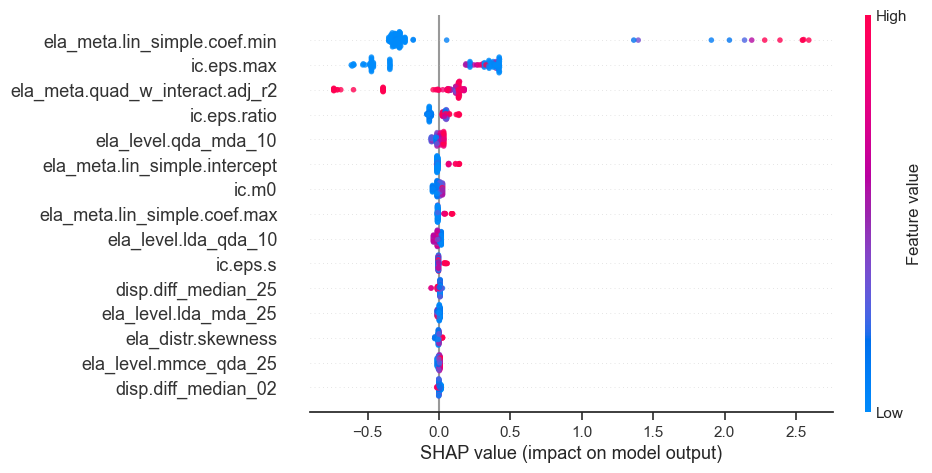

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.483646     1
46                       ic.eps.max            0.390986     2
45  ela_meta.quad_w_interact.adj_r2            0.191537     3
47                     ic.eps.ratio            0.056959     4
34             ela_level.qda_mda_10            0.022365     5
(61, 3)
fold_number: 23
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.412120          -1.472464          -1.501616   
     2             -1.001511          -0.977685          -0.899495   
     3             -1.028931          -0.967300          -0.941895   
     4             -1.189232          -1.169983          -1.115408   
     5             -1.257538          -1.238372          -1.181406   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


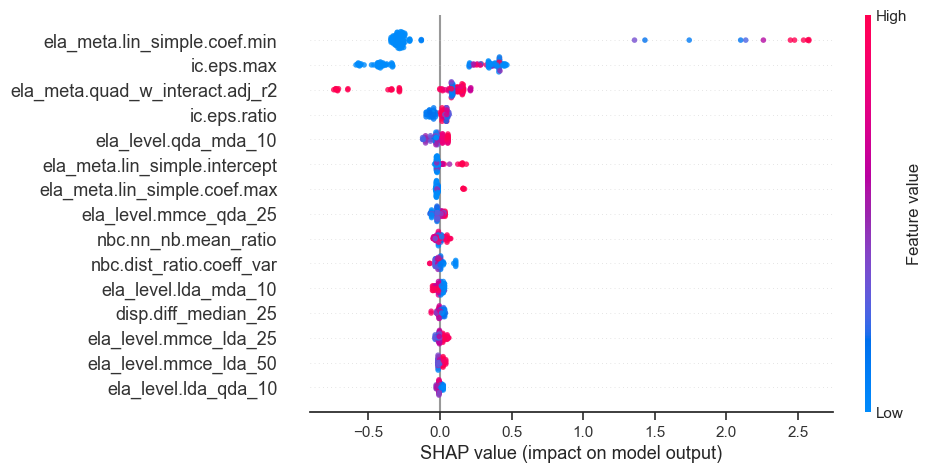

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.478853     1
46                       ic.eps.max            0.391568     2
45  ela_meta.quad_w_interact.adj_r2            0.182766     3
47                     ic.eps.ratio            0.046331     4
34             ela_level.qda_mda_10            0.043549     5
(61, 3)
fold_number: 24
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.397606          -1.461182          -1.495641   
     2             -1.026645          -1.013863          -0.951077   
     3             -1.051417          -1.004474          -0.989424   
     4             -1.196240          -1.187716          -1.146351   
     5             -1.257950          -1.249545          -1.206040   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


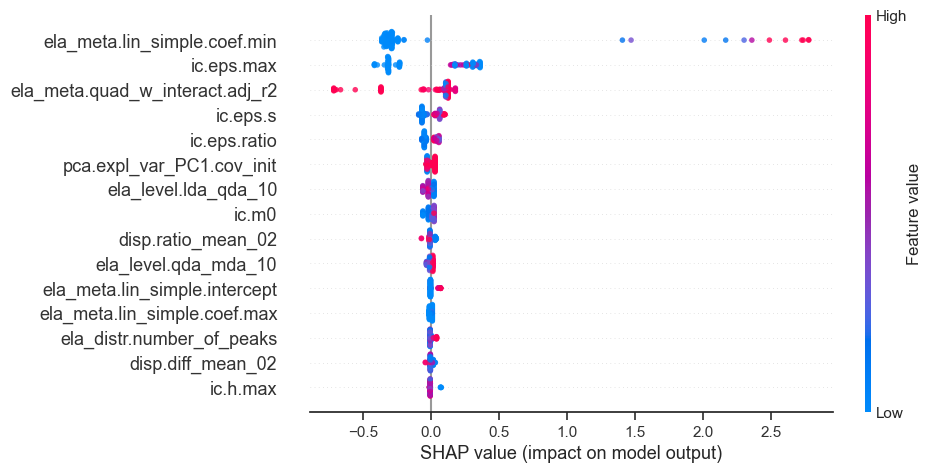

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.511793     1
46                       ic.eps.max            0.297459     2
45  ela_meta.quad_w_interact.adj_r2            0.184031     3
48                         ic.eps.s            0.059468     4
47                     ic.eps.ratio            0.044429     5
(61, 3)
dataset: test
fold_number: 1
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.448089          -1.498326          -1.516219   
     2             -1.069362          -1.044050          -0.966855   
     3             -1.094653          -1.034515          -1.005540   
     4             -1.242507          -1.220607          -1.163850   
     5             -1.305510          -1.283397          -1.224066   

           disp.diff_mean_25  disp.diff_median_02  

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


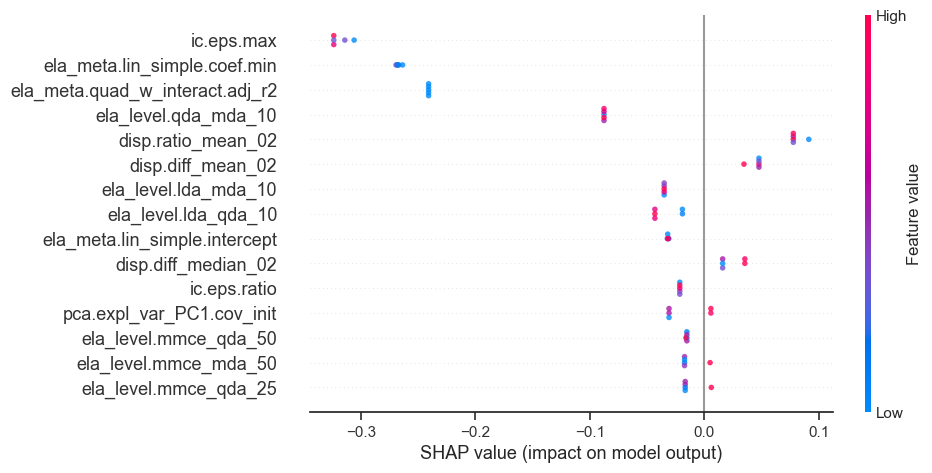

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.318154     1
40     ela_meta.lin_simple.coef.min            0.267129     2
45  ela_meta.quad_w_interact.adj_r2            0.240801     3
34             ela_level.qda_mda_10            0.087625     4
8                disp.ratio_mean_02            0.080424     5
(61, 3)
fold_number: 2
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
2    1              0.595655           0.577919           0.613376   
     2              0.640978           0.577101           0.580971   
     3              0.622812           0.633054           0.679990   
     4              0.574017           0.627918           0.578773   
     5              0.626357           0.591010           0.552060   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


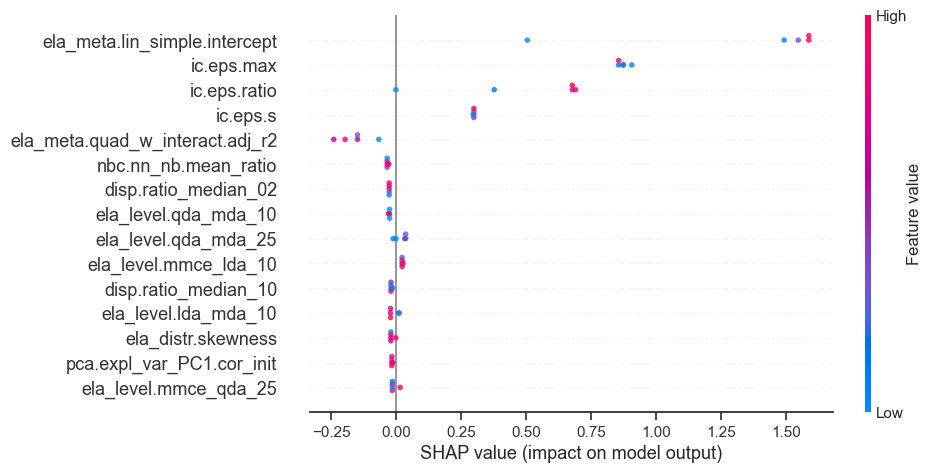

preview shap feature importance: 
                       feature_name  feature_importance  rank
41    ela_meta.lin_simple.intercept            1.344506     1
46                       ic.eps.max            0.873451     2
47                     ic.eps.ratio            0.484950     3
48                         ic.eps.s            0.298346     4
45  ela_meta.quad_w_interact.adj_r2            0.160620     5
(61, 3)
fold_number: 3
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
3    1             -0.829284          -0.826371          -0.848495   
     2             -0.766459          -0.698652          -0.631157   
     3             -0.528294          -0.451652          -0.420379   
     4             -0.743927          -0.700340          -0.682565   
     5             -0.862642          -0.896754          -0.950802   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


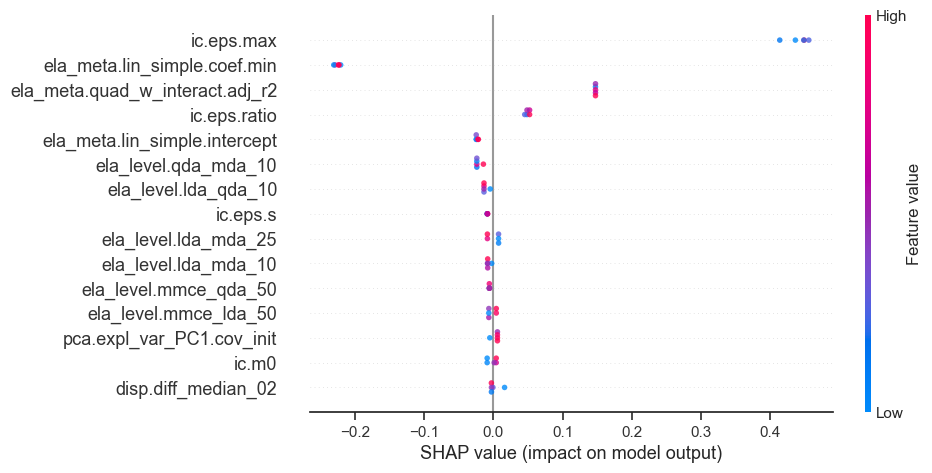

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.441336     1
40     ela_meta.lin_simple.coef.min            0.225941     2
45  ela_meta.quad_w_interact.adj_r2            0.147655     3
47                     ic.eps.ratio            0.049358     4
41    ela_meta.lin_simple.intercept            0.023804     5
(61, 3)
fold_number: 4
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
4    1             -0.718414          -0.802582          -0.814311   
     2             -0.614235          -0.652788          -0.580699   
     3             -0.766910          -0.781489          -0.730538   
     4             -0.764491          -0.795779          -0.782917   
     5             -0.719037          -0.761675          -0.754013   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


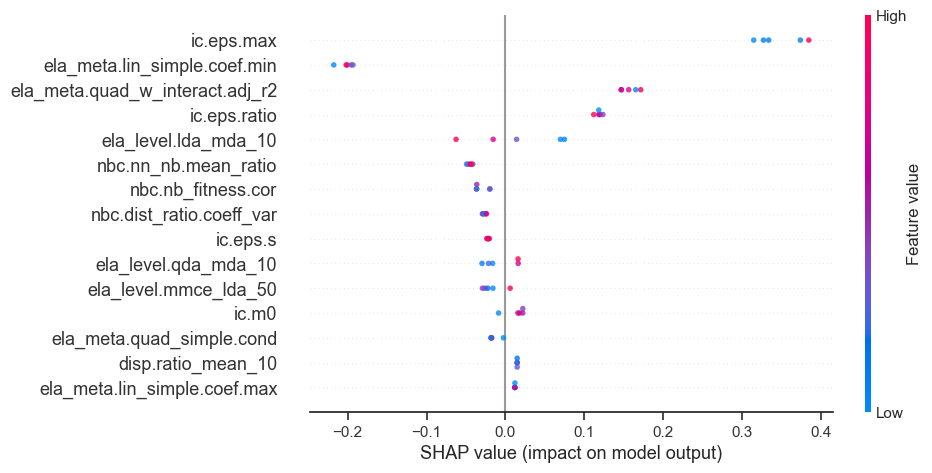

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.346575     1
40     ela_meta.lin_simple.coef.min            0.201771     2
45  ela_meta.quad_w_interact.adj_r2            0.157233     3
47                     ic.eps.ratio            0.118278     4
19             ela_level.lda_mda_10            0.047311     5
(61, 3)
fold_number: 5
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
5    1              0.610041           0.634696           0.704033   
     2              0.487651           0.546865           0.616124   
     3              0.546584           0.612693           0.653106   
     4              0.531404           0.617875           0.661067   
     5              0.533301           0.626922           0.726109   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


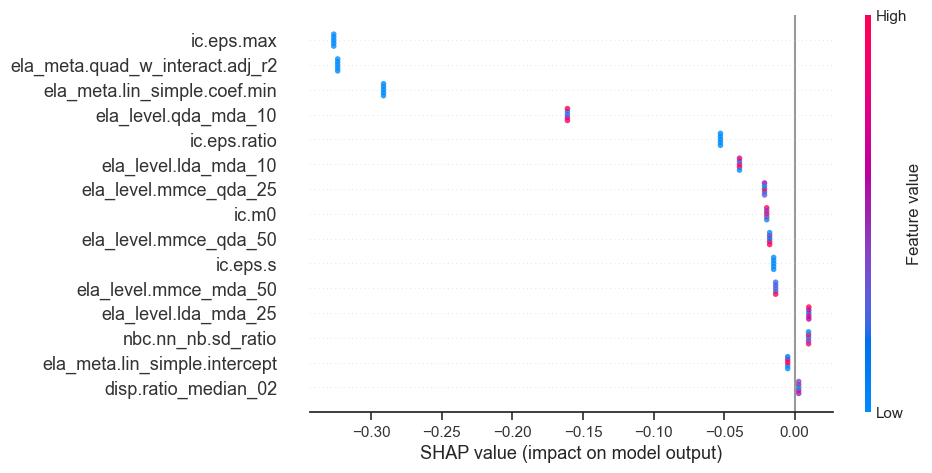

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.326508     1
45  ela_meta.quad_w_interact.adj_r2            0.323738     2
40     ela_meta.lin_simple.coef.min            0.291270     3
34             ela_level.qda_mda_10            0.161003     4
47                     ic.eps.ratio            0.052610     5
(61, 3)
fold_number: 6
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
6    1             -0.195052          -0.121671          -0.096817   
     2             -0.296754          -0.302734          -0.292017   
     3             -0.424281          -0.346272          -0.269681   
     4             -0.212051          -0.189643          -0.139081   
     5              0.024660          -0.038344          -0.048562   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


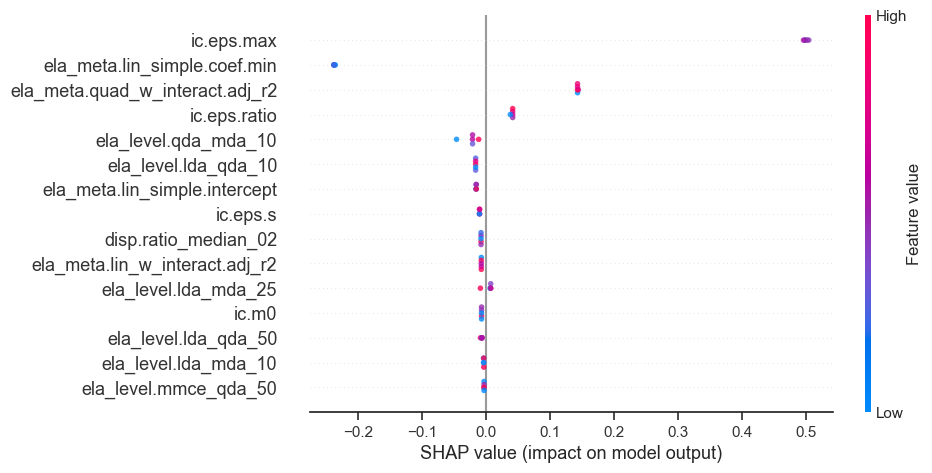

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.500309     1
40     ela_meta.lin_simple.coef.min            0.237421     2
45  ela_meta.quad_w_interact.adj_r2            0.143310     3
47                     ic.eps.ratio            0.040921     4
34             ela_level.qda_mda_10            0.024230     5
(61, 3)
fold_number: 7
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
7    1              0.156008           0.195944           0.193868   
     2              0.067167           0.103538           0.092347   
     3              0.103603           0.152021           0.195156   
     4             -0.282279          -0.233854          -0.198059   
     5             -0.159071          -0.129215          -0.057641   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


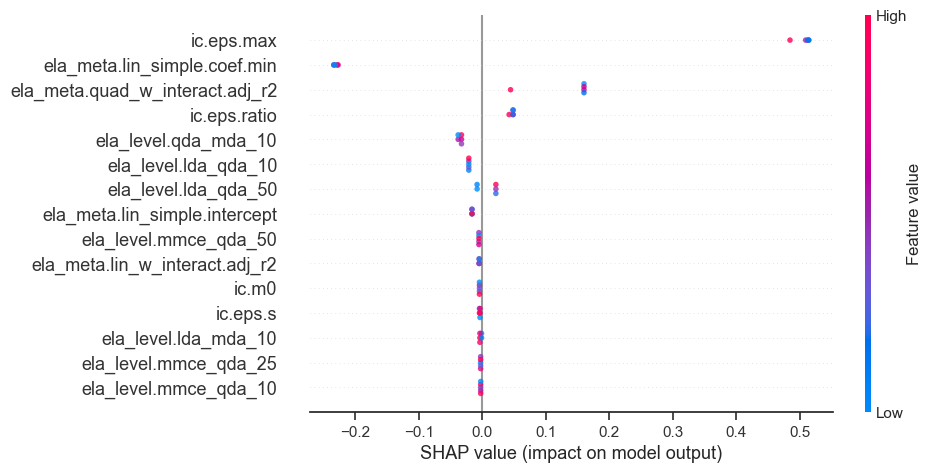

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.507294     1
40     ela_meta.lin_simple.coef.min            0.230980     2
45  ela_meta.quad_w_interact.adj_r2            0.137226     3
47                     ic.eps.ratio            0.047331     4
34             ela_level.qda_mda_10            0.034770     5
(61, 3)
fold_number: 8
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
8    1             -1.149544          -1.148980          -1.134050   
     2             -1.042040          -1.028308          -0.987327   
     3             -1.026401          -0.996951          -0.943527   
     4             -1.113325          -1.116930          -1.084246   
     5             -1.088548          -1.061605          -1.035358   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


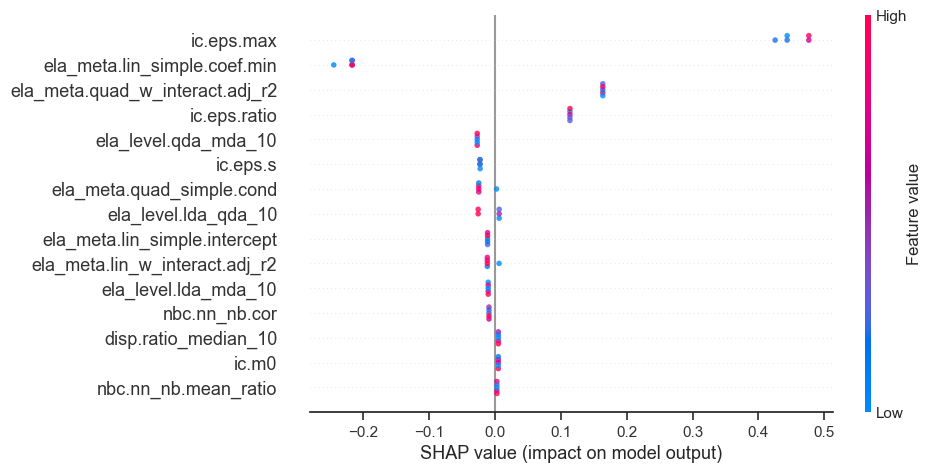

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.453140     1
40     ela_meta.lin_simple.coef.min            0.222329     2
45  ela_meta.quad_w_interact.adj_r2            0.163810     3
47                     ic.eps.ratio            0.113926     4
34             ela_level.qda_mda_10            0.026828     5
(61, 3)
fold_number: 9
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
9    1             -0.793271          -0.920365          -1.057360   
     2             -0.913301          -1.043042          -1.177044   
     3             -0.812190          -0.921975          -1.068605   
     4             -0.831146          -0.929886          -1.104981   
     5             -0.884886          -1.048055          -1.179052   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


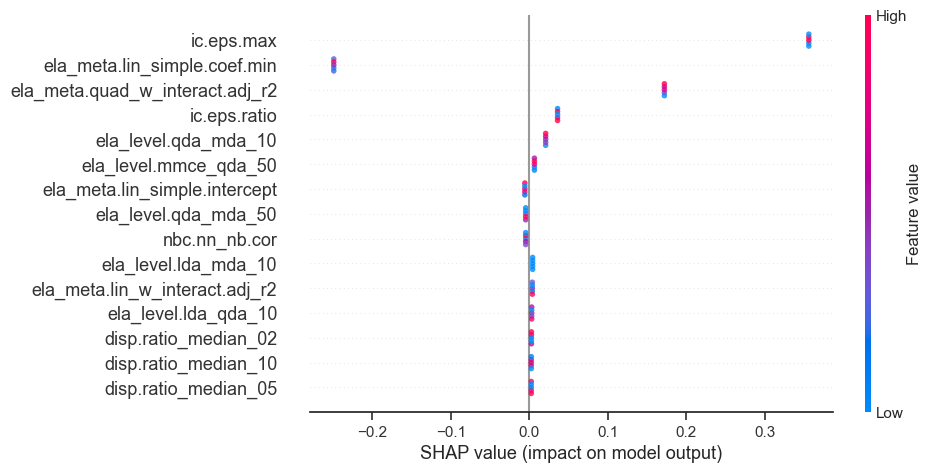

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.356356     1
40     ela_meta.lin_simple.coef.min            0.249064     2
45  ela_meta.quad_w_interact.adj_r2            0.172289     3
47                     ic.eps.ratio            0.036146     4
34             ela_level.qda_mda_10            0.021005     5
(61, 3)
fold_number: 10
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
10   1              0.671758           0.672580           0.688297   
     2              0.814386           0.801922           0.782018   
     3              0.933138           0.943057           0.978362   
     4              0.627313           0.573859           0.563109   
     5              0.838041           0.917234           0.963961   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


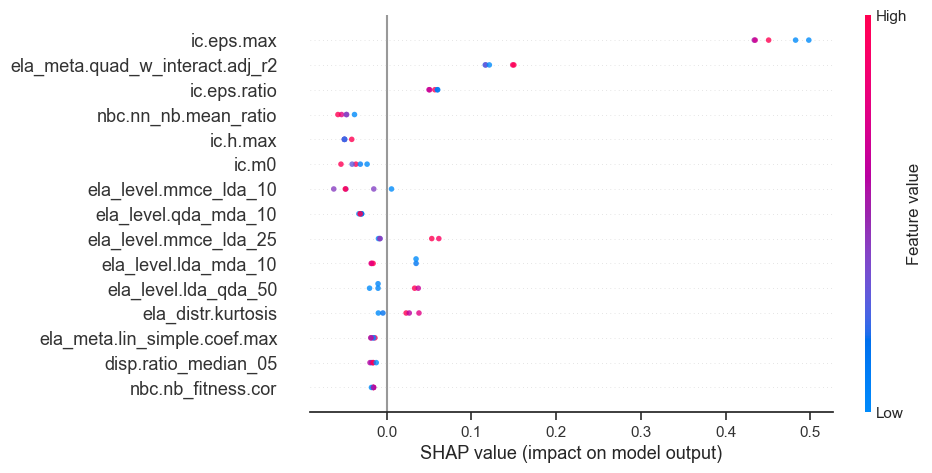

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.460033     1
45  ela_meta.quad_w_interact.adj_r2            0.130781     2
47                     ic.eps.ratio            0.055653     3
54             nbc.nn_nb.mean_ratio            0.048557     4
49                         ic.h.max            0.047905     5
(61, 3)
fold_number: 11
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
11   1              2.089045           2.058889           2.019232   
     2              2.057637           2.022270           1.942623   
     3              1.919613           1.866701           1.785745   
     4              1.896831           1.832611           1.709556   
     5              2.093751           2.064676           2.017672   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


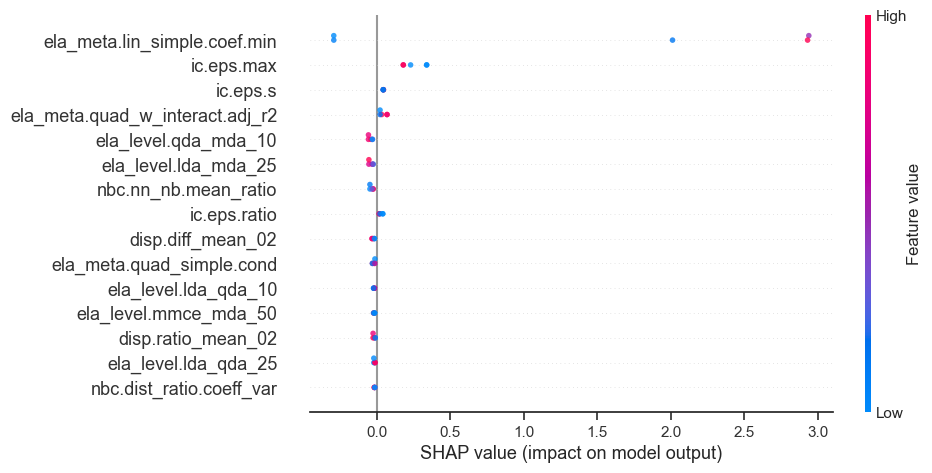

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            1.692215     1
46                       ic.eps.max            0.254024     2
48                         ic.eps.s            0.044750     3
45  ela_meta.quad_w_interact.adj_r2            0.043937     4
34             ela_level.qda_mda_10            0.041985     5
(61, 3)
fold_number: 12
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
12   1             -1.004537          -0.958086          -0.894406   
     2             -0.920556          -0.779378          -0.621318   
     3             -0.701182          -0.575075          -0.439806   
     4             -0.931474          -0.806938          -0.658355   
     5             -0.936969          -0.810184          -0.661290   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


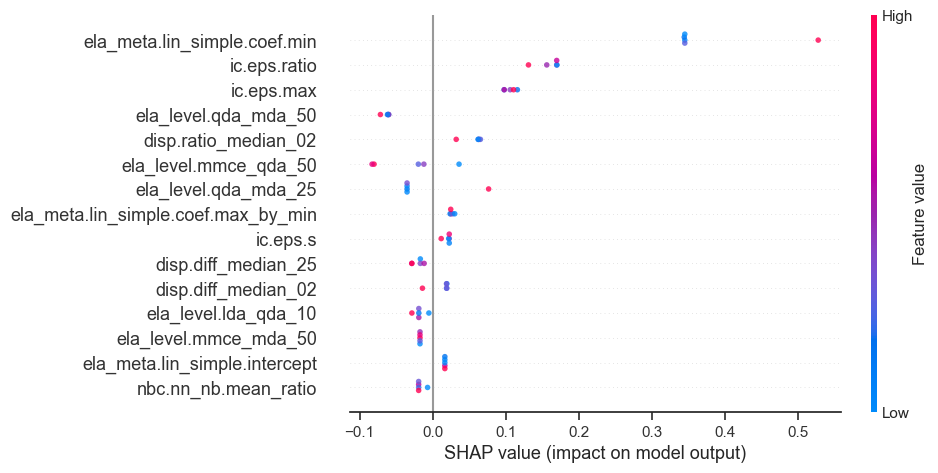

preview shap feature importance: 
                    feature_name  feature_importance  rank
40  ela_meta.lin_simple.coef.min            0.381912     1
47                  ic.eps.ratio            0.159625     2
46                    ic.eps.max            0.105917     3
36          ela_level.qda_mda_50            0.062990     4
12          disp.ratio_median_02            0.057319     5
(61, 3)
fold_number: 13
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
13   1             -0.830468          -0.755455          -0.656341   
     2             -0.679676          -0.556361          -0.494882   
     3             -0.792348          -0.754178          -0.707919   
     4             -0.781624          -0.724211          -0.704586   
     5             -0.804907          -0.828251          -0.855932   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


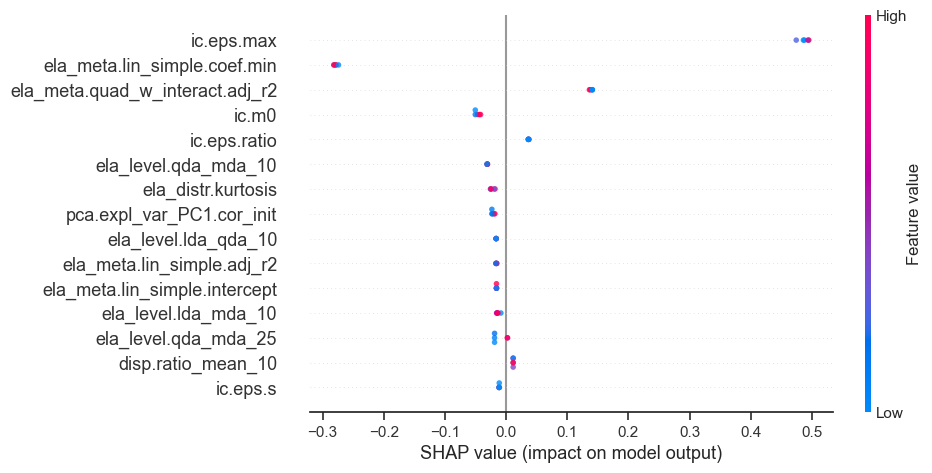

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.487324     1
40     ela_meta.lin_simple.coef.min            0.278742     2
45  ela_meta.quad_w_interact.adj_r2            0.139314     3
50                            ic.m0            0.046548     4
47                     ic.eps.ratio            0.036660     5
(61, 3)
fold_number: 14
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
14   1             -0.385992          -0.243033          -0.115901   
     2             -0.398480          -0.211356          -0.075269   
     3             -0.532602          -0.386145          -0.259512   
     4             -0.436743          -0.306975          -0.195933   
     5             -0.366588          -0.221568          -0.101238   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


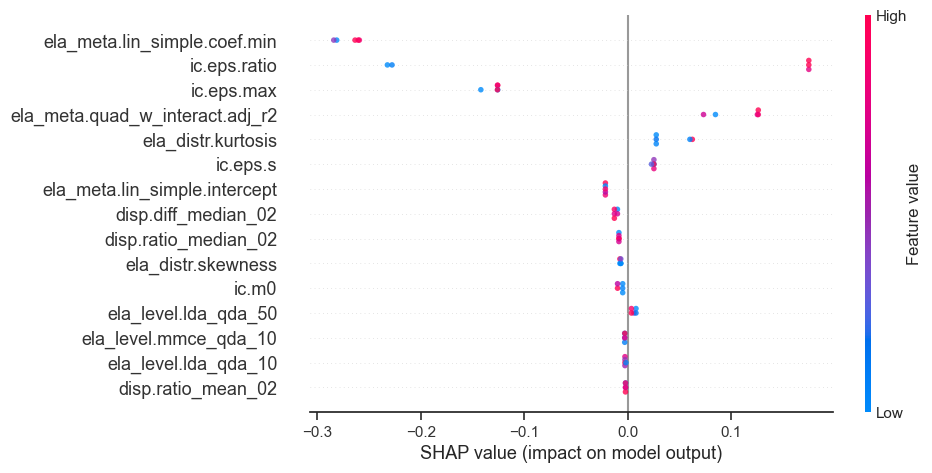

preview shap feature importance: 
                       feature_name  feature_importance  rank
40     ela_meta.lin_simple.coef.min            0.269794     1
47                     ic.eps.ratio            0.196927     2
46                       ic.eps.max            0.129104     3
45  ela_meta.quad_w_interact.adj_r2            0.106963     4
16               ela_distr.kurtosis            0.040896     5
(61, 3)
fold_number: 15
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
15   1             -0.916508          -0.855513          -0.835567   
     2             -0.717580          -0.687163          -0.616202   
     3             -0.759013          -0.604266          -0.504597   
     4             -0.782836          -0.732674          -0.681333   
     5             -0.868973          -0.865921          -0.893349   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


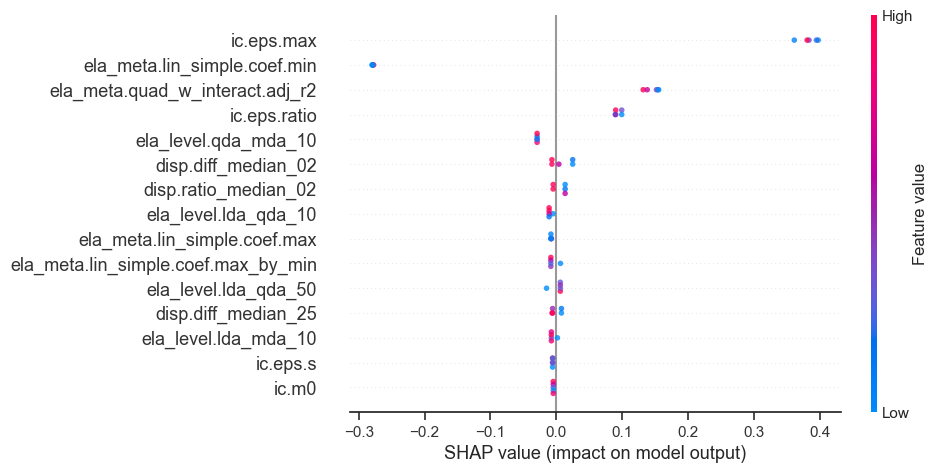

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.383862     1
40     ela_meta.lin_simple.coef.min            0.278815     2
45  ela_meta.quad_w_interact.adj_r2            0.146373     3
47                     ic.eps.ratio            0.093759     4
34             ela_level.qda_mda_10            0.029158     5
(61, 3)
fold_number: 16
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
16   1              2.434765           2.494474           2.550378   
     2              2.421768           2.507384           2.552332   
     3              2.424278           2.459489           2.524397   
     4              2.443430           2.503486           2.570305   
     5              2.432822           2.512144           2.553783   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


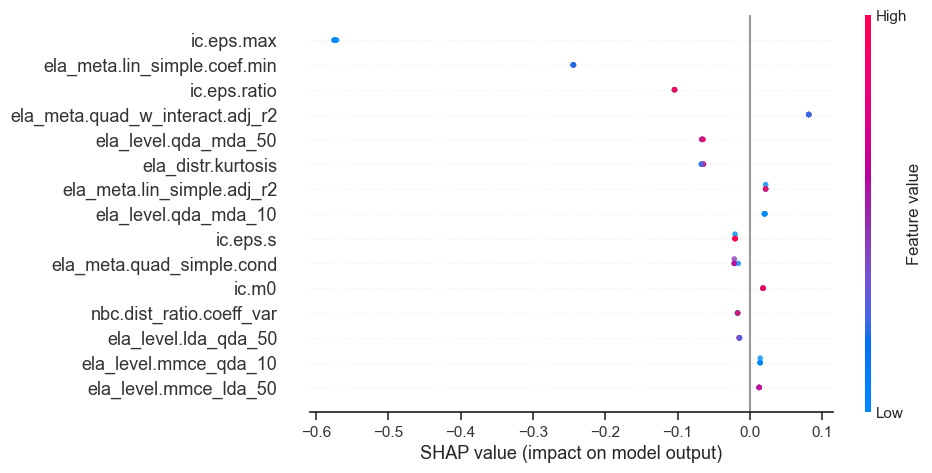

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.573813     1
40     ela_meta.lin_simple.coef.min            0.244167     2
47                     ic.eps.ratio            0.104217     3
45  ela_meta.quad_w_interact.adj_r2            0.081515     4
36             ela_level.qda_mda_50            0.065748     5
(61, 3)
fold_number: 17
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
17   1             -0.451864          -0.231918          -0.073917   
     2             -0.411901          -0.384980          -0.356872   
     3             -0.279831          -0.179240          -0.088529   
     4             -0.358666          -0.250441          -0.179059   
     5             -0.210923          -0.204269          -0.213491   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


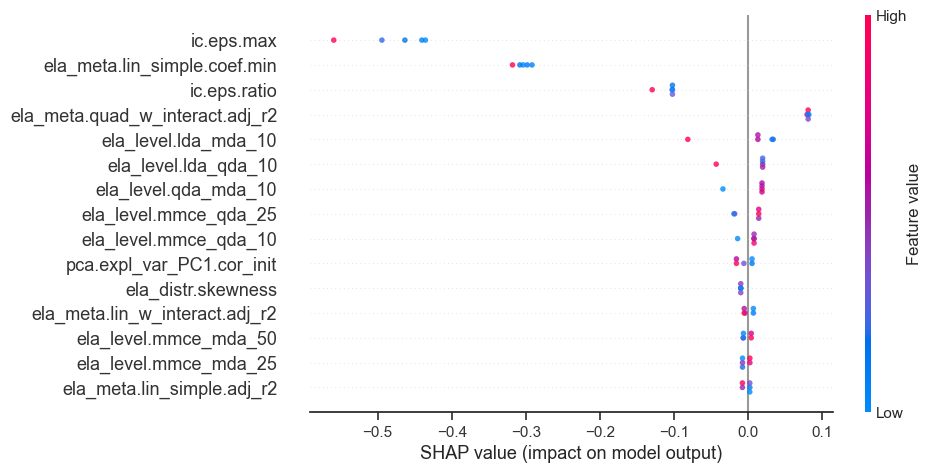

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.478535     1
40     ela_meta.lin_simple.coef.min            0.303725     2
47                     ic.eps.ratio            0.107280     3
45  ela_meta.quad_w_interact.adj_r2            0.081489     4
19             ela_level.lda_mda_10            0.035105     5
(61, 3)
fold_number: 18
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
18   1             -0.317335          -0.144194           0.048400   
     2             -0.115876          -0.150873          -0.160508   
     3             -0.090471           0.017673           0.114753   
     4             -0.171004          -0.132100          -0.099301   
     5              0.067800           0.037800           0.006943   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


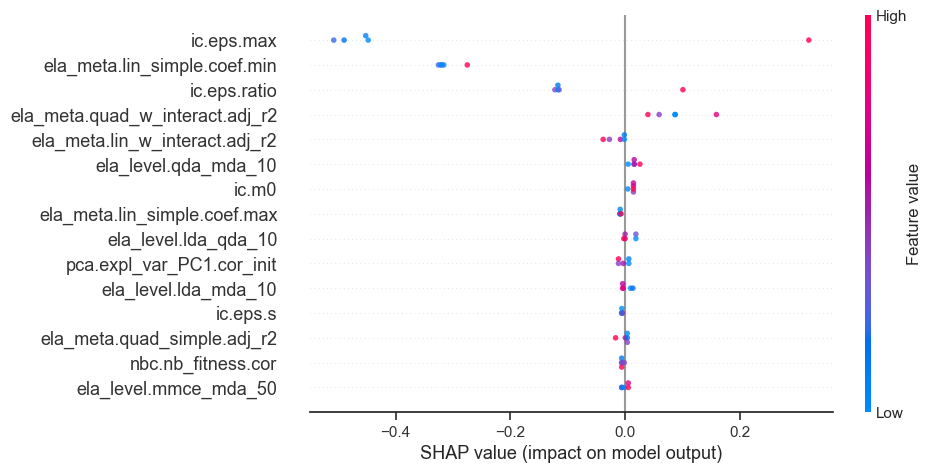

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.443292     1
40     ela_meta.lin_simple.coef.min            0.311637     2
47                     ic.eps.ratio            0.114582     3
45  ela_meta.quad_w_interact.adj_r2            0.086000     4
42   ela_meta.lin_w_interact.adj_r2            0.015667     5
(61, 3)
fold_number: 19
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
19   1             -0.704932          -0.856182          -1.044341   
     2             -0.824420          -1.002919          -1.166635   
     3             -0.700971          -0.868938          -1.032828   
     4             -0.748429          -0.921521          -1.098013   
     5             -0.692022          -0.887383          -1.057516   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


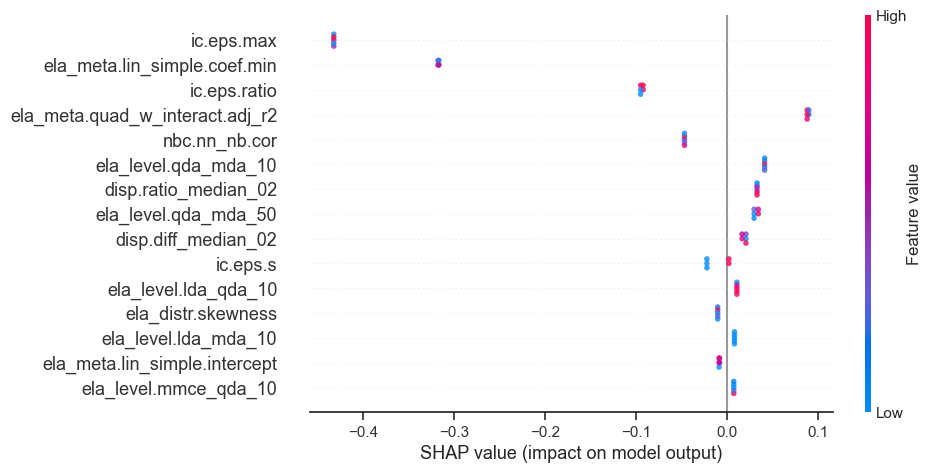

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.432034     1
40     ela_meta.lin_simple.coef.min            0.316911     2
47                     ic.eps.ratio            0.093541     3
45  ela_meta.quad_w_interact.adj_r2            0.089210     4
53                    nbc.nn_nb.cor            0.046387     5
(61, 3)
fold_number: 20
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
20   1             -0.759997          -0.804262          -0.815284   
     2             -0.710630          -0.708234          -0.720233   
     3             -0.708246          -0.765814          -0.758276   
     4             -0.759337          -0.795221          -0.798017   
     5             -0.744739          -0.753713          -0.724819   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


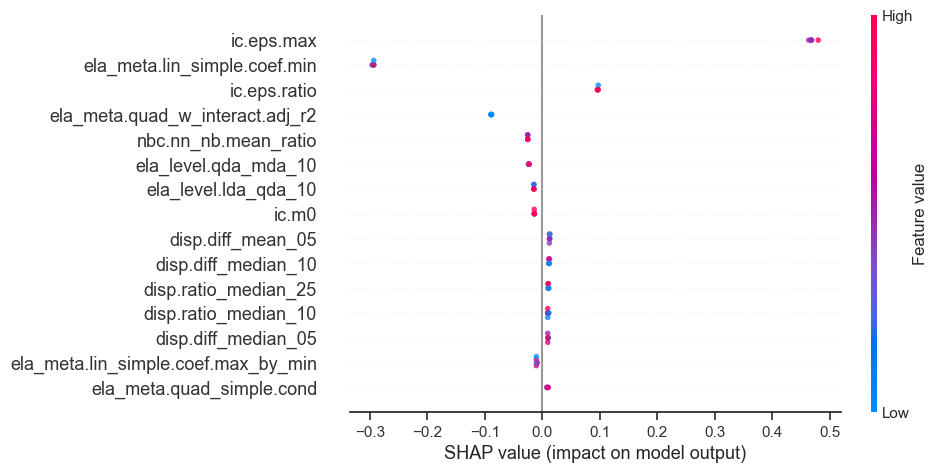

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.469879     1
40     ela_meta.lin_simple.coef.min            0.293926     2
47                     ic.eps.ratio            0.096736     3
45  ela_meta.quad_w_interact.adj_r2            0.088749     4
54             nbc.nn_nb.mean_ratio            0.025194     5
(61, 3)
fold_number: 21
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
21   1              1.414631           1.256553           1.080071   
     2              1.417963           1.278483           1.130253   
     3              0.959593           0.890307           0.726808   
     4              1.163388           1.040951           0.877409   
     5              1.282624           1.056219           0.830531   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


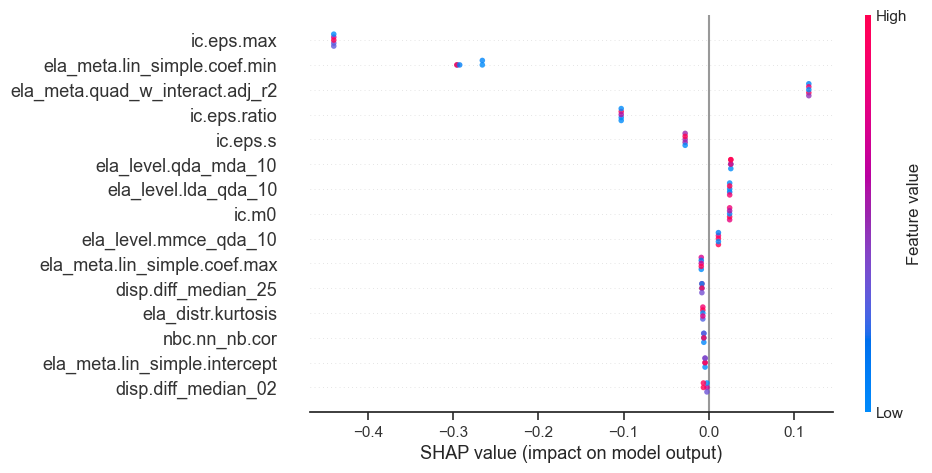

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.440173     1
40     ela_meta.lin_simple.coef.min            0.283034     2
45  ela_meta.quad_w_interact.adj_r2            0.117225     3
47                     ic.eps.ratio            0.102878     4
48                         ic.eps.s            0.027855     5
(61, 3)
fold_number: 22
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
22   1              0.669593           0.598891           0.486788   
     2              0.878391           0.744723           0.607309   
     3              1.416490           1.274325           1.110488   
     4              0.796306           0.742891           0.663525   
     5              0.921060           0.764234           0.625067   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


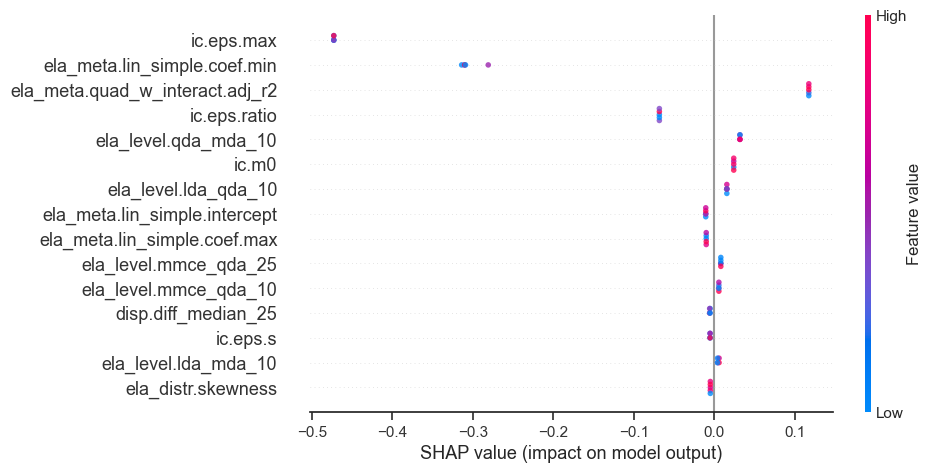

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.472926     1
40     ela_meta.lin_simple.coef.min            0.304885     2
45  ela_meta.quad_w_interact.adj_r2            0.117690     3
47                     ic.eps.ratio            0.068120     4
34             ela_level.qda_mda_10            0.032054     5
(61, 3)
fold_number: 23
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
23   1              2.451738           2.512006           2.603447   
     2              2.455186           2.504204           2.548364   
     3              2.417544           2.516818           2.559721   
     4              2.447519           2.468389           2.536250   
     5              2.494247           2.509574           2.536502   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


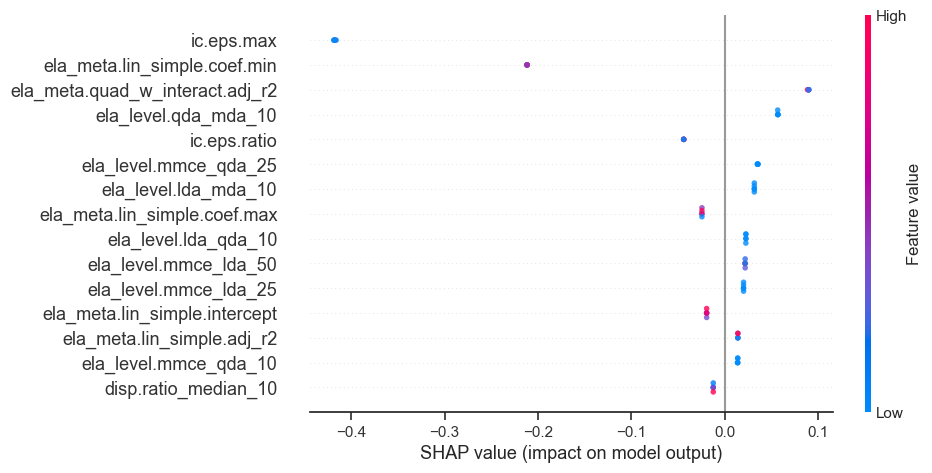

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.417492     1
40     ela_meta.lin_simple.coef.min            0.211710     2
45  ela_meta.quad_w_interact.adj_r2            0.089430     3
34             ela_level.qda_mda_10            0.056631     4
47                     ic.eps.ratio            0.044071     5
(61, 3)
fold_number: 24
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
24   1             -0.675545          -0.852147          -0.986172   
     2             -0.691376          -0.833461          -0.964601   
     3             -0.700867          -0.858513          -0.984574   
     4             -0.752024          -0.870925          -1.025831   
     5             -0.719117          -0.869093          -0.984574   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


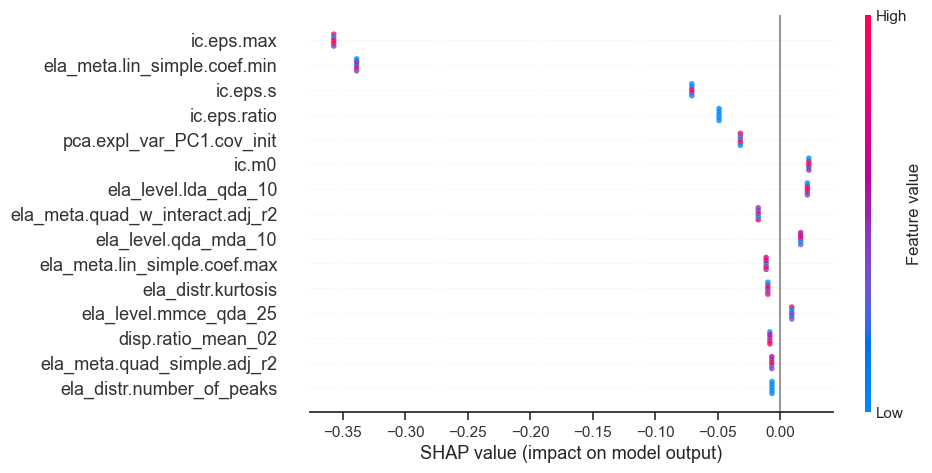

preview shap feature importance: 
                    feature_name  feature_importance  rank
46                    ic.eps.max            0.357185     1
40  ela_meta.lin_simple.coef.min            0.338889     2
48                      ic.eps.s            0.070693     3
47                  ic.eps.ratio            0.048892     4
60     pca.expl_var_PC1.cov_init            0.031876     5
(61, 3)
algorithm name: DE2
budget: 5000
dataset: train
fold_number: 1
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
2    1              0.532267           0.515056           0.552000   
     2              0.578658           0.514219           0.518899   
     3              0.560064           0.571474           0.620045   
     4              0.510119           0.566219           0.516654   
     5              0.563693           0.528451           0.489367   

           disp.diff_mean_25  disp.

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


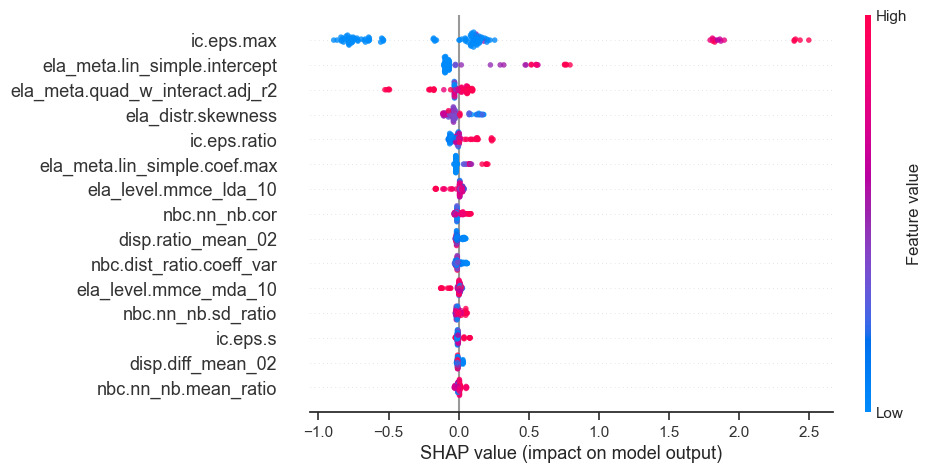

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.605265     1
41    ela_meta.lin_simple.intercept            0.148348     2
45  ela_meta.quad_w_interact.adj_r2            0.075132     3
18               ela_distr.skewness            0.062633     4
47                     ic.eps.ratio            0.045268     5
(61, 3)
fold_number: 2
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.339078          -1.389661          -1.411350   
     2             -0.969076          -0.945719          -0.873538   
     3             -0.993784          -0.936401          -0.911410   
     4             -1.138232          -1.118260          -1.066391   
     5             -1.199783          -1.179622          -1.125340   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


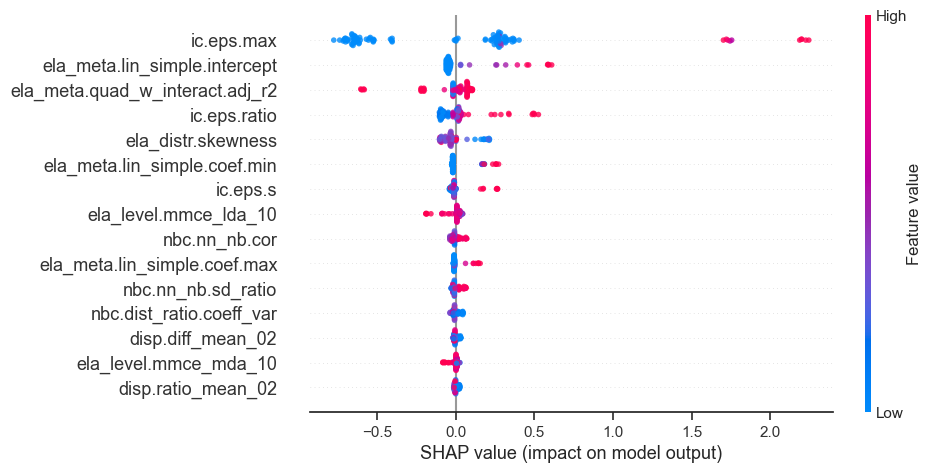

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.559500     1
41    ela_meta.lin_simple.intercept            0.088185     2
45  ela_meta.quad_w_interact.adj_r2            0.084068     3
47                     ic.eps.ratio            0.078366     4
18               ela_distr.skewness            0.067003     5
(61, 3)
fold_number: 3
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.401136          -1.449504          -1.470875   
     2             -1.029651          -1.003992          -0.931178   
     3             -1.054458          -0.994642          -0.969182   
     4             -1.199485          -1.177143          -1.124707   
     5             -1.261283          -1.238722          -1.183862   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


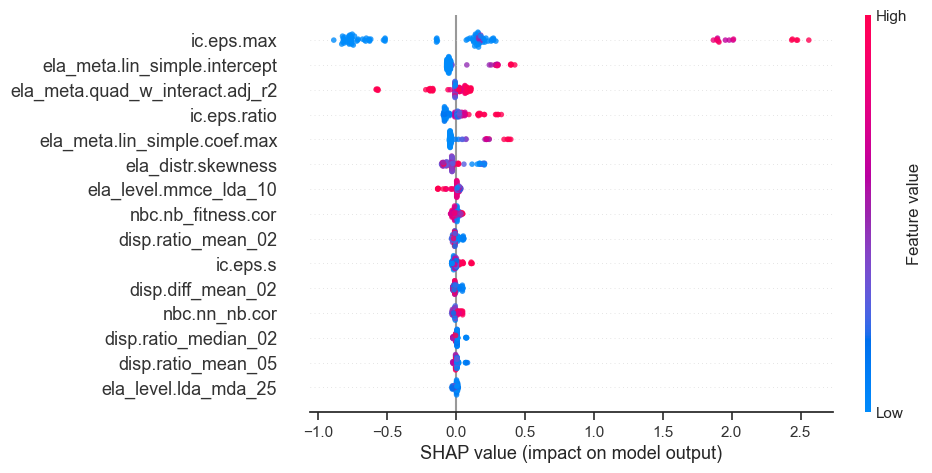

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.661189     1
41    ela_meta.lin_simple.intercept            0.090547     2
45  ela_meta.quad_w_interact.adj_r2            0.082800     3
47                     ic.eps.ratio            0.072119     4
38     ela_meta.lin_simple.coef.max            0.066448     5
(61, 3)
fold_number: 4
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.398394          -1.452617          -1.472214   
     2             -1.027319          -1.006705          -0.932417   
     3             -1.052099          -0.997346          -0.970429   
     4             -1.196966          -1.180011          -1.125982   
     5             -1.258696          -1.241645          -1.185148   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


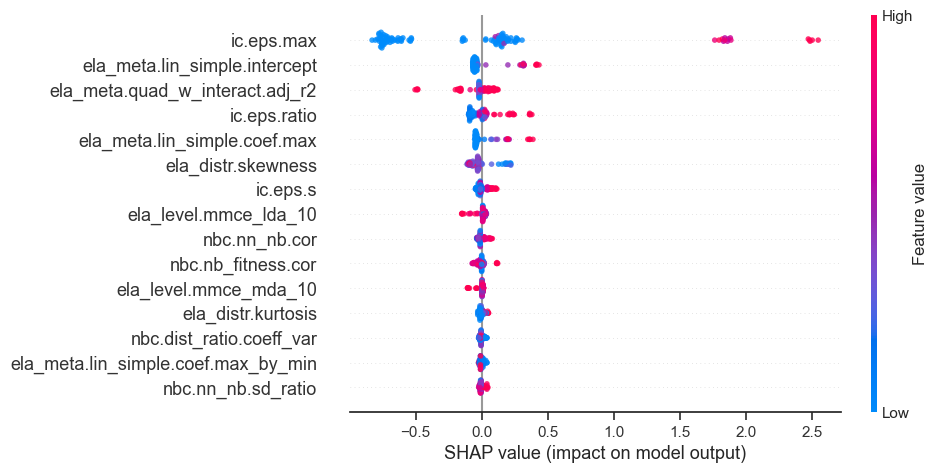

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.638847     1
41    ela_meta.lin_simple.intercept            0.090275     2
45  ela_meta.quad_w_interact.adj_r2            0.076316     3
47                     ic.eps.ratio            0.075769     4
38     ela_meta.lin_simple.coef.max            0.067555     5
(61, 3)
fold_number: 5
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.339762          -1.389631          -1.411040   
     2             -0.970368          -0.945615          -0.872236   
     3             -0.995035          -0.936295          -0.910178   
     4             -1.139246          -1.118184          -1.065445   
     5             -1.200697          -1.179556          -1.124502   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


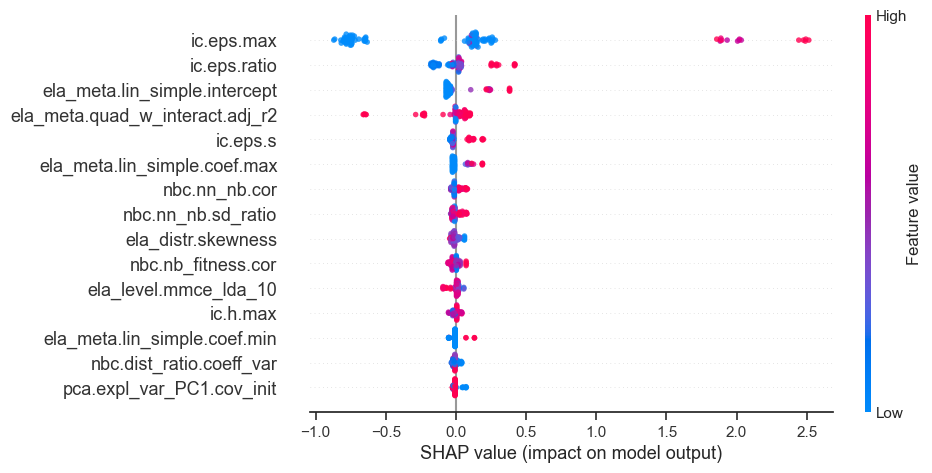

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.634406     1
47                     ic.eps.ratio            0.099122     2
41    ela_meta.lin_simple.intercept            0.085915     3
45  ela_meta.quad_w_interact.adj_r2            0.084236     4
48                         ic.eps.s            0.042736     5
(61, 3)
fold_number: 6
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.365241          -1.414042          -1.433830   
     2             -0.997552          -0.972924          -0.899618   
     3             -1.022106          -0.963665          -0.937236   
     4             -1.165651          -1.144367          -1.091180   
     5             -1.226818          -1.205338          -1.149734   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


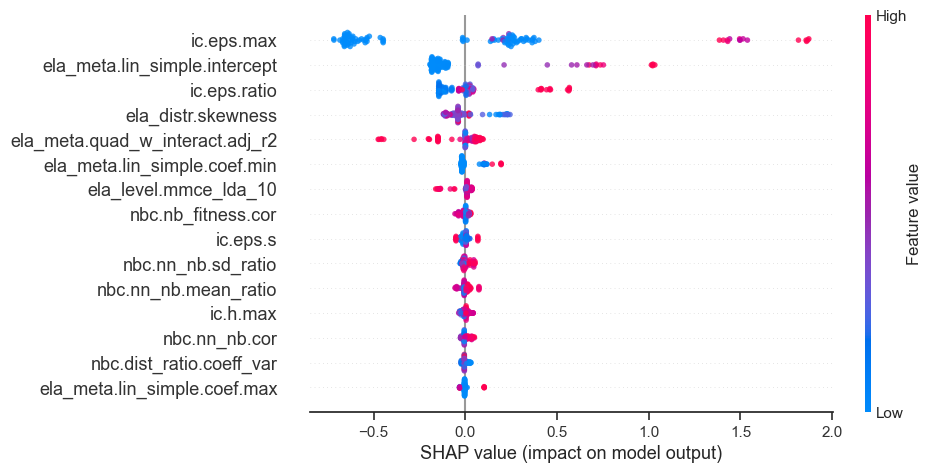

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.571573     1
41    ela_meta.lin_simple.intercept            0.234589     2
47                     ic.eps.ratio            0.119972     3
18               ela_distr.skewness            0.074376     4
45  ela_meta.quad_w_interact.adj_r2            0.068566     5
(61, 3)
fold_number: 7
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.355841          -1.404300          -1.424546   
     2             -0.988467          -0.963396          -0.890466   
     3             -1.013000          -0.954142          -0.928075   
     4             -1.156422          -1.134756          -1.081981   
     5             -1.217536          -1.195698          -1.140521   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


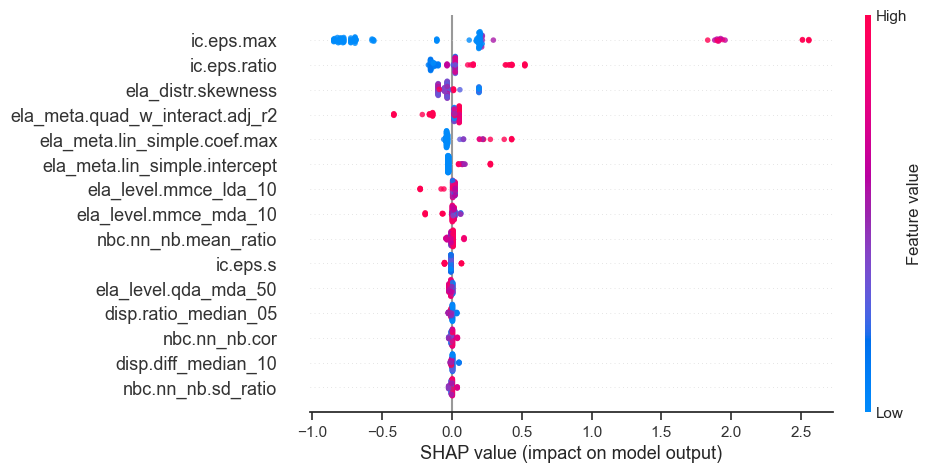

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.678776     1
47                     ic.eps.ratio            0.129560     2
18               ela_distr.skewness            0.072803     3
45  ela_meta.quad_w_interact.adj_r2            0.066699     4
38     ela_meta.lin_simple.coef.max            0.065016     5
(61, 3)
fold_number: 8
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.432010          -1.481996          -1.500571   
     2             -1.055970          -1.030940          -0.954906   
     3             -1.081082          -1.021473          -0.993331   
     4             -1.227887          -1.206246          -1.150575   
     5             -1.290443          -1.268591          -1.210384   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


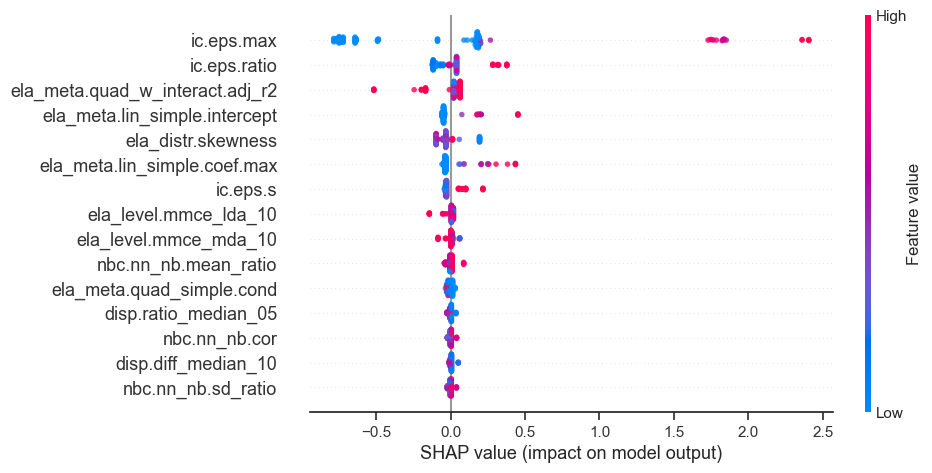

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.629242     1
47                     ic.eps.ratio            0.098049     2
45  ela_meta.quad_w_interact.adj_r2            0.079271     3
41    ela_meta.lin_simple.intercept            0.078729     4
18               ela_distr.skewness            0.072778     5
(61, 3)
fold_number: 9
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.409472          -1.472203          -1.508899   
     2             -1.036865          -1.022941          -0.961372   
     3             -1.061748          -1.013511          -0.999928   
     4             -1.207212          -1.197549          -1.157708   
     5             -1.269197          -1.259646          -1.217722   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


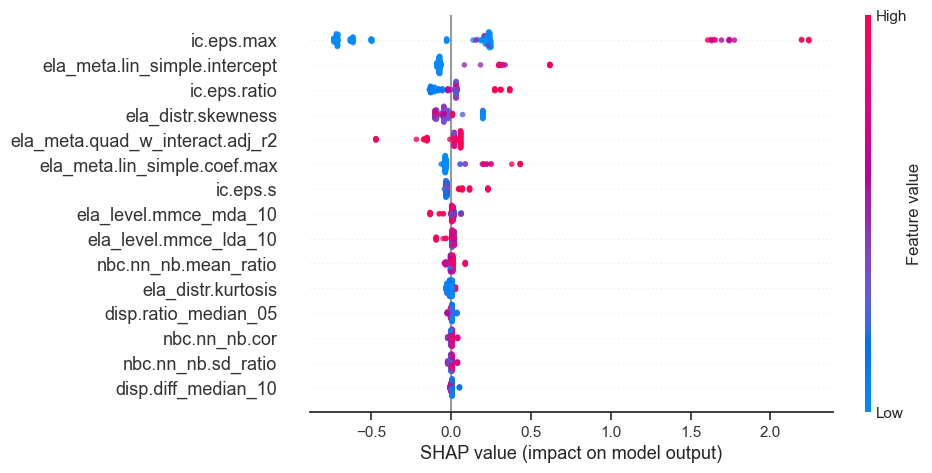

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.617947     1
41    ela_meta.lin_simple.intercept            0.120627     2
47                     ic.eps.ratio            0.097120     3
18               ela_distr.skewness            0.075545     4
45  ela_meta.quad_w_interact.adj_r2            0.072341     5
(61, 3)
fold_number: 10
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.338952          -1.389955          -1.411950   
     2             -0.967121          -0.943563          -0.870885   
     3             -0.991951          -0.934194          -0.908986   
     4             -1.137113          -1.117056          -1.064904   
     5             -1.198969          -1.178757          -1.124210   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


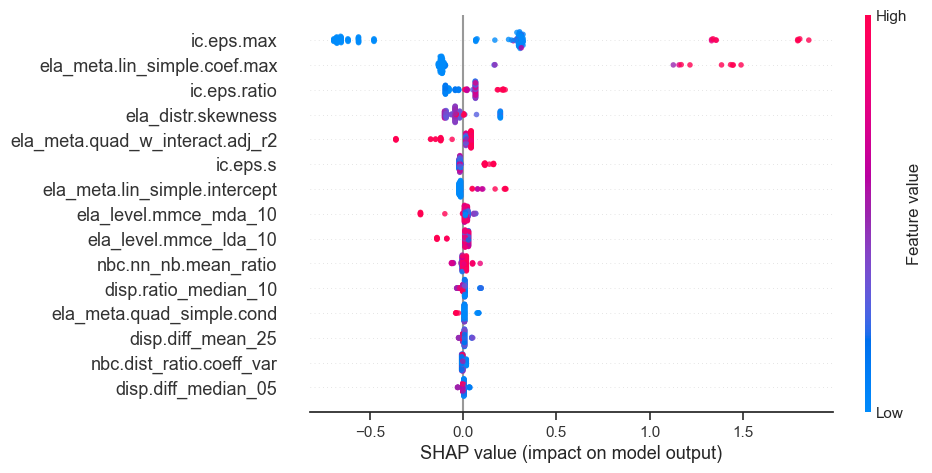

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.539798     1
38     ela_meta.lin_simple.coef.max            0.212762     2
47                     ic.eps.ratio            0.077637     3
18               ela_distr.skewness            0.074618     4
45  ela_meta.quad_w_interact.adj_r2            0.056553     5
(61, 3)
fold_number: 11
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.380109          -1.431570          -1.450081   
     2             -0.983171          -0.956595          -0.877581   
     3             -1.009678          -0.946626          -0.917896   
     4             -1.164642          -1.141196          -1.082873   
     5             -1.230674          -1.206848          -1.145624   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


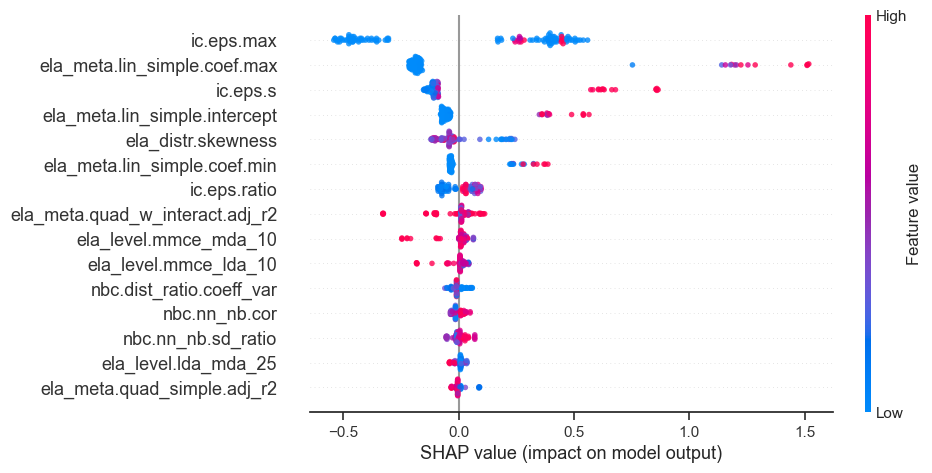

preview shap feature importance: 
                     feature_name  feature_importance  rank
46                     ic.eps.max            0.404497     1
38   ela_meta.lin_simple.coef.max            0.327652     2
48                       ic.eps.s            0.185738     3
41  ela_meta.lin_simple.intercept            0.105804     4
18             ela_distr.skewness            0.072937     5
(61, 3)
fold_number: 12
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.414407          -1.455316          -1.466269   
     2             -1.041050          -1.008911          -0.927490   
     3             -1.065982          -0.999541          -0.965430   
     4             -1.211740          -1.182409          -1.120689   
     5             -1.273850          -1.244111          -1.179744   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_ini

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


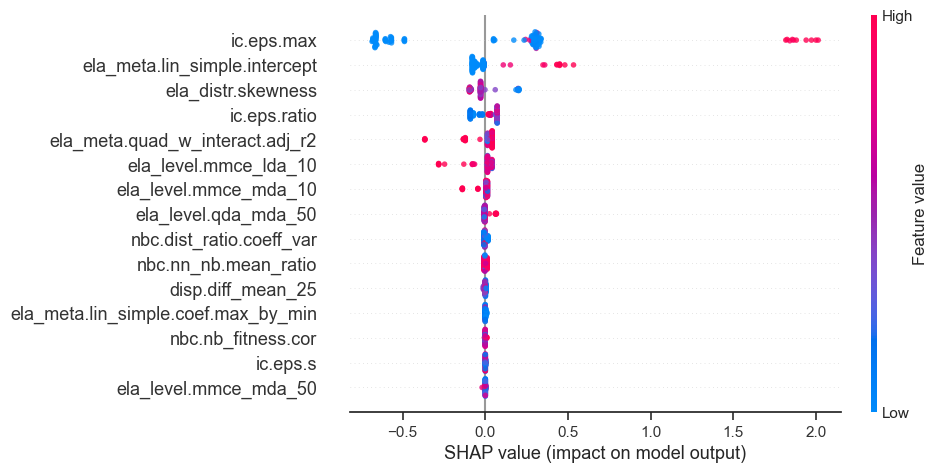

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.566338     1
41    ela_meta.lin_simple.intercept            0.088925     2
18               ela_distr.skewness            0.069380     3
47                     ic.eps.ratio            0.066427     4
45  ela_meta.quad_w_interact.adj_r2            0.055146     5
(61, 3)
fold_number: 13
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.403482          -1.449799          -1.468379   
     2             -1.031719          -1.004312          -0.929261   
     3             -1.056545          -0.994961          -0.967225   
     4             -1.201680          -1.177453          -1.122582   
     5             -1.263524          -1.239029          -1.181674   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


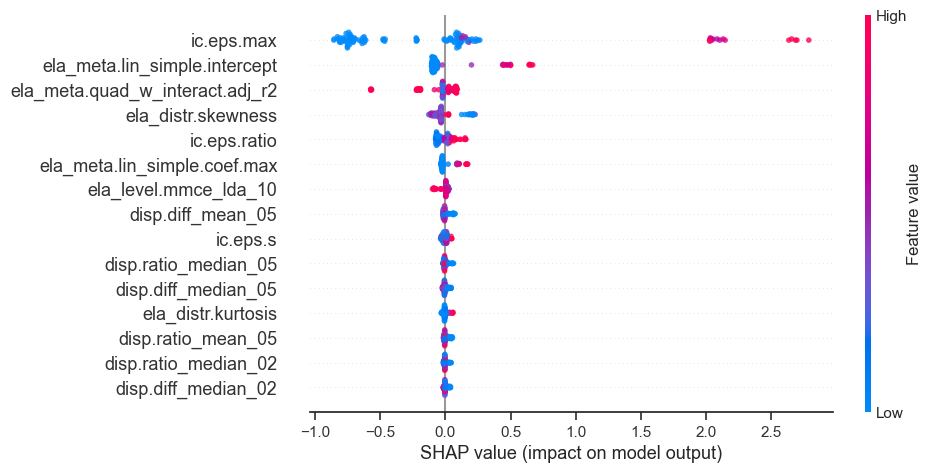

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.653622     1
41    ela_meta.lin_simple.intercept            0.143964     2
45  ela_meta.quad_w_interact.adj_r2            0.087340     3
18               ela_distr.skewness            0.072698     4
47                     ic.eps.ratio            0.050141     5
(61, 3)
fold_number: 14
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.376872          -1.417891          -1.432685   
     2             -1.008327          -0.976534          -0.898595   
     3             -1.032938          -0.967270          -0.936204   
     4             -1.176817          -1.148070          -1.090113   
     5             -1.238126          -1.209075          -1.148654   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


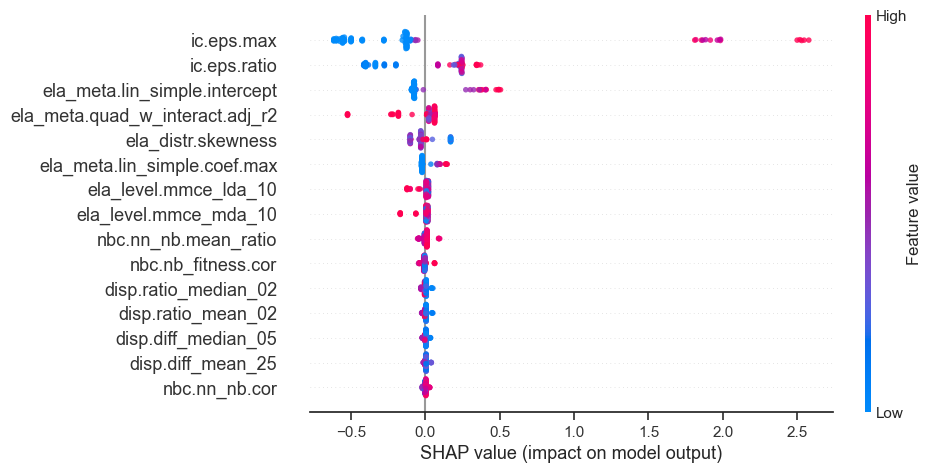

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.547594     1
47                     ic.eps.ratio            0.280901     2
41    ela_meta.lin_simple.intercept            0.121886     3
45  ela_meta.quad_w_interact.adj_r2            0.083785     4
18               ela_distr.skewness            0.065745     5
(61, 3)
fold_number: 15
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.406236          -1.451997          -1.470427   
     2             -1.034078          -1.006152          -0.930889   
     3             -1.058930          -0.996794          -0.968883   
     4             -1.204220          -1.179432          -1.124361   
     5             -1.266130          -1.241057          -1.183499   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


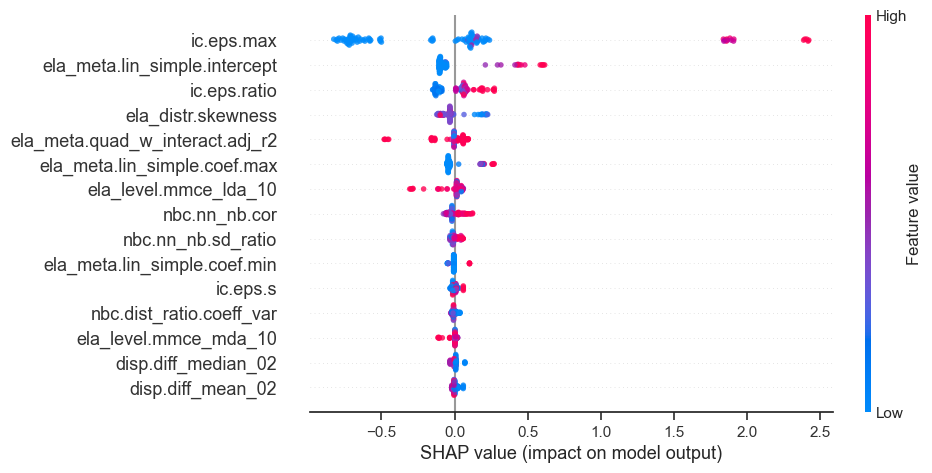

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.615033     1
41    ela_meta.lin_simple.intercept            0.139503     2
47                     ic.eps.ratio            0.105556     3
18               ela_distr.skewness            0.070732     4
45  ela_meta.quad_w_interact.adj_r2            0.066864     5
(61, 3)
fold_number: 16
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.410323          -1.471862          -1.500991   
     2             -1.000448          -0.977362          -0.899207   
     3             -1.027819          -0.966982          -0.941583   
     4             -1.187833          -1.169552          -1.114999   
     5             -1.256018          -1.237902          -1.180960   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


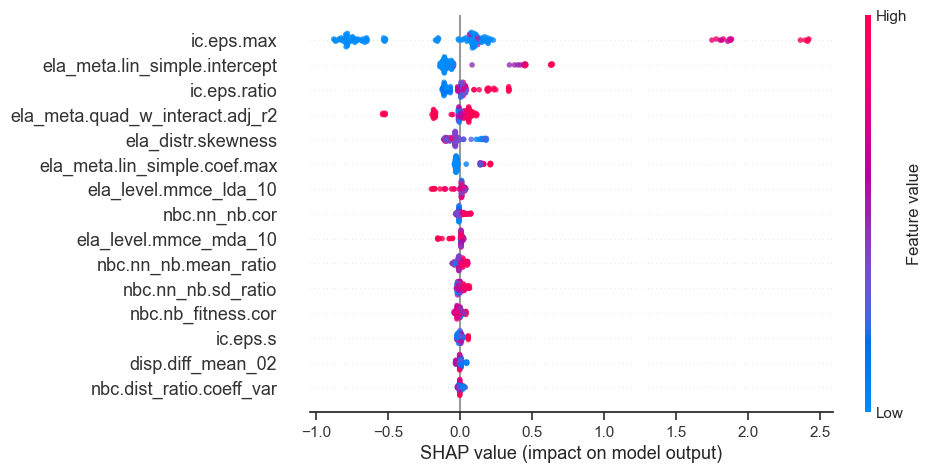

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.600441     1
41    ela_meta.lin_simple.intercept            0.151107     2
47                     ic.eps.ratio            0.080759     3
45  ela_meta.quad_w_interact.adj_r2            0.079168     4
18               ela_distr.skewness            0.064032     5
(61, 3)
fold_number: 17
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.371845          -1.416570          -1.434553   
     2             -1.003744          -0.975319          -0.900275   
     3             -1.028325          -0.966057          -0.937898   
     4             -1.172031          -1.146814          -1.091860   
     5             -1.233266          -1.207804          -1.150422   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


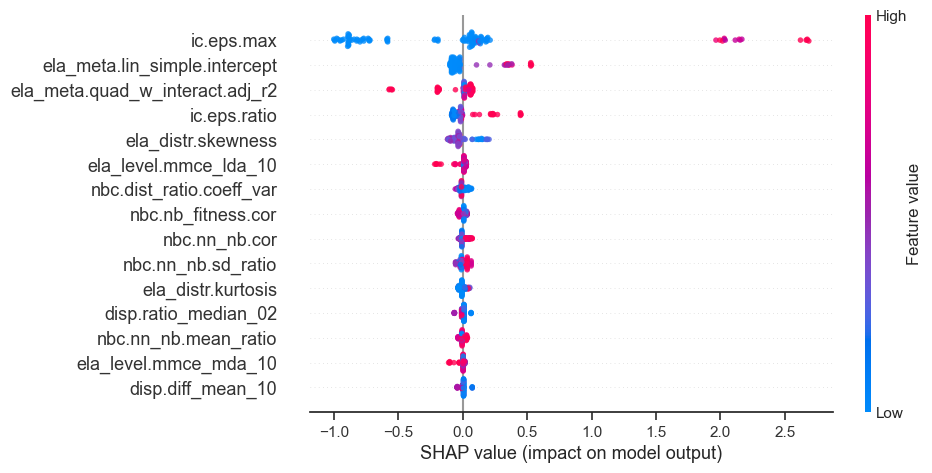

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.664439     1
41    ela_meta.lin_simple.intercept            0.110515     2
45  ela_meta.quad_w_interact.adj_r2            0.079552     3
47                     ic.eps.ratio            0.076117     4
18               ela_distr.skewness            0.060215     5
(61, 3)
fold_number: 18
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.360160          -1.407634          -1.426709   
     2             -0.992772          -0.966888          -0.892803   
     3             -1.017306          -0.957637          -0.930400   
     4             -1.160733          -1.138186          -1.084255   
     5             -1.221850          -1.199106          -1.142776   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


Preview shapley values: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1              0.003580           0.000863          -0.003136   
     2              0.003983           0.002941          -0.000207   
     3              0.004682           0.003083           0.000023   
     4              0.003209           0.003326           0.000641   
     5              0.003216           0.003104           0.000520   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                          ...                          
1    1              0.001365             0.000826  ...               0.000683   
     2              0.004701             0.000886  ...               0.000511   
     3              0.005417             0.000761  ...               0.000542   
     4              0.005057             0.000686  ...               0.000697  

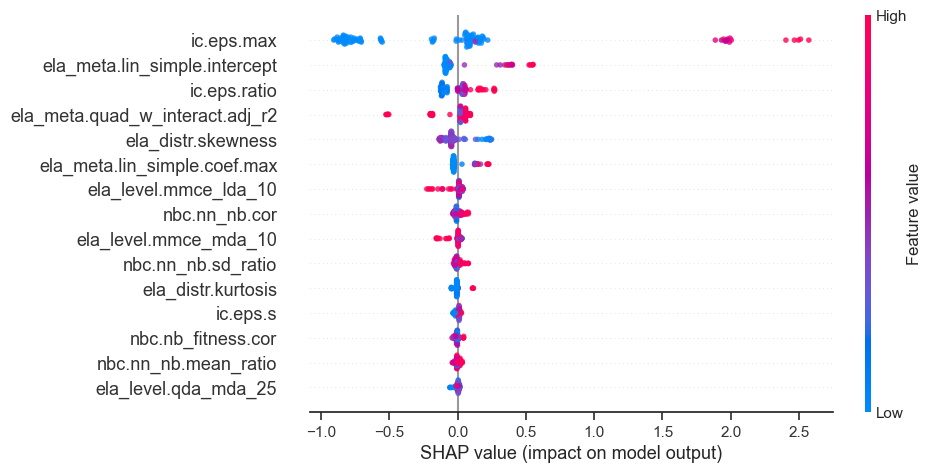

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.636323     1
41    ela_meta.lin_simple.intercept            0.124973     2
47                     ic.eps.ratio            0.084698     3
45  ela_meta.quad_w_interact.adj_r2            0.083051     4
18               ela_distr.skewness            0.082800     5
(61, 3)
fold_number: 19
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.399816          -1.465934          -1.504934   
     2             -1.028554          -1.017785          -0.958306   
     3             -1.053346          -1.008379          -0.996799   
     4             -1.198286          -1.191961          -1.154320   
     5             -1.260047          -1.253904          -1.214236   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


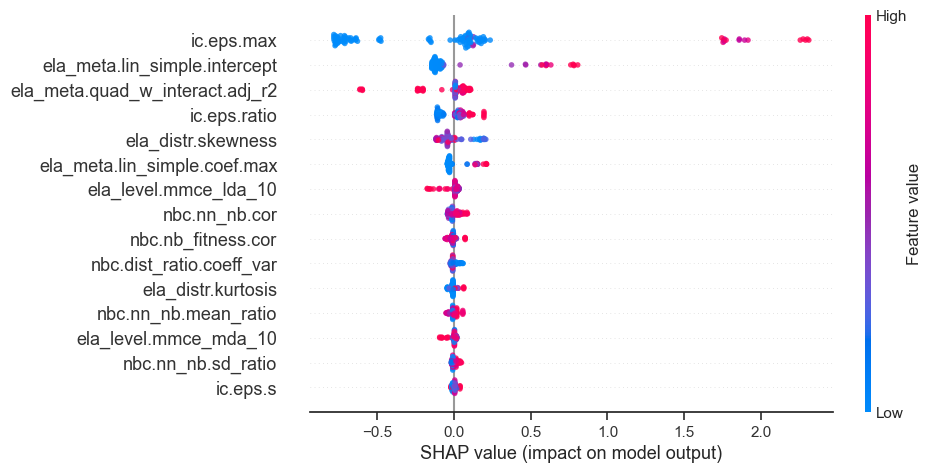

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.578178     1
41    ela_meta.lin_simple.intercept            0.183244     2
45  ela_meta.quad_w_interact.adj_r2            0.089669     3
47                     ic.eps.ratio            0.072167     4
18               ela_distr.skewness            0.069324     5
(61, 3)
fold_number: 20
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.399962          -1.453126          -1.474696   
     2             -1.028688          -1.007140          -0.934451   
     3             -1.053481          -0.997780          -0.972494   
     4             -1.198426          -1.180475          -1.128176   
     5             -1.260189          -1.242120          -1.187392   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


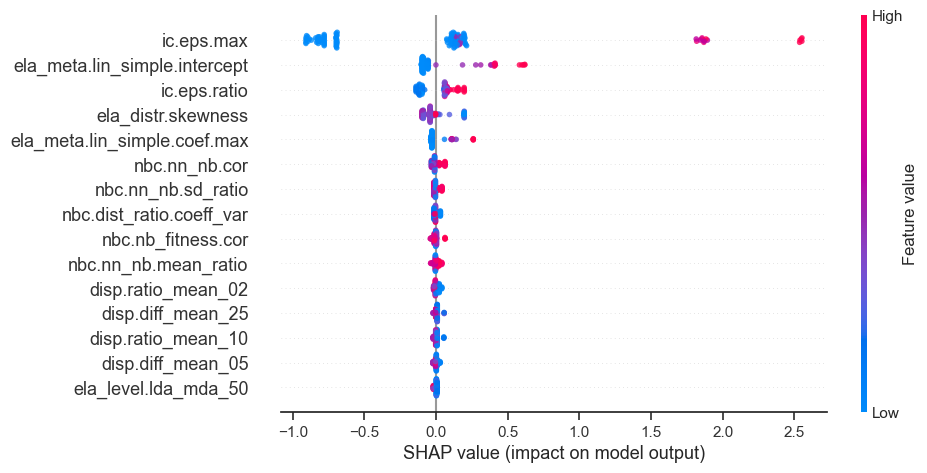

preview shap feature importance: 
                     feature_name  feature_importance  rank
46                     ic.eps.max            0.672604     1
41  ela_meta.lin_simple.intercept            0.130923     2
47                   ic.eps.ratio            0.099140     3
18             ela_distr.skewness            0.072645     4
38   ela_meta.lin_simple.coef.max            0.048591     5
(61, 3)
fold_number: 21
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.346117          -1.394013          -1.413053   
     2             -0.967025          -0.942128          -0.869487   
     3             -0.992340          -0.932643          -0.907763   
     4             -1.140337          -1.117756          -1.064403   
     5             -1.203400          -1.180215          -1.123982   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_ini

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


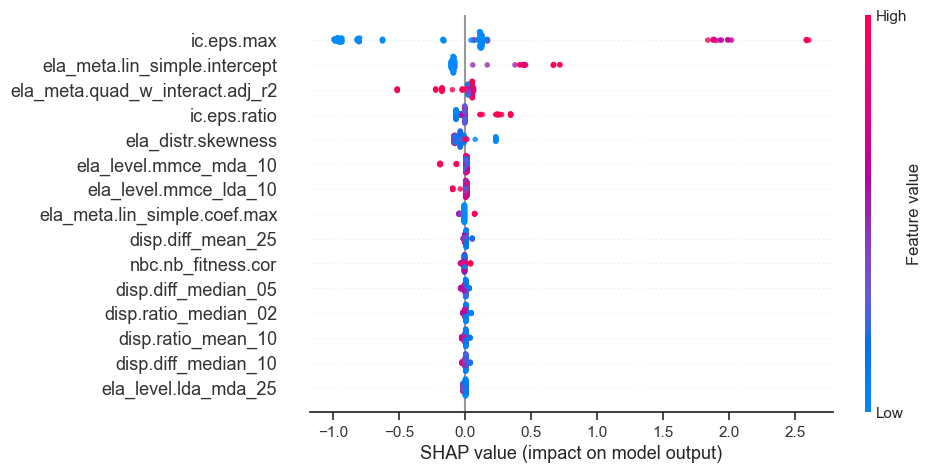

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.679837     1
41    ela_meta.lin_simple.intercept            0.148459     2
45  ela_meta.quad_w_interact.adj_r2            0.080037     3
47                     ic.eps.ratio            0.062699     4
18               ela_distr.skewness            0.062110     5
(61, 3)
fold_number: 22
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.341410          -1.391181          -1.412366   
     2             -0.967111          -0.943838          -0.872651   
     3             -0.992106          -0.934449          -0.910657   
     4             -1.138231          -1.117701          -1.066186   
     5             -1.200498          -1.179533          -1.125344   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


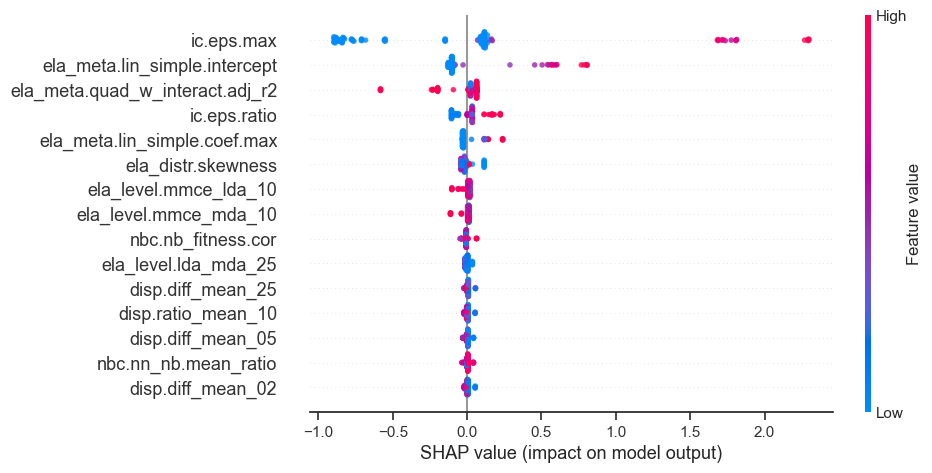

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.614376     1
41    ela_meta.lin_simple.intercept            0.176712     2
45  ela_meta.quad_w_interact.adj_r2            0.088587     3
47                     ic.eps.ratio            0.075105     4
38     ela_meta.lin_simple.coef.max            0.047025     5
(61, 3)
fold_number: 23
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.412120          -1.472464          -1.501616   
     2             -1.001511          -0.977685          -0.899495   
     3             -1.028931          -0.967300          -0.941895   
     4             -1.189232          -1.169983          -1.115408   
     5             -1.257538          -1.238372          -1.181406   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


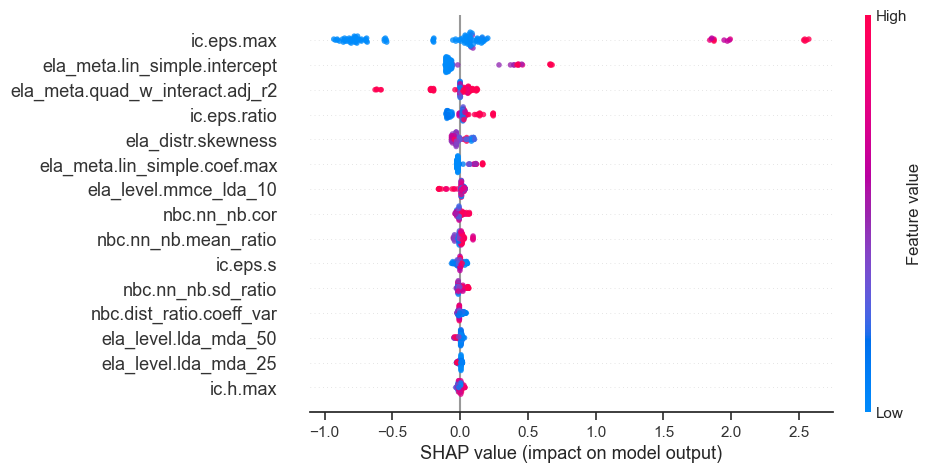

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.617992     1
41    ela_meta.lin_simple.intercept            0.142006     2
45  ela_meta.quad_w_interact.adj_r2            0.086931     3
47                     ic.eps.ratio            0.066650     4
18               ela_distr.skewness            0.044674     5
(61, 3)
fold_number: 24
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.397606          -1.461182          -1.495641   
     2             -1.026645          -1.013863          -0.951077   
     3             -1.051417          -1.004474          -0.989424   
     4             -1.196240          -1.187716          -1.146351   
     5             -1.257950          -1.249545          -1.206040   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


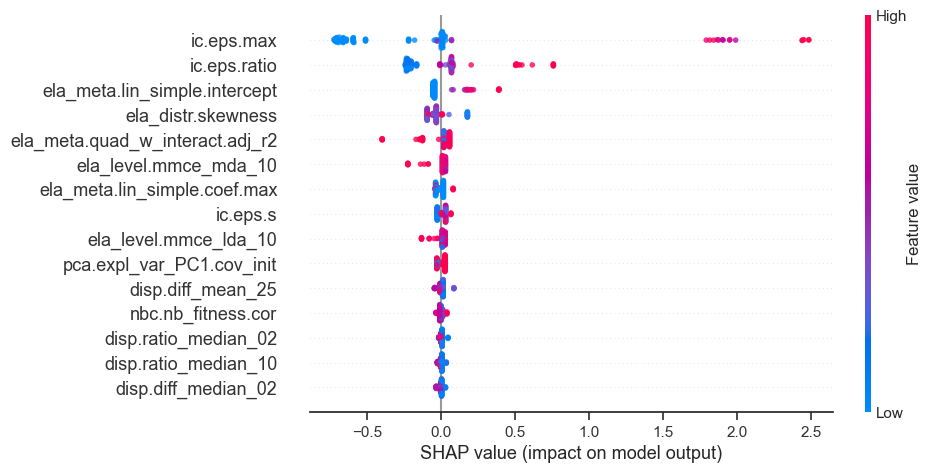

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.568840     1
47                     ic.eps.ratio            0.196476     2
41    ela_meta.lin_simple.intercept            0.077172     3
18               ela_distr.skewness            0.070636     4
45  ela_meta.quad_w_interact.adj_r2            0.063801     5
(61, 3)
dataset: test
fold_number: 1
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.448089          -1.498326          -1.516219   
     2             -1.069362          -1.044050          -0.966855   
     3             -1.094653          -1.034515          -1.005540   
     4             -1.242507          -1.220607          -1.163850   
     5             -1.305510          -1.283397          -1.224066   

           disp.diff_mean_25  disp.diff_median_02  

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


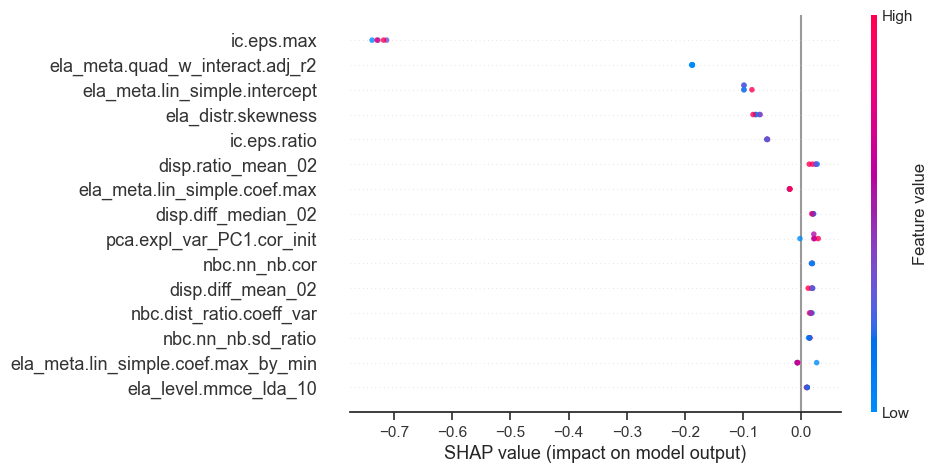

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.724944     1
45  ela_meta.quad_w_interact.adj_r2            0.187552     2
41    ela_meta.lin_simple.intercept            0.095844     3
18               ela_distr.skewness            0.076585     4
47                     ic.eps.ratio            0.058709     5
(61, 3)
fold_number: 2
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
2    1              0.595655           0.577919           0.613376   
     2              0.640978           0.577101           0.580971   
     3              0.622812           0.633054           0.679990   
     4              0.574017           0.627918           0.578773   
     5              0.626357           0.591010           0.552060   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


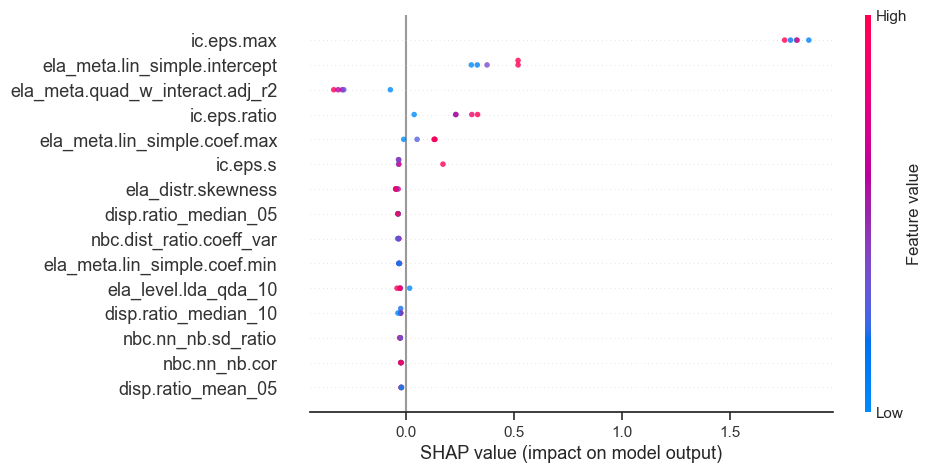

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            1.802912     1
41    ela_meta.lin_simple.intercept            0.409104     2
45  ela_meta.quad_w_interact.adj_r2            0.260524     3
47                     ic.eps.ratio            0.227056     4
38     ela_meta.lin_simple.coef.max            0.091709     5
(61, 3)
fold_number: 3
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
3    1             -0.829284          -0.826371          -0.848495   
     2             -0.766459          -0.698652          -0.631157   
     3             -0.528294          -0.451652          -0.420379   
     4             -0.743927          -0.700340          -0.682565   
     5             -0.862642          -0.896754          -0.950802   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


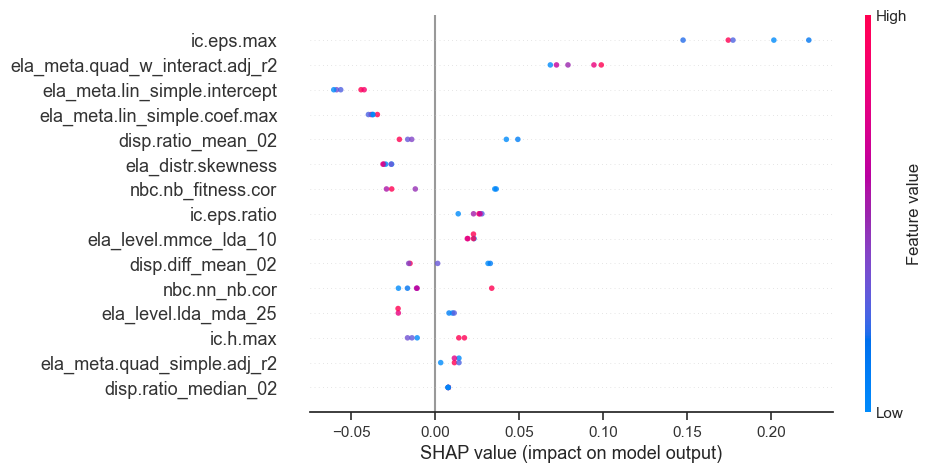

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.184621     1
45  ela_meta.quad_w_interact.adj_r2            0.082630     2
41    ela_meta.lin_simple.intercept            0.052299     3
38     ela_meta.lin_simple.coef.max            0.037253     4
8                disp.ratio_mean_02            0.028627     5
(61, 3)
fold_number: 4
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
4    1             -0.718414          -0.802582          -0.814311   
     2             -0.614235          -0.652788          -0.580699   
     3             -0.766910          -0.781489          -0.730538   
     4             -0.764491          -0.795779          -0.782917   
     5             -0.719037          -0.761675          -0.754013   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


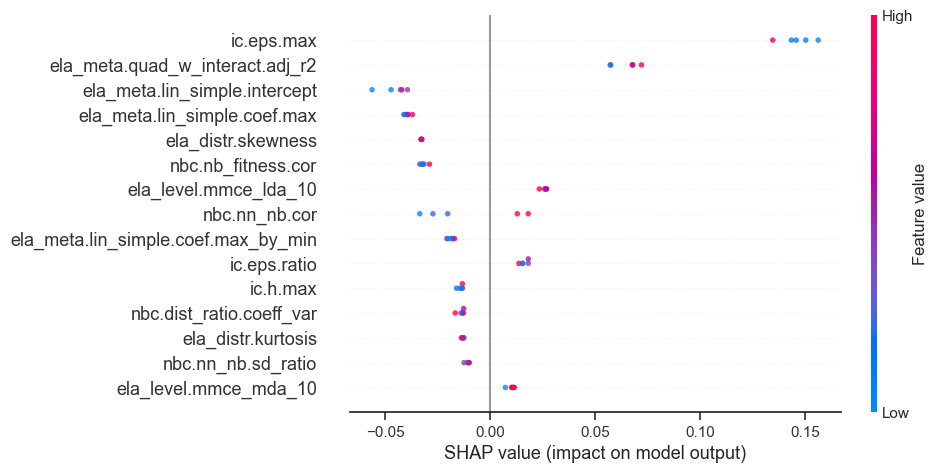

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.146015     1
45  ela_meta.quad_w_interact.adj_r2            0.064452     2
41    ela_meta.lin_simple.intercept            0.045458     3
38     ela_meta.lin_simple.coef.max            0.039335     4
18               ela_distr.skewness            0.032665     5
(61, 3)
fold_number: 5
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
5    1              0.610041           0.634696           0.704033   
     2              0.487651           0.546865           0.616124   
     3              0.546584           0.612693           0.653106   
     4              0.531404           0.617875           0.661067   
     5              0.533301           0.626922           0.726109   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


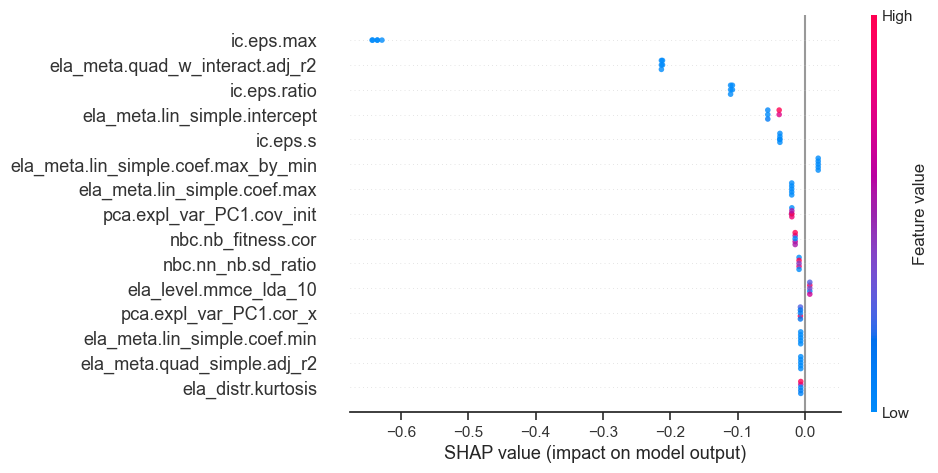

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.636653     1
45  ela_meta.quad_w_interact.adj_r2            0.212421     2
47                     ic.eps.ratio            0.109208     3
41    ela_meta.lin_simple.intercept            0.048269     4
48                         ic.eps.s            0.037098     5
(61, 3)
fold_number: 6
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
6    1             -0.195052          -0.121671          -0.096817   
     2             -0.296754          -0.302734          -0.292017   
     3             -0.424281          -0.346272          -0.269681   
     4             -0.212051          -0.189643          -0.139081   
     5              0.024660          -0.038344          -0.048562   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


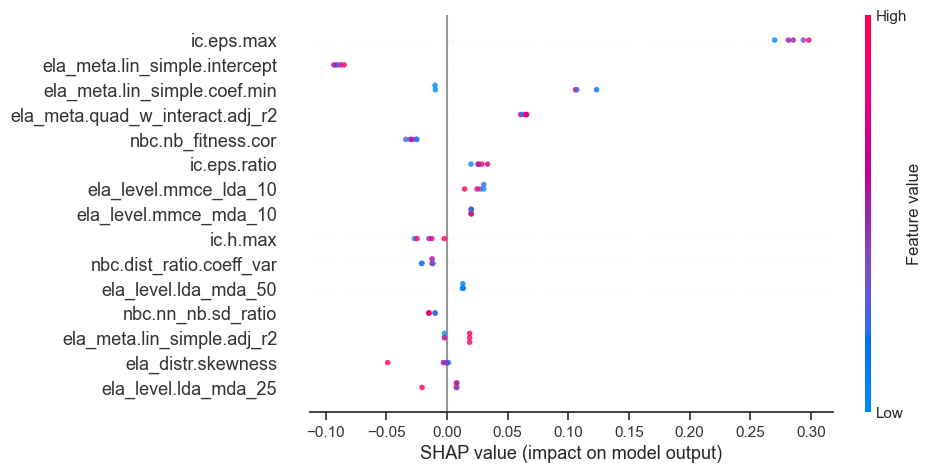

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.285857     1
41    ela_meta.lin_simple.intercept            0.089431     2
40     ela_meta.lin_simple.coef.min            0.071139     3
45  ela_meta.quad_w_interact.adj_r2            0.063869     4
52               nbc.nb_fitness.cor            0.028615     5
(61, 3)
fold_number: 7
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
7    1              0.156008           0.195944           0.193868   
     2              0.067167           0.103538           0.092347   
     3              0.103603           0.152021           0.195156   
     4             -0.282279          -0.233854          -0.198059   
     5             -0.159071          -0.129215          -0.057641   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


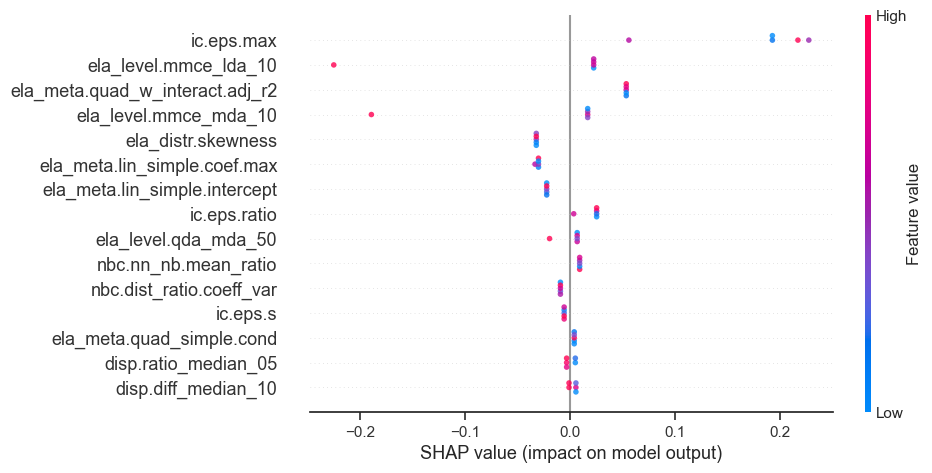

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.177585     1
25            ela_level.mmce_lda_10            0.063169     2
45  ela_meta.quad_w_interact.adj_r2            0.053680     3
28            ela_level.mmce_mda_10            0.051419     4
18               ela_distr.skewness            0.032180     5
(61, 3)
fold_number: 8
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
8    1             -1.149544          -1.148980          -1.134050   
     2             -1.042040          -1.028308          -0.987327   
     3             -1.026401          -0.996951          -0.943527   
     4             -1.113325          -1.116930          -1.084246   
     5             -1.088548          -1.061605          -1.035358   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


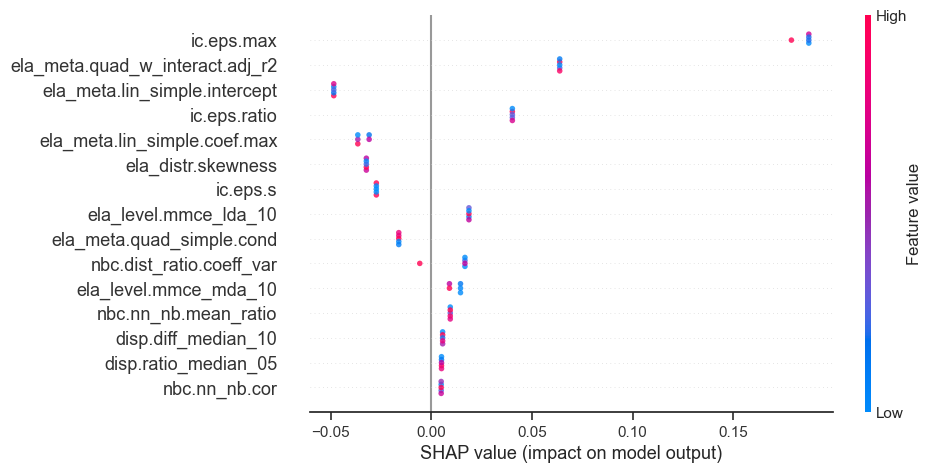

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.185735     1
45  ela_meta.quad_w_interact.adj_r2            0.063769     2
41    ela_meta.lin_simple.intercept            0.048423     3
47                     ic.eps.ratio            0.040255     4
38     ela_meta.lin_simple.coef.max            0.034235     5
(61, 3)
fold_number: 9
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
9    1             -0.793271          -0.920365          -1.057360   
     2             -0.913301          -1.043042          -1.177044   
     3             -0.812190          -0.921975          -1.068605   
     4             -0.831146          -0.929886          -1.104981   
     5             -0.884886          -1.048055          -1.179052   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


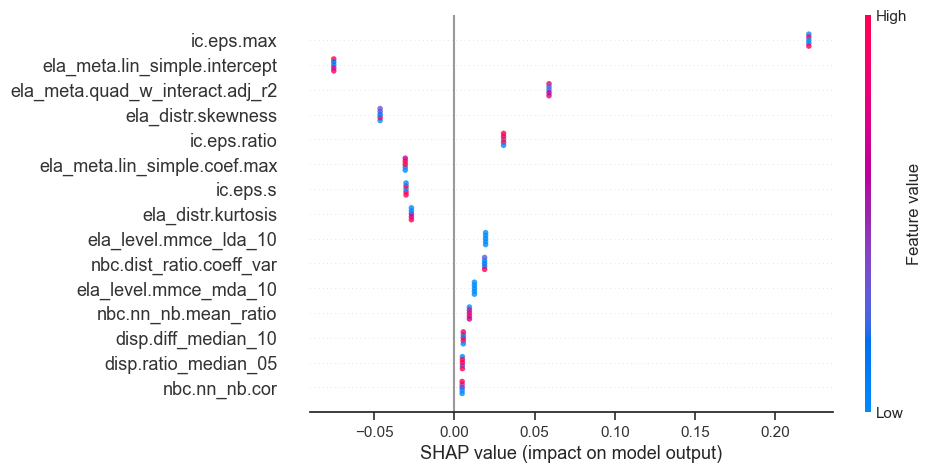

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.220817     1
41    ela_meta.lin_simple.intercept            0.075039     2
45  ela_meta.quad_w_interact.adj_r2            0.059024     3
18               ela_distr.skewness            0.046164     4
47                     ic.eps.ratio            0.030719     5
(61, 3)
fold_number: 10
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
10   1              0.671758           0.672580           0.688297   
     2              0.814386           0.801922           0.782018   
     3              0.933138           0.943057           0.978362   
     4              0.627313           0.573859           0.563109   
     5              0.838041           0.917234           0.963961   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


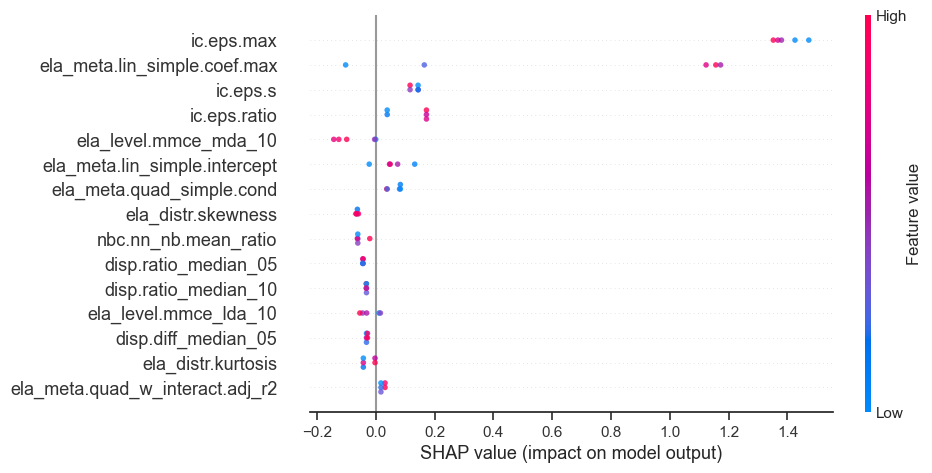

preview shap feature importance: 
                    feature_name  feature_importance  rank
46                    ic.eps.max            1.399440     1
38  ela_meta.lin_simple.coef.max            0.743879     2
48                      ic.eps.s            0.132719     3
47                  ic.eps.ratio            0.118589     4
28         ela_level.mmce_mda_10            0.074668     5
(61, 3)
fold_number: 11
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
11   1              2.089045           2.058889           2.019232   
     2              2.057637           2.022270           1.942623   
     3              1.919613           1.866701           1.785745   
     4              1.896831           1.832611           1.709556   
     5              2.093751           2.064676           2.017672   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


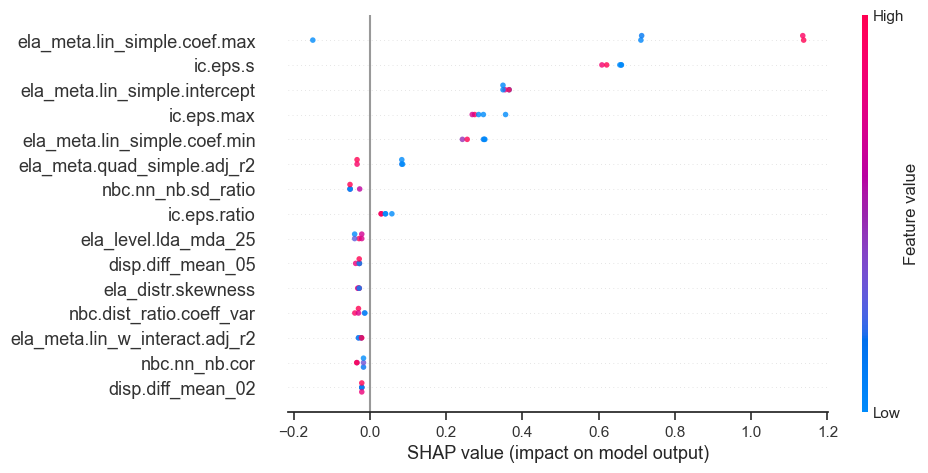

preview shap feature importance: 
                     feature_name  feature_importance  rank
38   ela_meta.lin_simple.coef.max            0.769225     1
48                       ic.eps.s            0.640744     2
41  ela_meta.lin_simple.intercept            0.356602     3
46                     ic.eps.max            0.296384     4
40   ela_meta.lin_simple.coef.min            0.279476     5
(61, 3)
fold_number: 12
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
12   1             -1.004537          -0.958086          -0.894406   
     2             -0.920556          -0.779378          -0.621318   
     3             -0.701182          -0.575075          -0.439806   
     4             -0.931474          -0.806938          -0.658355   
     5             -0.936969          -0.810184          -0.661290   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_ini

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


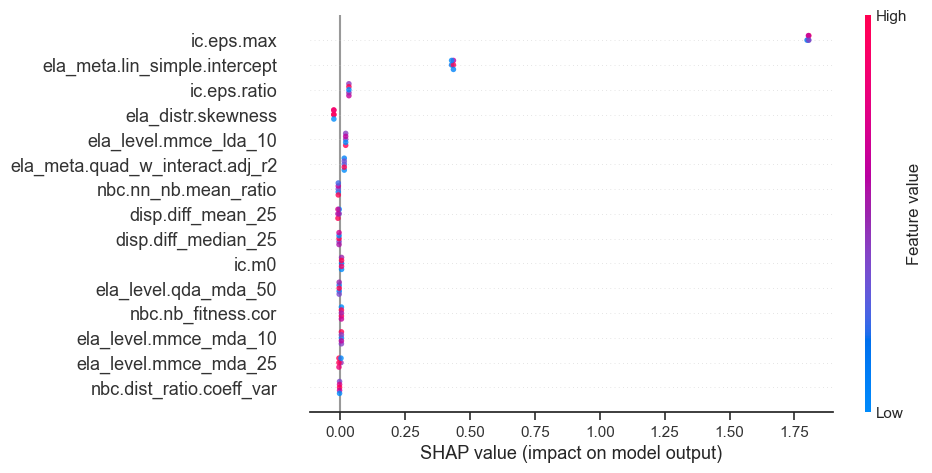

preview shap feature importance: 
                     feature_name  feature_importance  rank
46                     ic.eps.max            1.803615     1
41  ela_meta.lin_simple.intercept            0.433132     2
47                   ic.eps.ratio            0.033105     3
18             ela_distr.skewness            0.025018     4
25          ela_level.mmce_lda_10            0.020708     5
(61, 3)
fold_number: 13
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
13   1             -0.830468          -0.755455          -0.656341   
     2             -0.679676          -0.556361          -0.494882   
     3             -0.792348          -0.754178          -0.707919   
     4             -0.781624          -0.724211          -0.704586   
     5             -0.804907          -0.828251          -0.855932   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_ini

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


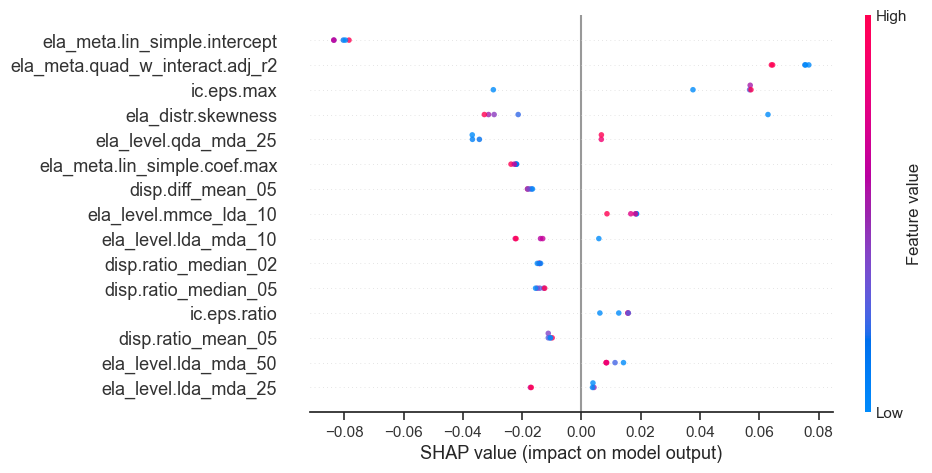

preview shap feature importance: 
                       feature_name  feature_importance  rank
41    ela_meta.lin_simple.intercept            0.081058     1
45  ela_meta.quad_w_interact.adj_r2            0.071268     2
46                       ic.eps.max            0.047644     3
18               ela_distr.skewness            0.035550     4
35             ela_level.qda_mda_25            0.024289     5
(61, 3)
fold_number: 14
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
14   1             -0.385992          -0.243033          -0.115901   
     2             -0.398480          -0.211356          -0.075269   
     3             -0.532602          -0.386145          -0.259512   
     4             -0.436743          -0.306975          -0.195933   
     5             -0.366588          -0.221568          -0.101238   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


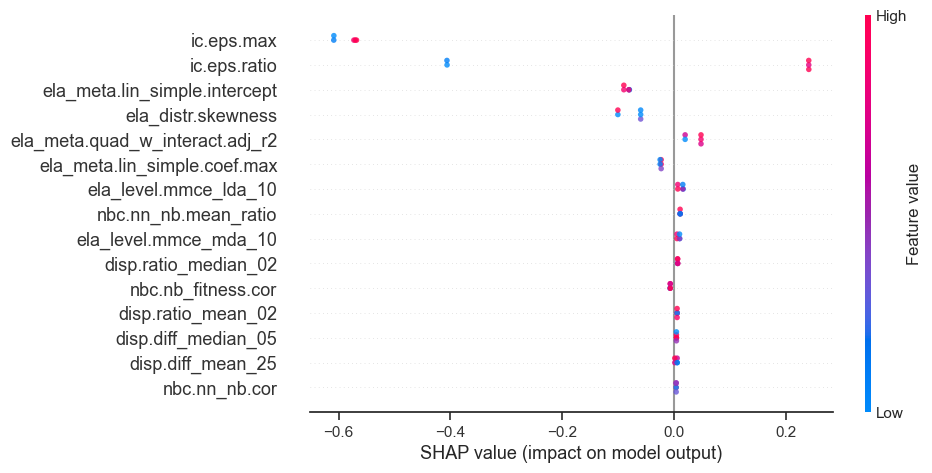

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.585680     1
47                     ic.eps.ratio            0.307368     2
41    ela_meta.lin_simple.intercept            0.083815     3
18               ela_distr.skewness            0.075665     4
45  ela_meta.quad_w_interact.adj_r2            0.037293     5
(61, 3)
fold_number: 15
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
15   1             -0.916508          -0.855513          -0.835567   
     2             -0.717580          -0.687163          -0.616202   
     3             -0.759013          -0.604266          -0.504597   
     4             -0.782836          -0.732674          -0.681333   
     5             -0.868973          -0.865921          -0.893349   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


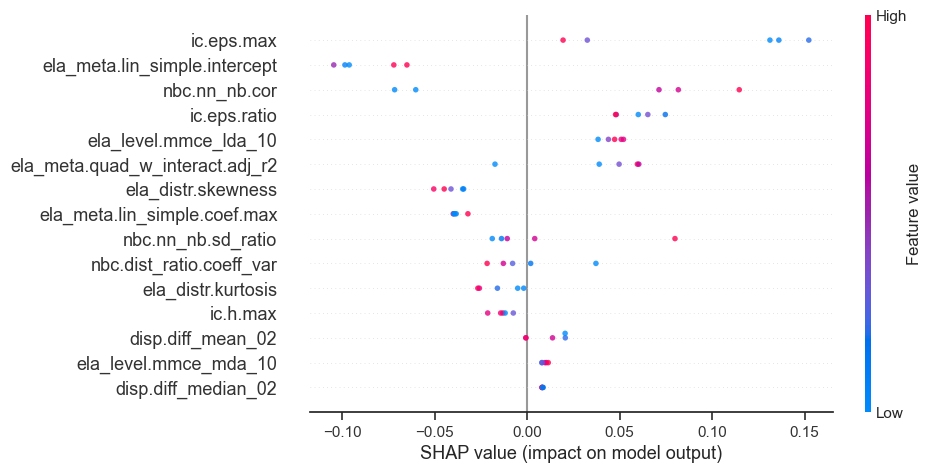

preview shap feature importance: 
                     feature_name  feature_importance  rank
46                     ic.eps.max            0.094313     1
41  ela_meta.lin_simple.intercept            0.087375     2
53                  nbc.nn_nb.cor            0.079949     3
47                   ic.eps.ratio            0.059183     4
25          ela_level.mmce_lda_10            0.046476     5
(61, 3)
fold_number: 16
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
16   1              2.434765           2.494474           2.550378   
     2              2.421768           2.507384           2.552332   
     3              2.424278           2.459489           2.524397   
     4              2.443430           2.503486           2.570305   
     5              2.432822           2.512144           2.553783   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_ini

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


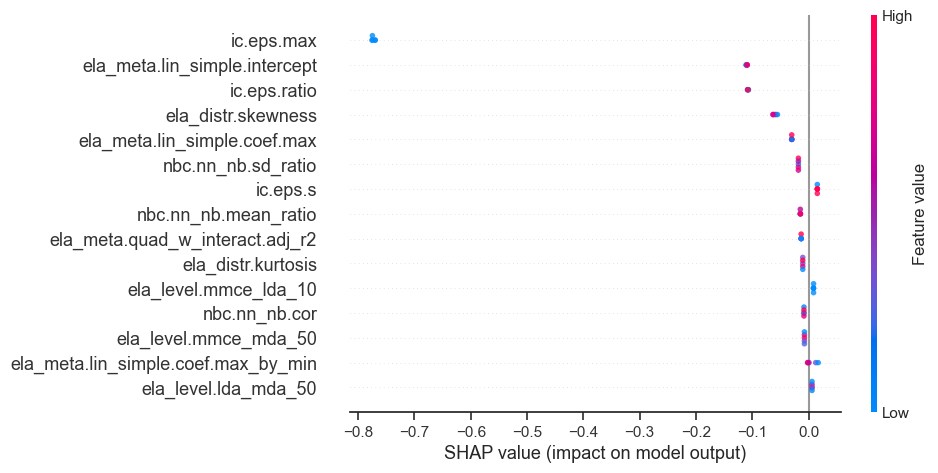

preview shap feature importance: 
                     feature_name  feature_importance  rank
46                     ic.eps.max            0.772756     1
41  ela_meta.lin_simple.intercept            0.109845     2
47                   ic.eps.ratio            0.107754     3
18             ela_distr.skewness            0.059964     4
38   ela_meta.lin_simple.coef.max            0.029934     5
(61, 3)
fold_number: 17
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
17   1             -0.451864          -0.231918          -0.073917   
     2             -0.411901          -0.384980          -0.356872   
     3             -0.279831          -0.179240          -0.088529   
     4             -0.358666          -0.250441          -0.179059   
     5             -0.210923          -0.204269          -0.213491   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_ini

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


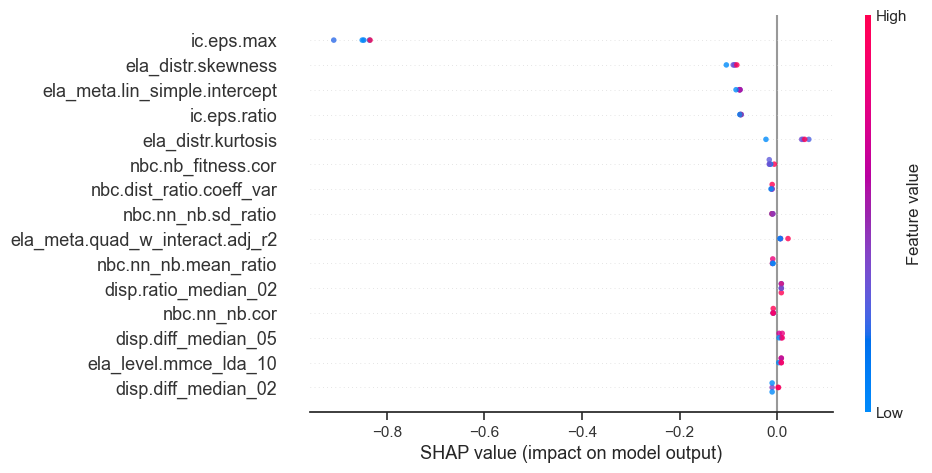

preview shap feature importance: 
                     feature_name  feature_importance  rank
46                     ic.eps.max            0.855463     1
18             ela_distr.skewness            0.090223     2
41  ela_meta.lin_simple.intercept            0.078232     3
47                   ic.eps.ratio            0.074988     4
16             ela_distr.kurtosis            0.049543     5
(61, 3)
fold_number: 18
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
18   1             -0.317335          -0.144194           0.048400   
     2             -0.115876          -0.150873          -0.160508   
     3             -0.090471           0.017673           0.114753   
     4             -0.171004          -0.132100          -0.099301   
     5              0.067800           0.037800           0.006943   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_ini

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


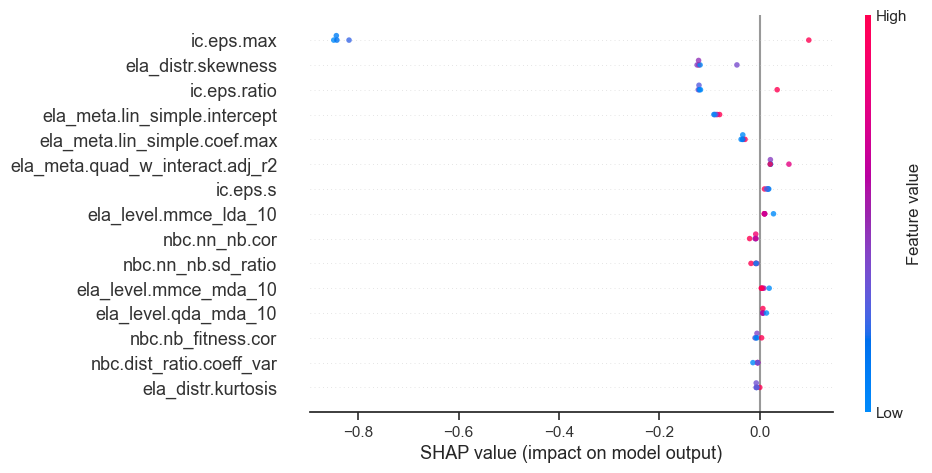

preview shap feature importance: 
                     feature_name  feature_importance  rank
46                     ic.eps.max            0.690303     1
18             ela_distr.skewness            0.106633     2
47                   ic.eps.ratio            0.103410     3
41  ela_meta.lin_simple.intercept            0.086844     4
38   ela_meta.lin_simple.coef.max            0.033649     5
(61, 3)
fold_number: 19
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
19   1             -0.704932          -0.856182          -1.044341   
     2             -0.824420          -1.002919          -1.166635   
     3             -0.700971          -0.868938          -1.032828   
     4             -0.748429          -0.921521          -1.098013   
     5             -0.692022          -0.887383          -1.057516   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_ini

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


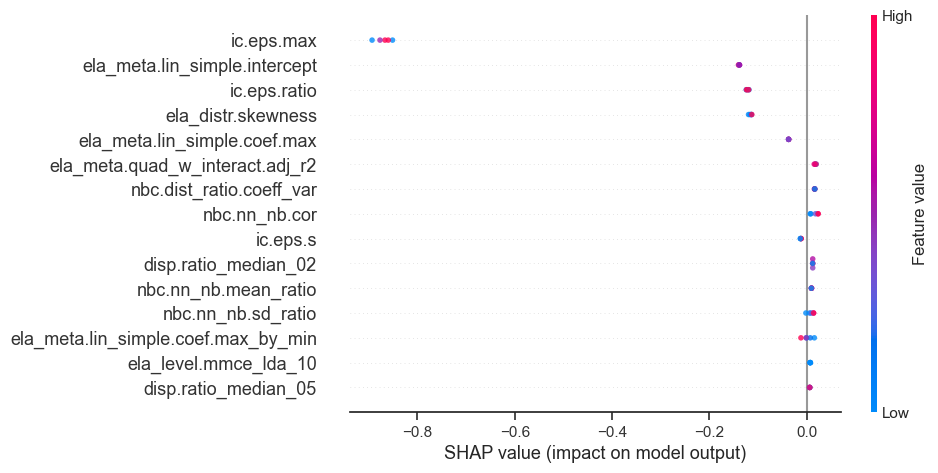

preview shap feature importance: 
                     feature_name  feature_importance  rank
46                     ic.eps.max            0.869682     1
41  ela_meta.lin_simple.intercept            0.138959     2
47                   ic.eps.ratio            0.121578     3
18             ela_distr.skewness            0.115349     4
38   ela_meta.lin_simple.coef.max            0.037287     5
(61, 3)
fold_number: 20
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
20   1             -0.759997          -0.804262          -0.815284   
     2             -0.710630          -0.708234          -0.720233   
     3             -0.708246          -0.765814          -0.758276   
     4             -0.759337          -0.795221          -0.798017   
     5             -0.744739          -0.753713          -0.724819   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_ini

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


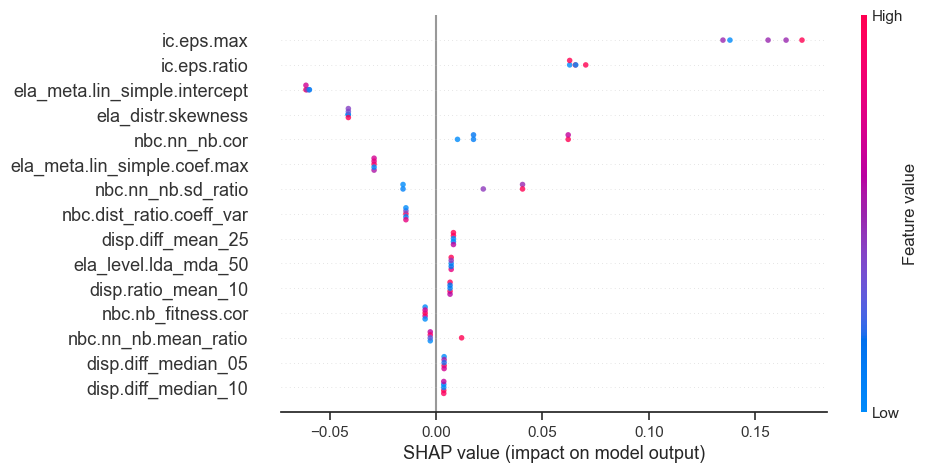

preview shap feature importance: 
                     feature_name  feature_importance  rank
46                     ic.eps.max            0.153120     1
47                   ic.eps.ratio            0.065409     2
41  ela_meta.lin_simple.intercept            0.060443     3
18             ela_distr.skewness            0.041268     4
53                  nbc.nn_nb.cor            0.033891     5
(61, 3)
fold_number: 21
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
21   1              1.414631           1.256553           1.080071   
     2              1.417963           1.278483           1.130253   
     3              0.959593           0.890307           0.726808   
     4              1.163388           1.040951           0.877409   
     5              1.282624           1.056219           0.830531   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_ini

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


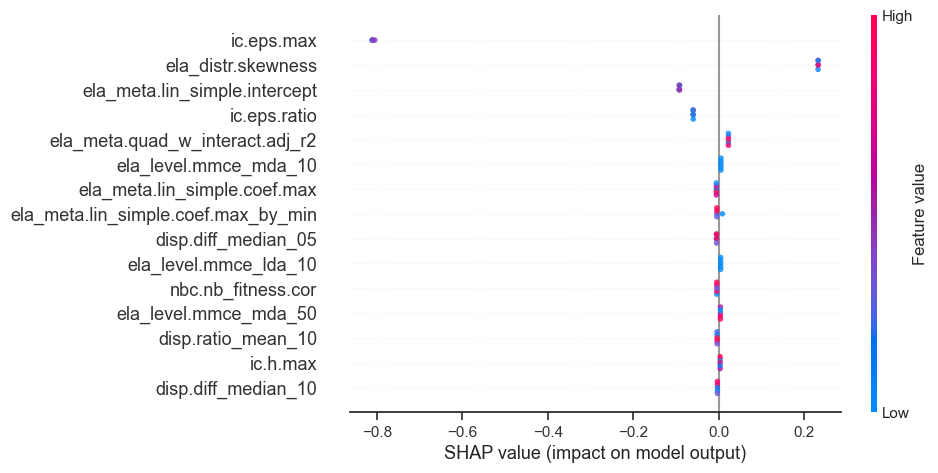

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.809538     1
18               ela_distr.skewness            0.232929     2
41    ela_meta.lin_simple.intercept            0.091980     3
47                     ic.eps.ratio            0.059714     4
45  ela_meta.quad_w_interact.adj_r2            0.022857     5
(61, 3)
fold_number: 22
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
22   1              0.669593           0.598891           0.486788   
     2              0.878391           0.744723           0.607309   
     3              1.416490           1.274325           1.110488   
     4              0.796306           0.742891           0.663525   
     5              0.921060           0.764234           0.625067   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


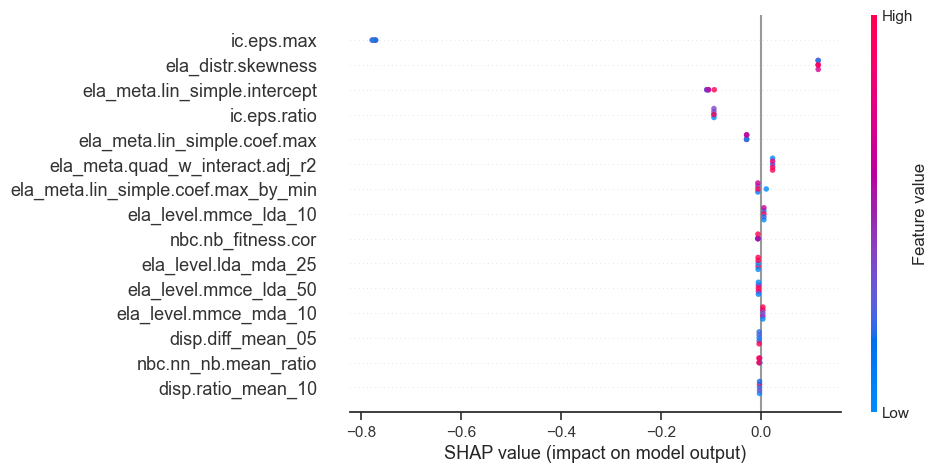

preview shap feature importance: 
                     feature_name  feature_importance  rank
46                     ic.eps.max            0.773792     1
18             ela_distr.skewness            0.114653     2
41  ela_meta.lin_simple.intercept            0.103817     3
47                   ic.eps.ratio            0.093846     4
38   ela_meta.lin_simple.coef.max            0.028488     5
(61, 3)
fold_number: 23
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
23   1              2.451738           2.512006           2.603447   
     2              2.455186           2.504204           2.548364   
     3              2.417544           2.516818           2.559721   
     4              2.447519           2.468389           2.536250   
     5              2.494247           2.509574           2.536502   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_ini

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


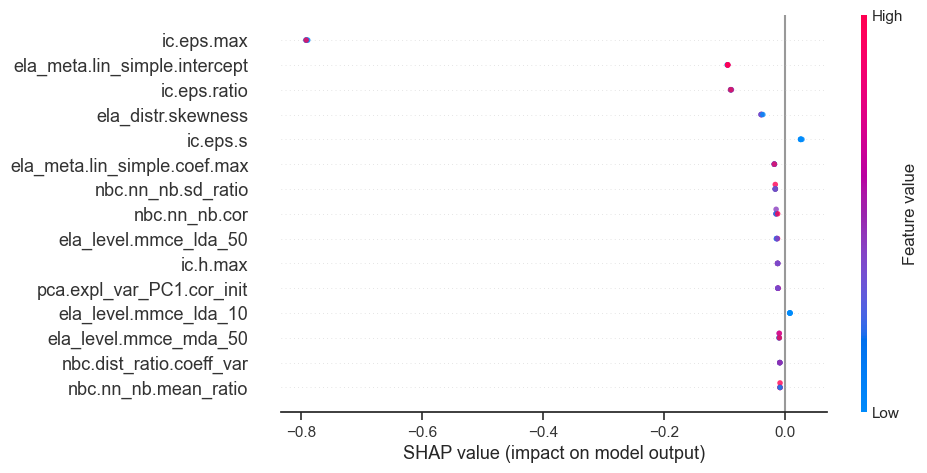

preview shap feature importance: 
                     feature_name  feature_importance  rank
46                     ic.eps.max            0.791584     1
41  ela_meta.lin_simple.intercept            0.094248     2
47                   ic.eps.ratio            0.088829     3
18             ela_distr.skewness            0.037954     4
48                       ic.eps.s            0.027204     5
(61, 3)
fold_number: 24
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
24   1             -0.675545          -0.852147          -0.986172   
     2             -0.691376          -0.833461          -0.964601   
     3             -0.700867          -0.858513          -0.984574   
     4             -0.752024          -0.870925          -1.025831   
     5             -0.719117          -0.869093          -0.984574   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_ini

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


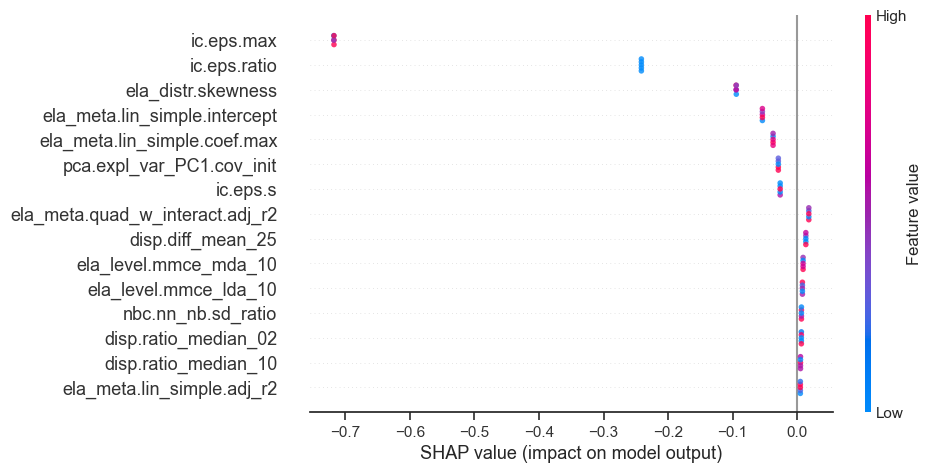

preview shap feature importance: 
                     feature_name  feature_importance  rank
46                     ic.eps.max            0.717570     1
47                   ic.eps.ratio            0.241352     2
18             ela_distr.skewness            0.094475     3
41  ela_meta.lin_simple.intercept            0.053919     4
38   ela_meta.lin_simple.coef.max            0.037385     5
(61, 3)
algorithm name: DE3
budget: 5000
dataset: train
fold_number: 1
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
2    1              0.532267           0.515056           0.552000   
     2              0.578658           0.514219           0.518899   
     3              0.560064           0.571474           0.620045   
     4              0.510119           0.566219           0.516654   
     5              0.563693           0.528451           0.489367   

           disp.diff_mean_25 

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


Preview shapley values: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
2    1             -0.020136          -0.014169          -0.016456   
     2             -0.019241          -0.014963          -0.017237   
     3             -0.020136          -0.013132          -0.020126   
     4             -0.017238          -0.015267          -0.019501   
     5             -0.017238          -0.014472          -0.020828   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                          ...                          
2    1             -0.043956            -0.016577  ...              -0.001019   
     2             -0.043707            -0.018192  ...              -0.001019   
     3             -0.052135            -0.012231  ...              -0.001019   
     4             -0.045580            -0.017733  ...               0.000476  

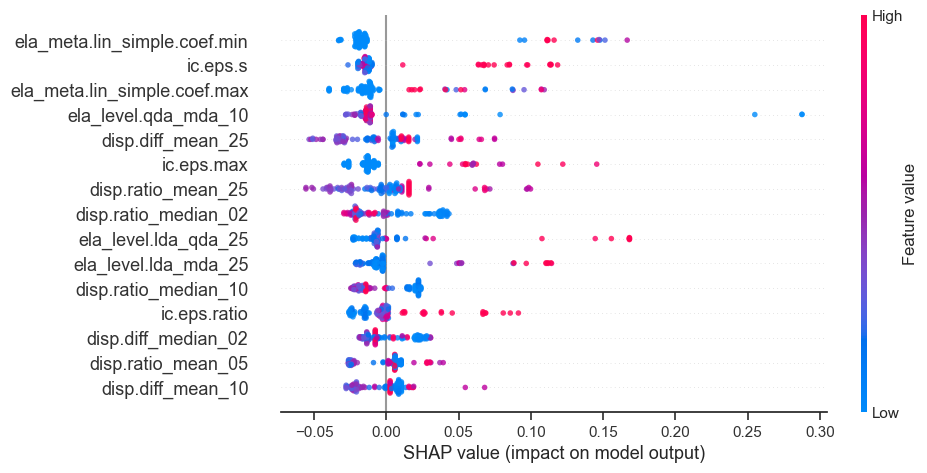

preview shap feature importance: 
                    feature_name  feature_importance  rank
40  ela_meta.lin_simple.coef.min            0.031737     1
48                      ic.eps.s            0.025710     2
38  ela_meta.lin_simple.coef.max            0.023979     3
34          ela_level.qda_mda_10            0.023337     4
3              disp.diff_mean_25            0.023096     5
(61, 3)
fold_number: 2
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.339078          -1.389661          -1.411350   
     2             -0.969076          -0.945719          -0.873538   
     3             -0.993784          -0.936401          -0.911410   
     4             -1.138232          -1.118260          -1.066391   
     5             -1.199783          -1.179622          -1.125340   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


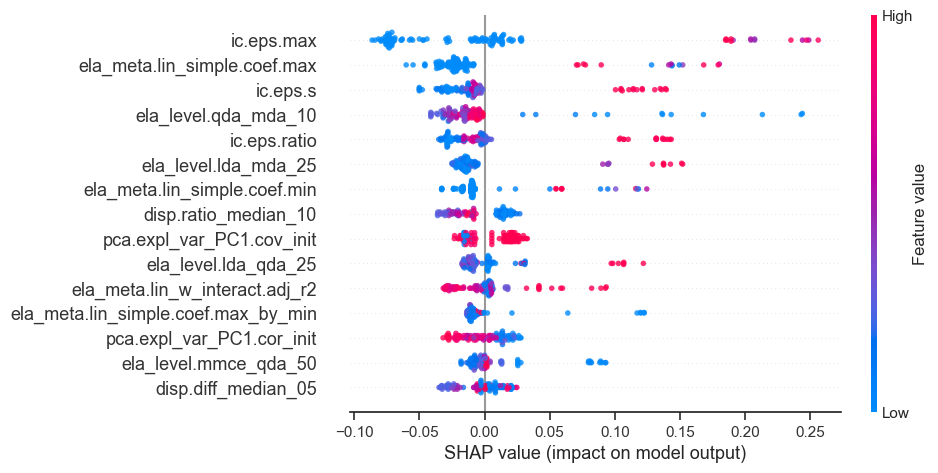

preview shap feature importance: 
                    feature_name  feature_importance  rank
46                    ic.eps.max            0.060459     1
38  ela_meta.lin_simple.coef.max            0.037663     2
48                      ic.eps.s            0.029994     3
34          ela_level.qda_mda_10            0.029815     4
47                  ic.eps.ratio            0.028912     5
(61, 3)
fold_number: 3
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.401136          -1.449504          -1.470875   
     2             -1.029651          -1.003992          -0.931178   
     3             -1.054458          -0.994642          -0.969182   
     4             -1.199485          -1.177143          -1.124707   
     5             -1.261283          -1.238722          -1.183862   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


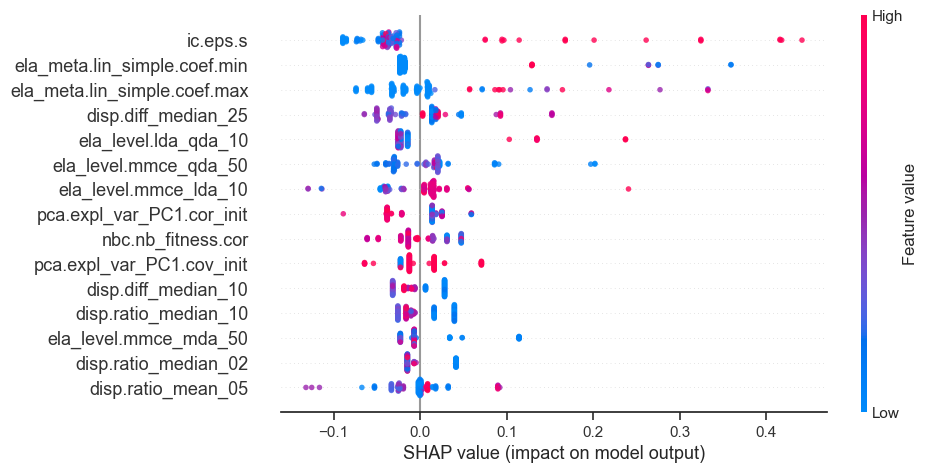

preview shap feature importance: 
                    feature_name  feature_importance  rank
48                      ic.eps.s            0.074930     1
40  ela_meta.lin_simple.coef.min            0.045358     2
38  ela_meta.lin_simple.coef.max            0.045336     3
7            disp.diff_median_25            0.035901     4
22          ela_level.lda_qda_10            0.033407     5
(61, 3)
fold_number: 4
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.398394          -1.452617          -1.472214   
     2             -1.027319          -1.006705          -0.932417   
     3             -1.052099          -0.997346          -0.970429   
     4             -1.196966          -1.180011          -1.125982   
     5             -1.258696          -1.241645          -1.185148   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


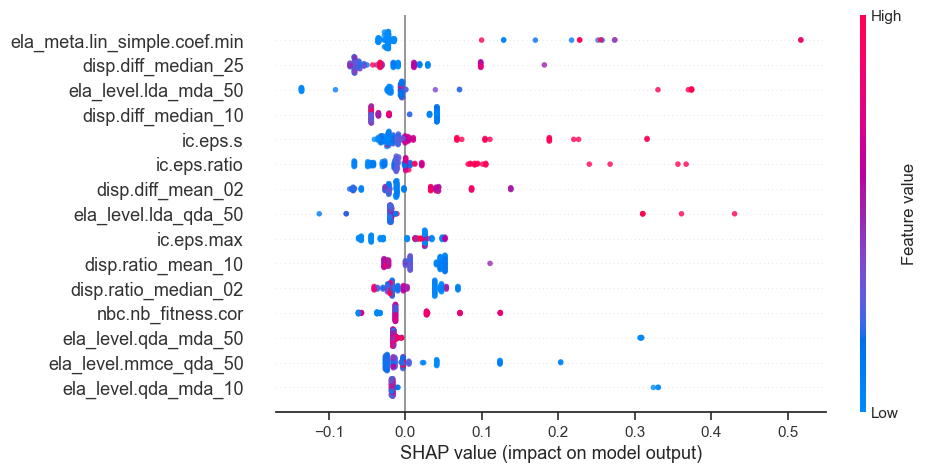

preview shap feature importance: 
                    feature_name  feature_importance  rank
40  ela_meta.lin_simple.coef.min            0.051831     1
7            disp.diff_median_25            0.049056     2
21          ela_level.lda_mda_50            0.040783     3
6            disp.diff_median_10            0.039524     4
48                      ic.eps.s            0.039128     5
(61, 3)
fold_number: 5
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.339762          -1.389631          -1.411040   
     2             -0.970368          -0.945615          -0.872236   
     3             -0.995035          -0.936295          -0.910178   
     4             -1.139246          -1.118184          -1.065445   
     5             -1.200697          -1.179556          -1.124502   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


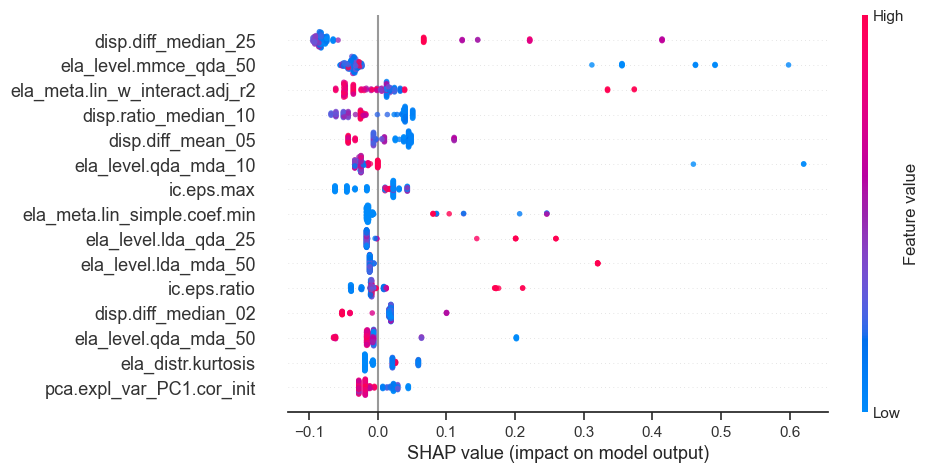

preview shap feature importance: 
                      feature_name  feature_importance  rank
7              disp.diff_median_25            0.100910     1
33           ela_level.mmce_qda_50            0.082877     2
42  ela_meta.lin_w_interact.adj_r2            0.040873     3
14            disp.ratio_median_10            0.040536     4
1                disp.diff_mean_05            0.034683     5
(61, 3)
fold_number: 6
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.365241          -1.414042          -1.433830   
     2             -0.997552          -0.972924          -0.899618   
     3             -1.022106          -0.963665          -0.937236   
     4             -1.165651          -1.144367          -1.091180   
     5             -1.226818          -1.205338          -1.149734   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.co

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


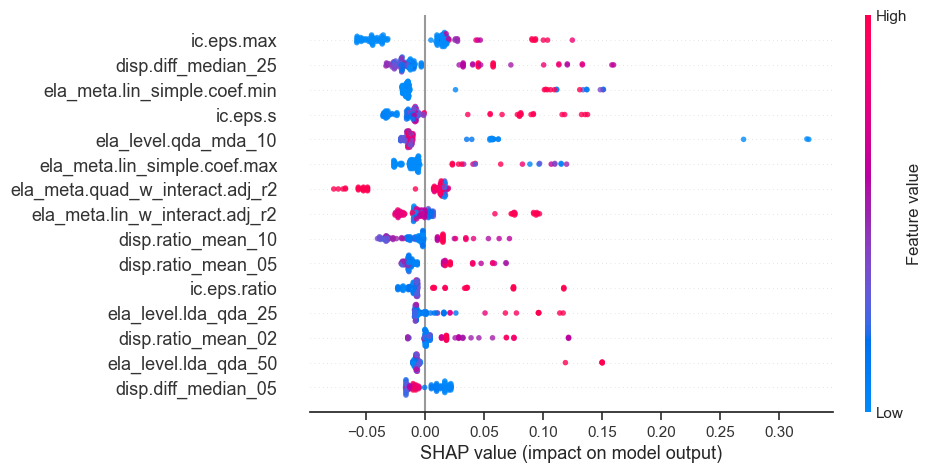

preview shap feature importance: 
                    feature_name  feature_importance  rank
46                    ic.eps.max            0.034839     1
7            disp.diff_median_25            0.031619     2
40  ela_meta.lin_simple.coef.min            0.029128     3
48                      ic.eps.s            0.028241     4
34          ela_level.qda_mda_10            0.025933     5
(61, 3)
fold_number: 7
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.355841          -1.404300          -1.424546   
     2             -0.988467          -0.963396          -0.890466   
     3             -1.013000          -0.954142          -0.928075   
     4             -1.156422          -1.134756          -1.081981   
     5             -1.217536          -1.195698          -1.140521   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


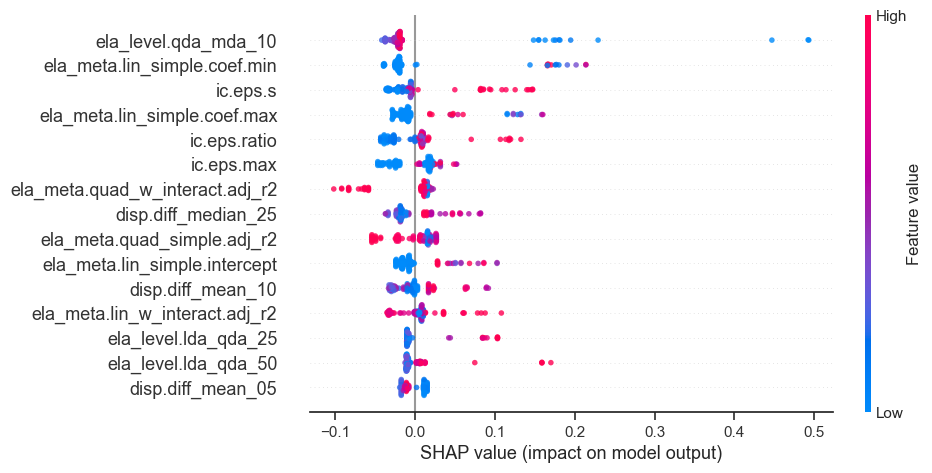

preview shap feature importance: 
                    feature_name  feature_importance  rank
34          ela_level.qda_mda_10            0.048426     1
40  ela_meta.lin_simple.coef.min            0.040628     2
48                      ic.eps.s            0.028741     3
38  ela_meta.lin_simple.coef.max            0.026947     4
47                  ic.eps.ratio            0.025603     5
(61, 3)
fold_number: 8
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.432010          -1.481996          -1.500571   
     2             -1.055970          -1.030940          -0.954906   
     3             -1.081082          -1.021473          -0.993331   
     4             -1.227887          -1.206246          -1.150575   
     5             -1.290443          -1.268591          -1.210384   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


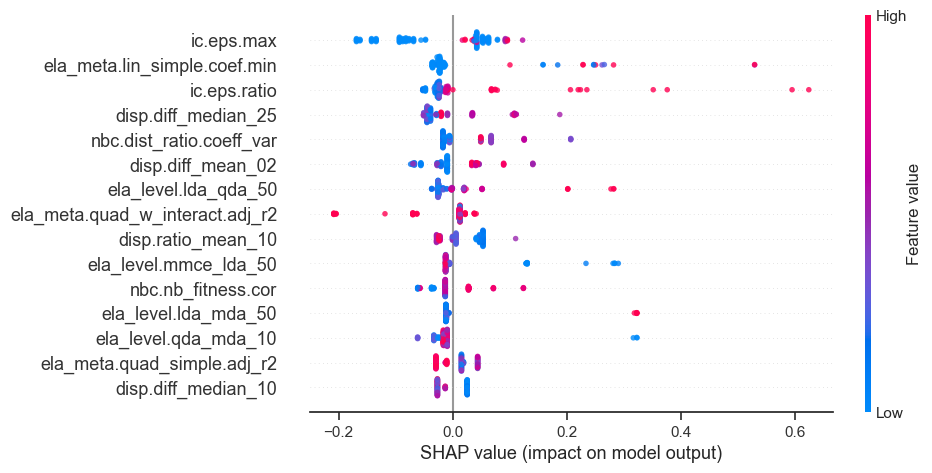

preview shap feature importance: 
                    feature_name  feature_importance  rank
46                    ic.eps.max            0.076546     1
40  ela_meta.lin_simple.coef.min            0.052694     2
47                  ic.eps.ratio            0.051610     3
7            disp.diff_median_25            0.044896     4
51      nbc.dist_ratio.coeff_var            0.037737     5
(61, 3)
fold_number: 9
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.409472          -1.472203          -1.508899   
     2             -1.036865          -1.022941          -0.961372   
     3             -1.061748          -1.013511          -0.999928   
     4             -1.207212          -1.197549          -1.157708   
     5             -1.269197          -1.259646          -1.217722   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


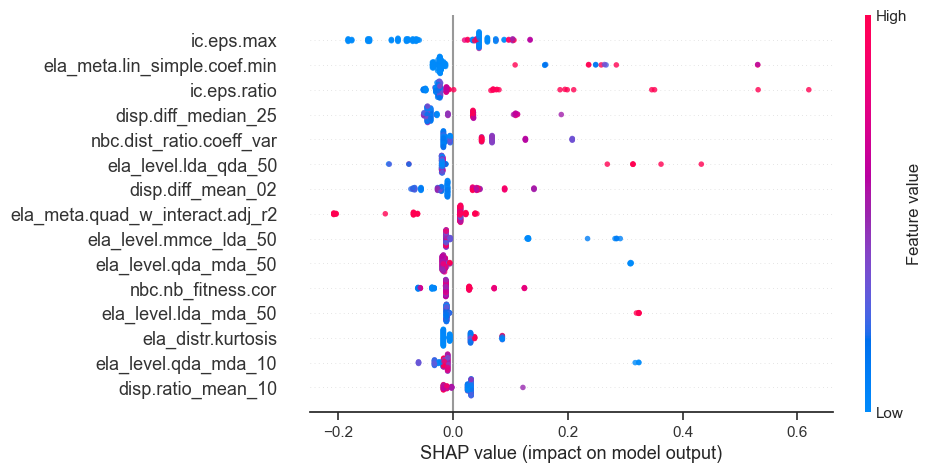

preview shap feature importance: 
                    feature_name  feature_importance  rank
46                    ic.eps.max            0.079591     1
40  ela_meta.lin_simple.coef.min            0.052907     2
47                  ic.eps.ratio            0.050085     3
7            disp.diff_median_25            0.046416     4
51      nbc.dist_ratio.coeff_var            0.039526     5
(61, 3)
fold_number: 10
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.338952          -1.389955          -1.411950   
     2             -0.967121          -0.943563          -0.870885   
     3             -0.991951          -0.934194          -0.908986   
     4             -1.137113          -1.117056          -1.064904   
     5             -1.198969          -1.178757          -1.124210   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


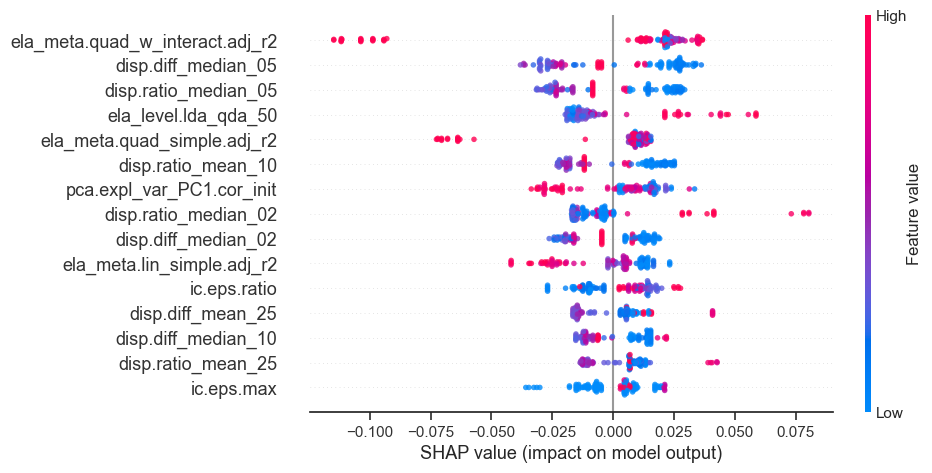

preview shap feature importance: 
                       feature_name  feature_importance  rank
45  ela_meta.quad_w_interact.adj_r2            0.036650     1
5               disp.diff_median_05            0.023189     2
13             disp.ratio_median_05            0.020562     3
24             ela_level.lda_qda_50            0.018055     4
43      ela_meta.quad_simple.adj_r2            0.017924     5
(61, 3)
fold_number: 11
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.380109          -1.431570          -1.450081   
     2             -0.983171          -0.956595          -0.877581   
     3             -1.009678          -0.946626          -0.917896   
     4             -1.164642          -1.141196          -1.082873   
     5             -1.230674          -1.206848          -1.145624   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


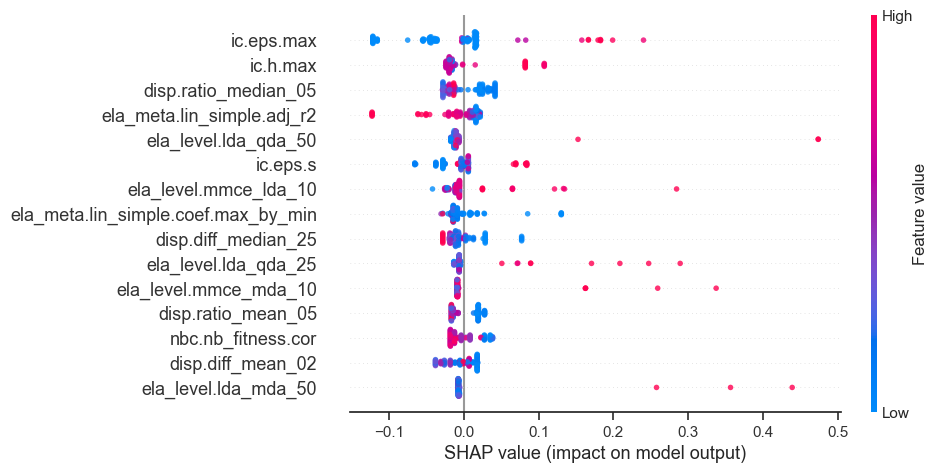

preview shap feature importance: 
                  feature_name  feature_importance  rank
46                  ic.eps.max            0.052239     1
49                    ic.h.max            0.027729     2
13        disp.ratio_median_05            0.024252     3
37  ela_meta.lin_simple.adj_r2            0.022272     4
24        ela_level.lda_qda_50            0.020544     5
(61, 3)
fold_number: 12
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.414407          -1.455316          -1.466269   
     2             -1.041050          -1.008911          -0.927490   
     3             -1.065982          -0.999541          -0.965430   
     4             -1.211740          -1.182409          -1.120689   
     5             -1.273850          -1.244111          -1.179744   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id    

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


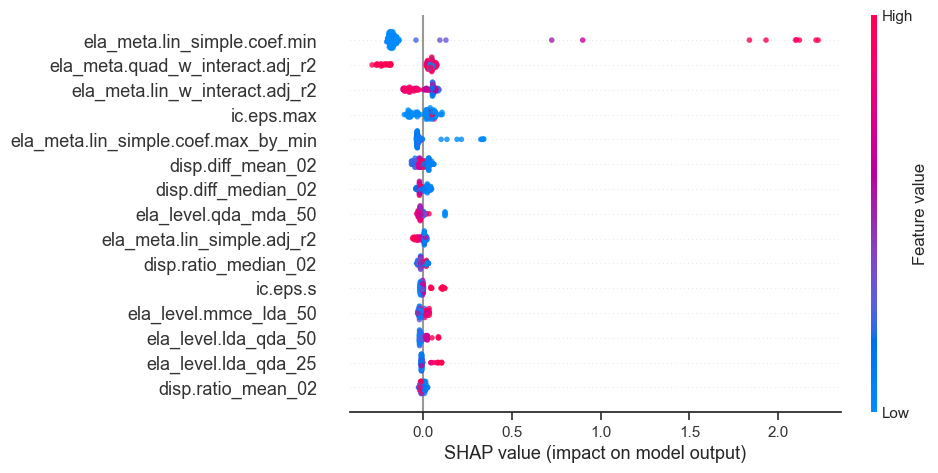

preview shap feature importance: 
                           feature_name  feature_importance  rank
40         ela_meta.lin_simple.coef.min            0.296241     1
45      ela_meta.quad_w_interact.adj_r2            0.076823     2
42       ela_meta.lin_w_interact.adj_r2            0.064367     3
46                           ic.eps.max            0.051766     4
39  ela_meta.lin_simple.coef.max_by_min            0.044327     5
(61, 3)
fold_number: 13
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.403482          -1.449799          -1.468379   
     2             -1.031719          -1.004312          -0.929261   
     3             -1.056545          -0.994961          -0.967225   
     4             -1.201680          -1.177453          -1.122582   
     5             -1.263524          -1.239029          -1.181674   

           disp.diff_mean_25  disp.diff_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


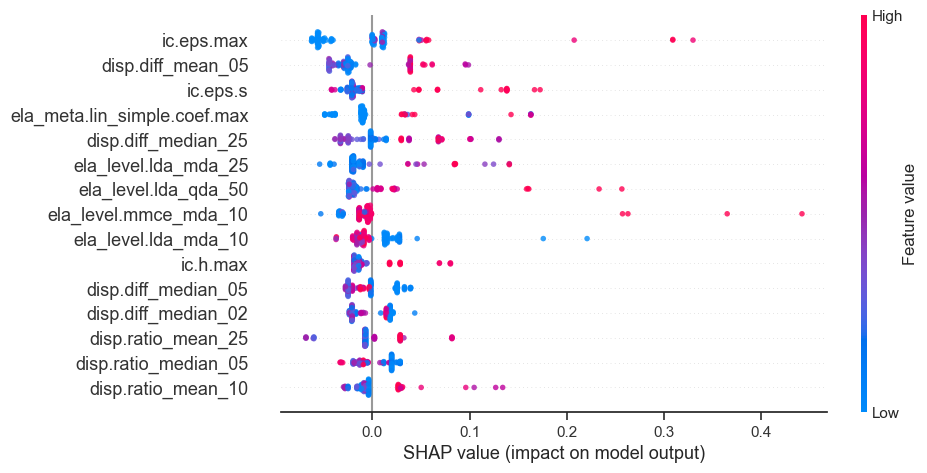

preview shap feature importance: 
                    feature_name  feature_importance  rank
46                    ic.eps.max            0.040167     1
1              disp.diff_mean_05            0.034382     2
48                      ic.eps.s            0.033874     3
38  ela_meta.lin_simple.coef.max            0.028656     4
7            disp.diff_median_25            0.028586     5
(61, 3)
fold_number: 14
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.376872          -1.417891          -1.432685   
     2             -1.008327          -0.976534          -0.898595   
     3             -1.032938          -0.967270          -0.936204   
     4             -1.176817          -1.148070          -1.090113   
     5             -1.238126          -1.209075          -1.148654   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


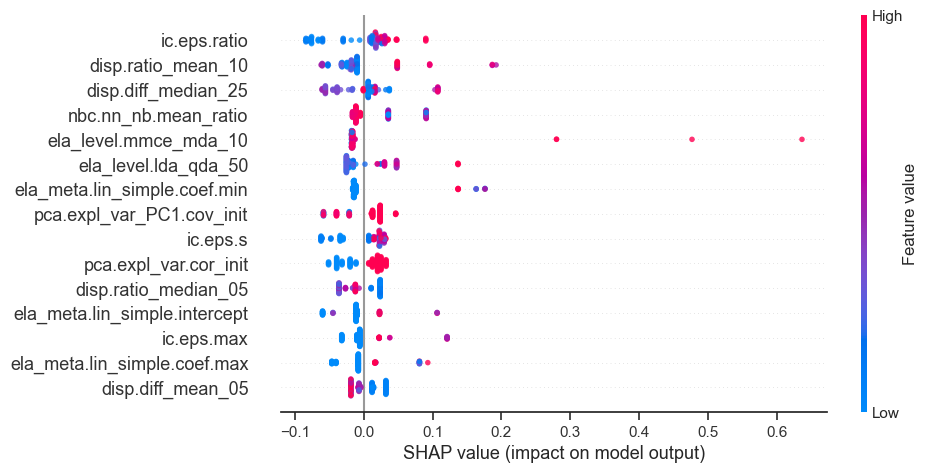

preview shap feature importance: 
             feature_name  feature_importance  rank
47           ic.eps.ratio            0.036996     1
10     disp.ratio_mean_10            0.033965     2
7     disp.diff_median_25            0.032197     3
54   nbc.nn_nb.mean_ratio            0.031489     4
28  ela_level.mmce_mda_10            0.030762     5
(61, 3)
fold_number: 15
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.406236          -1.451997          -1.470427   
     2             -1.034078          -1.006152          -0.930889   
     3             -1.058930          -0.996794          -0.968883   
     4             -1.204220          -1.179432          -1.124361   
     5             -1.266130          -1.241057          -1.183499   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                  

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


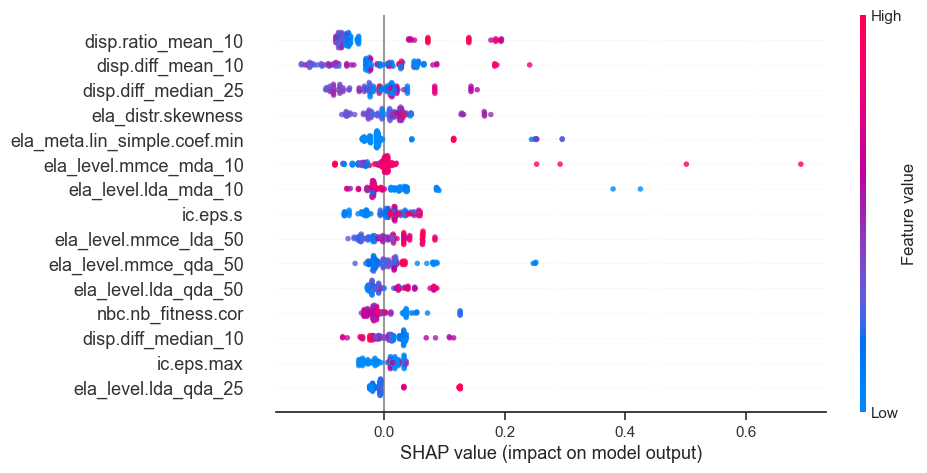

preview shap feature importance: 
                    feature_name  feature_importance  rank
10            disp.ratio_mean_10            0.075751     1
2              disp.diff_mean_10            0.060379     2
7            disp.diff_median_25            0.041805     3
18            ela_distr.skewness            0.036168     4
40  ela_meta.lin_simple.coef.min            0.035979     5
(61, 3)
fold_number: 16
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.410323          -1.471862          -1.500991   
     2             -1.000448          -0.977362          -0.899207   
     3             -1.027819          -0.966982          -0.941583   
     4             -1.187833          -1.169552          -1.114999   
     5             -1.256018          -1.237902          -1.180960   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


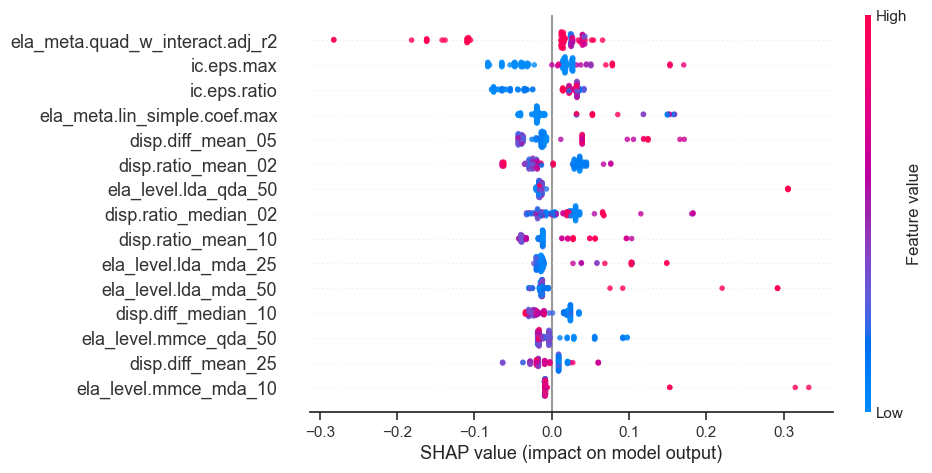

preview shap feature importance: 
                       feature_name  feature_importance  rank
45  ela_meta.quad_w_interact.adj_r2            0.047261     1
46                       ic.eps.max            0.039682     2
47                     ic.eps.ratio            0.038512     3
38     ela_meta.lin_simple.coef.max            0.034330     4
1                 disp.diff_mean_05            0.033061     5
(61, 3)
fold_number: 17
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.371845          -1.416570          -1.434553   
     2             -1.003744          -0.975319          -0.900275   
     3             -1.028325          -0.966057          -0.937898   
     4             -1.172031          -1.146814          -1.091860   
     5             -1.233266          -1.207804          -1.150422   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


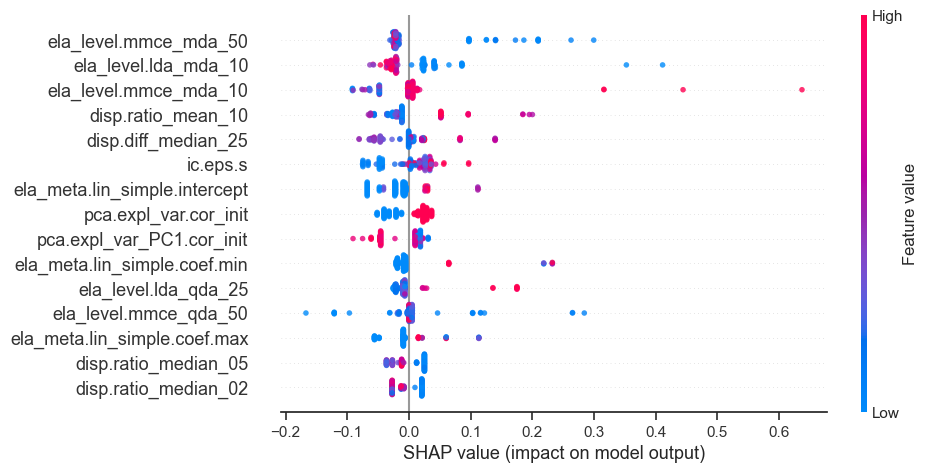

preview shap feature importance: 
             feature_name  feature_importance  rank
30  ela_level.mmce_mda_50            0.046613     1
19   ela_level.lda_mda_10            0.037988     2
28  ela_level.mmce_mda_10            0.036842     3
10     disp.ratio_mean_10            0.036024     4
7     disp.diff_median_25            0.031047     5
(61, 3)
fold_number: 18
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.360160          -1.407634          -1.426709   
     2             -0.992772          -0.966888          -0.892803   
     3             -1.017306          -0.957637          -0.930400   
     4             -1.160733          -1.138186          -1.084255   
     5             -1.221850          -1.199106          -1.142776   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                  

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


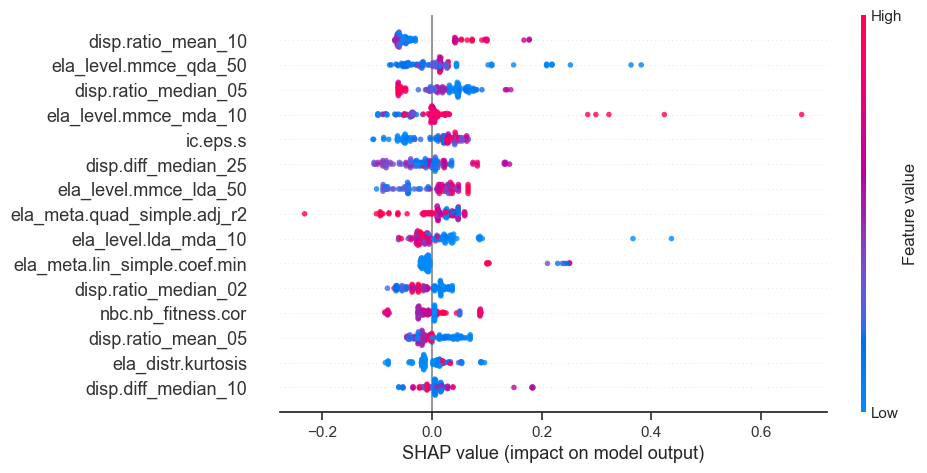

preview shap feature importance: 
             feature_name  feature_importance  rank
10     disp.ratio_mean_10            0.059415     1
33  ela_level.mmce_qda_50            0.047713     2
13   disp.ratio_median_05            0.043338     3
28  ela_level.mmce_mda_10            0.041292     4
48               ic.eps.s            0.040272     5
(61, 3)
fold_number: 19
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.399816          -1.465934          -1.504934   
     2             -1.028554          -1.017785          -0.958306   
     3             -1.053346          -1.008379          -0.996799   
     4             -1.198286          -1.191961          -1.154320   
     5             -1.260047          -1.253904          -1.214236   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                  

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


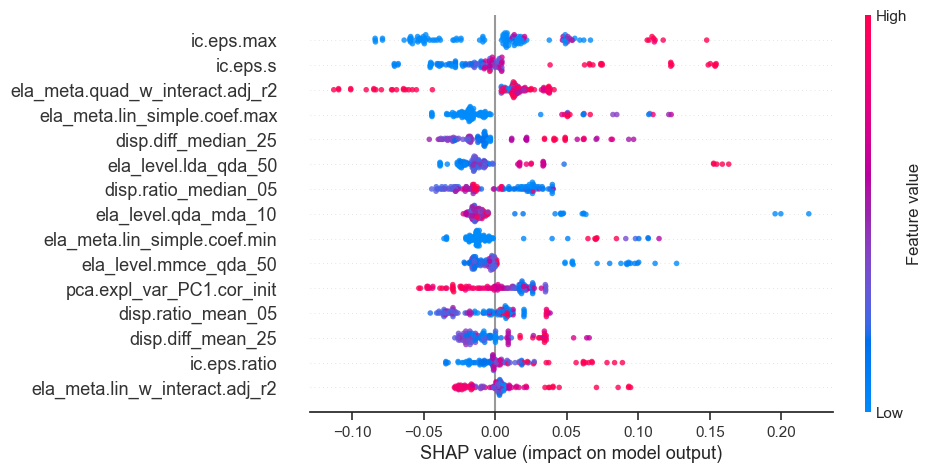

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.039208     1
48                         ic.eps.s            0.032937     2
45  ela_meta.quad_w_interact.adj_r2            0.028561     3
38     ela_meta.lin_simple.coef.max            0.028142     4
7               disp.diff_median_25            0.024345     5
(61, 3)
fold_number: 20
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.399962          -1.453126          -1.474696   
     2             -1.028688          -1.007140          -0.934451   
     3             -1.053481          -0.997780          -0.972494   
     4             -1.198426          -1.180475          -1.128176   
     5             -1.260189          -1.242120          -1.187392   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


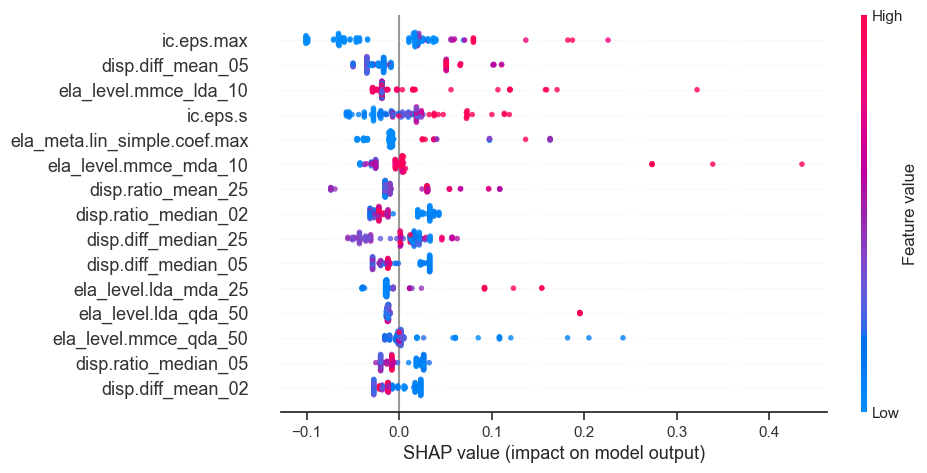

preview shap feature importance: 
                    feature_name  feature_importance  rank
46                    ic.eps.max            0.052320     1
1              disp.diff_mean_05            0.034783     2
25         ela_level.mmce_lda_10            0.029908     3
48                      ic.eps.s            0.029406     4
38  ela_meta.lin_simple.coef.max            0.026964     5
(61, 3)
fold_number: 21
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.346117          -1.394013          -1.413053   
     2             -0.967025          -0.942128          -0.869487   
     3             -0.992340          -0.932643          -0.907763   
     4             -1.140337          -1.117756          -1.064403   
     5             -1.203400          -1.180215          -1.123982   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


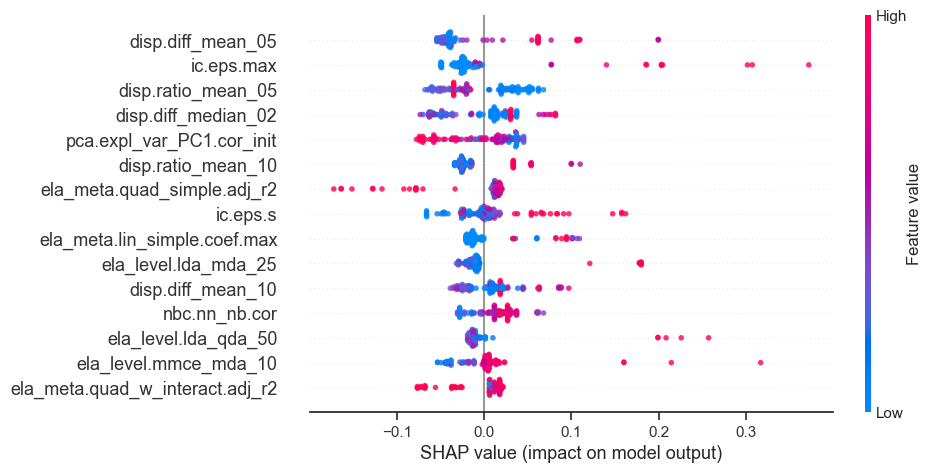

preview shap feature importance: 
                 feature_name  feature_importance  rank
1           disp.diff_mean_05            0.048988     1
46                 ic.eps.max            0.041340     2
9          disp.ratio_mean_05            0.036789     3
4         disp.diff_median_02            0.033829     4
58  pca.expl_var_PC1.cor_init            0.033786     5
(61, 3)
fold_number: 22
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.341410          -1.391181          -1.412366   
     2             -0.967111          -0.943838          -0.872651   
     3             -0.992106          -0.934449          -0.910657   
     4             -1.138231          -1.117701          -1.066186   
     5             -1.200498          -1.179533          -1.125344   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id          

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


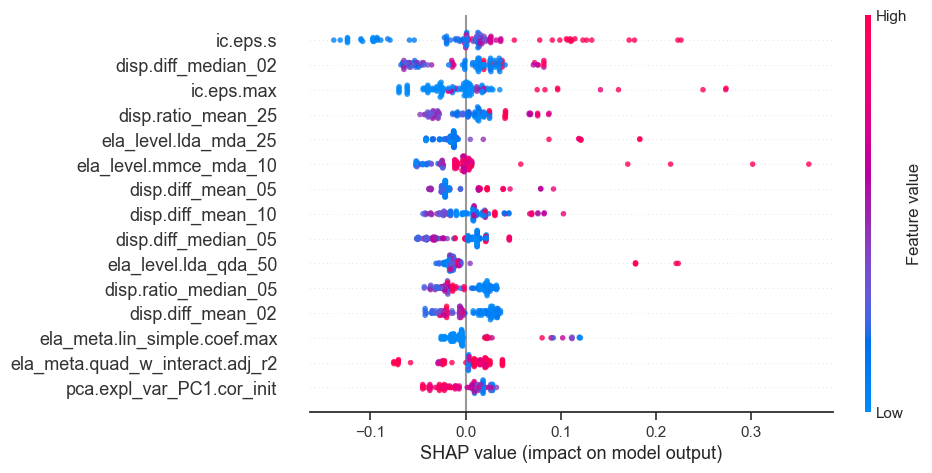

preview shap feature importance: 
            feature_name  feature_importance  rank
48              ic.eps.s            0.049582     1
4    disp.diff_median_02            0.035961     2
46            ic.eps.max            0.033471     3
11    disp.ratio_mean_25            0.026320     4
20  ela_level.lda_mda_25            0.024971     5
(61, 3)
fold_number: 23
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.412120          -1.472464          -1.501616   
     2             -1.001511          -0.977685          -0.899495   
     3             -1.028931          -0.967300          -0.941895   
     4             -1.189232          -1.169983          -1.115408   
     5             -1.257538          -1.238372          -1.181406   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                        

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


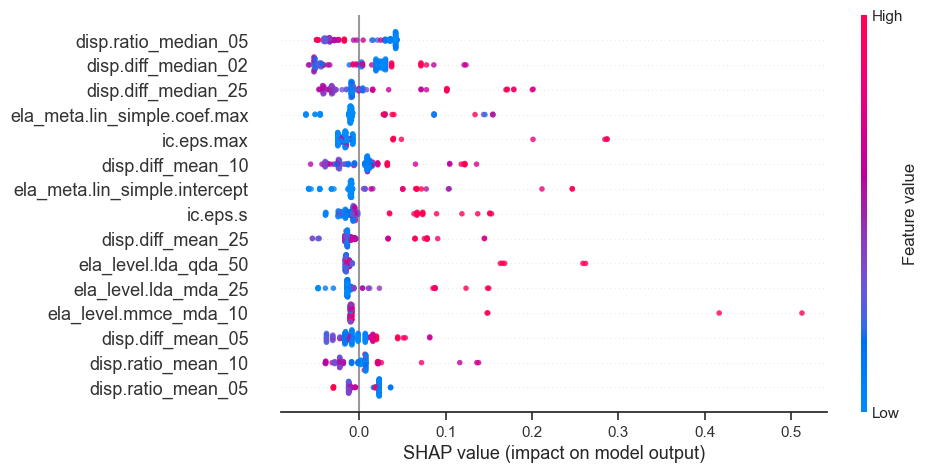

preview shap feature importance: 
                    feature_name  feature_importance  rank
13          disp.ratio_median_05            0.035500     1
4            disp.diff_median_02            0.034805     2
7            disp.diff_median_25            0.033974     3
38  ela_meta.lin_simple.coef.max            0.027045     4
46                    ic.eps.max            0.026786     5
(61, 3)
fold_number: 24
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.397606          -1.461182          -1.495641   
     2             -1.026645          -1.013863          -0.951077   
     3             -1.051417          -1.004474          -0.989424   
     4             -1.196240          -1.187716          -1.146351   
     5             -1.257950          -1.249545          -1.206040   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


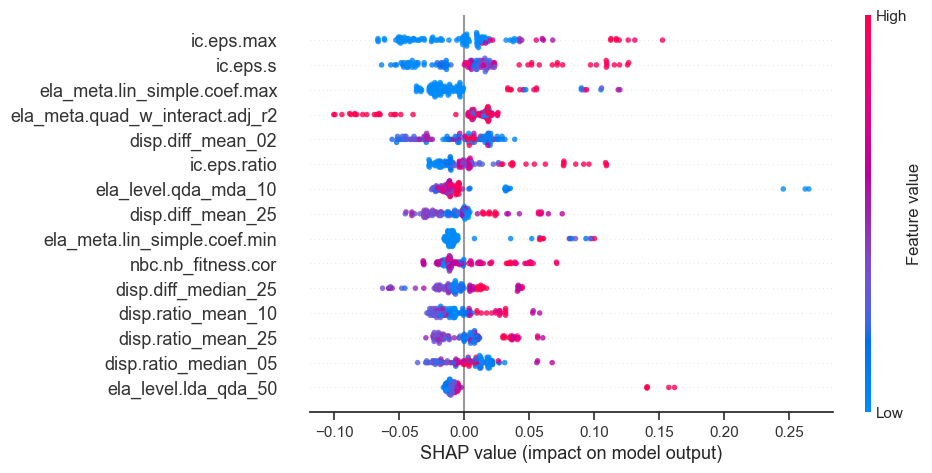

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.033152     1
48                         ic.eps.s            0.032773     2
38     ela_meta.lin_simple.coef.max            0.026200     3
45  ela_meta.quad_w_interact.adj_r2            0.023797     4
0                 disp.diff_mean_02            0.021690     5
(61, 3)
dataset: test
fold_number: 1
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
1    1             -1.448089          -1.498326          -1.516219   
     2             -1.069362          -1.044050          -0.966855   
     3             -1.094653          -1.034515          -1.005540   
     4             -1.242507          -1.220607          -1.163850   
     5             -1.305510          -1.283397          -1.224066   

           disp.diff_mean_25  disp.diff_median_02  

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


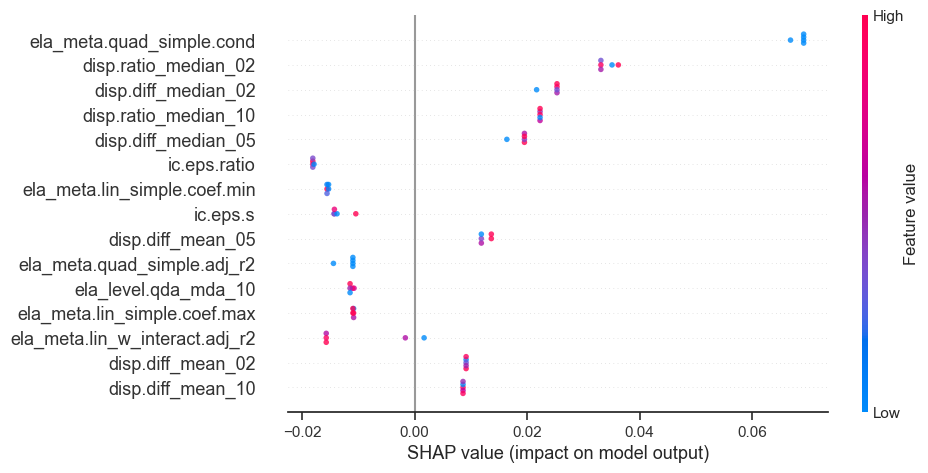

preview shap feature importance: 
                 feature_name  feature_importance  rank
44  ela_meta.quad_simple.cond            0.068685     1
12       disp.ratio_median_02            0.034129     2
4         disp.diff_median_02            0.024589     3
14       disp.ratio_median_10            0.022301     4
5         disp.diff_median_05            0.018900     5
(61, 3)
fold_number: 2
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
2    1              0.595655           0.577919           0.613376   
     2              0.640978           0.577101           0.580971   
     3              0.622812           0.633054           0.679990   
     4              0.574017           0.627918           0.578773   
     5              0.626357           0.591010           0.552060   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id           

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


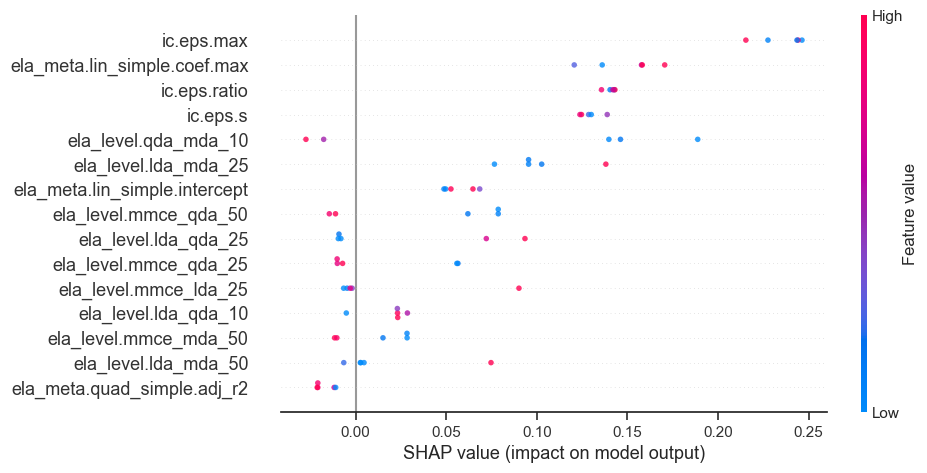

preview shap feature importance: 
                    feature_name  feature_importance  rank
46                    ic.eps.max            0.235344     1
38  ela_meta.lin_simple.coef.max            0.148633     2
47                  ic.eps.ratio            0.140766     3
48                      ic.eps.s            0.129174     4
34          ela_level.qda_mda_10            0.103919     5
(61, 3)
fold_number: 3
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
3    1             -0.829284          -0.826371          -0.848495   
     2             -0.766459          -0.698652          -0.631157   
     3             -0.528294          -0.451652          -0.420379   
     4             -0.743927          -0.700340          -0.682565   
     5             -0.862642          -0.896754          -0.950802   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


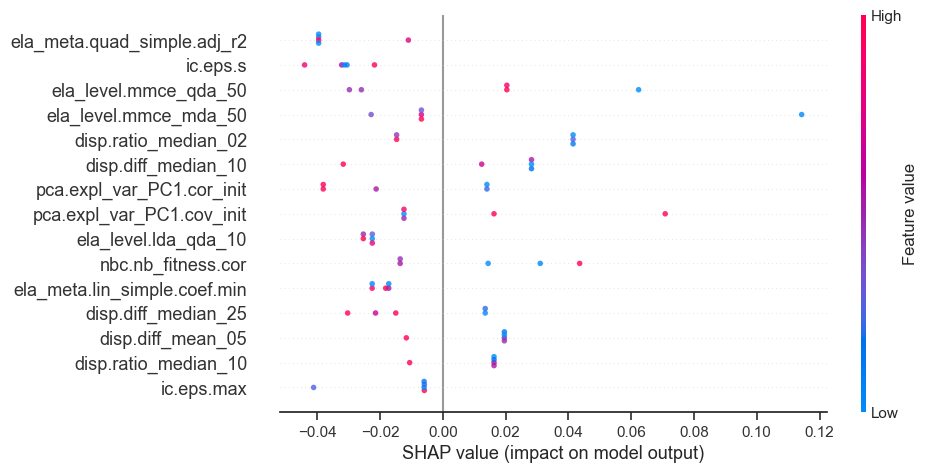

preview shap feature importance: 
                   feature_name  feature_importance  rank
43  ela_meta.quad_simple.adj_r2            0.033870     1
48                     ic.eps.s            0.032006     2
33        ela_level.mmce_qda_50            0.031778     3
30        ela_level.mmce_mda_50            0.031542     4
12         disp.ratio_median_02            0.030782     5
(61, 3)
fold_number: 4
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
4    1             -0.718414          -0.802582          -0.814311   
     2             -0.614235          -0.652788          -0.580699   
     3             -0.766910          -0.781489          -0.730538   
     4             -0.764491          -0.795779          -0.782917   
     5             -0.719037          -0.761675          -0.754013   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_i

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


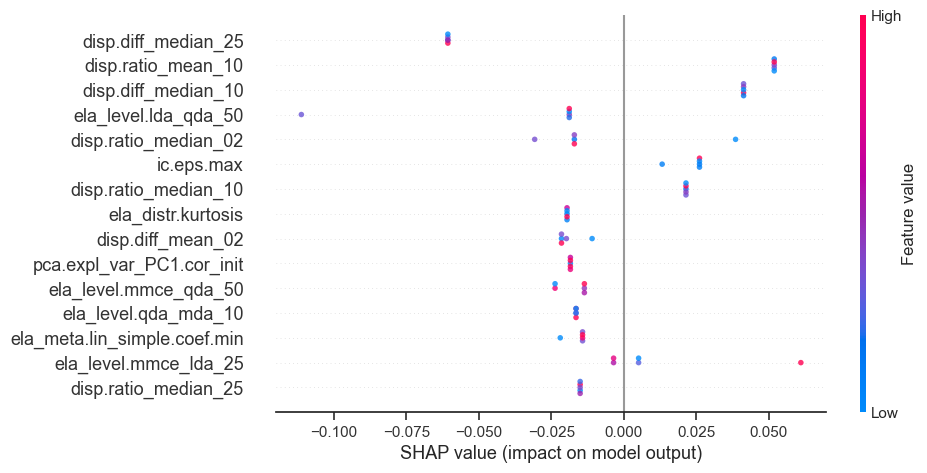

preview shap feature importance: 
            feature_name  feature_importance  rank
7    disp.diff_median_25            0.060725     1
10    disp.ratio_mean_10            0.051889     2
6    disp.diff_median_10            0.041311     3
24  ela_level.lda_qda_50            0.037322     4
12  disp.ratio_median_02            0.024109     5
(61, 3)
fold_number: 5
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
5    1              0.610041           0.634696           0.704033   
     2              0.487651           0.546865           0.616124   
     3              0.546584           0.612693           0.653106   
     4              0.531404           0.617875           0.661067   
     5              0.533301           0.626922           0.726109   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                         

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


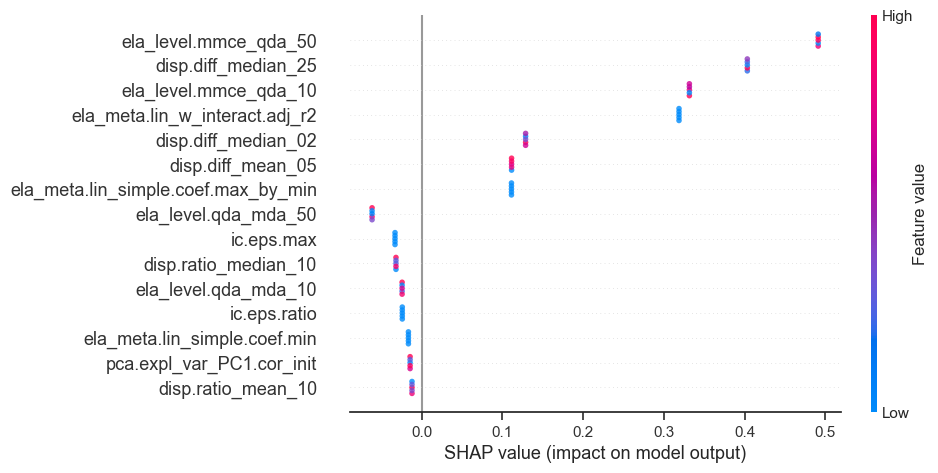

preview shap feature importance: 
                      feature_name  feature_importance  rank
33           ela_level.mmce_qda_50            0.491195     1
7              disp.diff_median_25            0.403417     2
31           ela_level.mmce_qda_10            0.331672     3
42  ela_meta.lin_w_interact.adj_r2            0.318840     4
4              disp.diff_median_02            0.128887     5
(61, 3)
fold_number: 6
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
6    1             -0.195052          -0.121671          -0.096817   
     2             -0.296754          -0.302734          -0.292017   
     3             -0.424281          -0.346272          -0.269681   
     4             -0.212051          -0.189643          -0.139081   
     5              0.024660          -0.038344          -0.048562   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.co

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


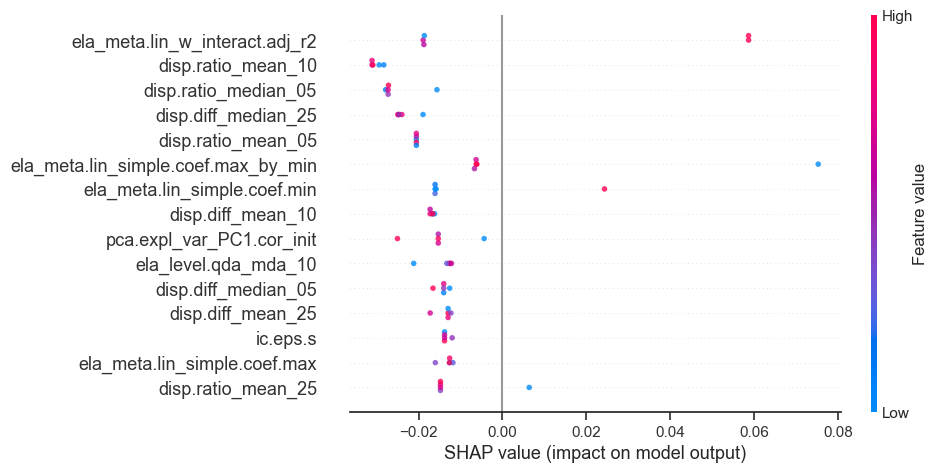

preview shap feature importance: 
                      feature_name  feature_importance  rank
42  ela_meta.lin_w_interact.adj_r2            0.034706     1
10              disp.ratio_mean_10            0.030140     2
13            disp.ratio_median_05            0.025020     3
7              disp.diff_median_25            0.023447     4
9               disp.ratio_mean_05            0.020518     5
(61, 3)
fold_number: 7
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
7    1              0.156008           0.195944           0.193868   
     2              0.067167           0.103538           0.092347   
     3              0.103603           0.152021           0.195156   
     4             -0.282279          -0.233854          -0.198059   
     5             -0.159071          -0.129215          -0.057641   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.co

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


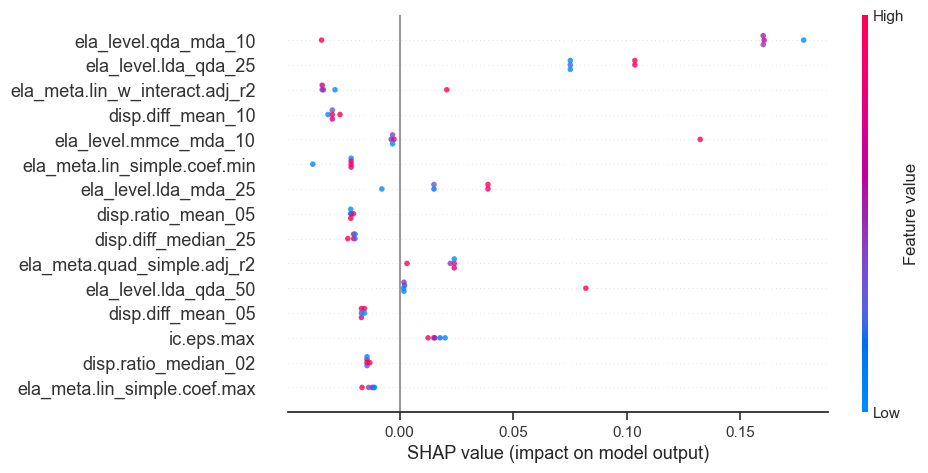

preview shap feature importance: 
                      feature_name  feature_importance  rank
34            ela_level.qda_mda_10            0.138550     1
23            ela_level.lda_qda_25            0.086516     2
42  ela_meta.lin_w_interact.adj_r2            0.030155     3
2                disp.diff_mean_10            0.029301     4
28           ela_level.mmce_mda_10            0.028921     5
(61, 3)
fold_number: 8
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
8    1             -1.149544          -1.148980          -1.134050   
     2             -1.042040          -1.028308          -0.987327   
     3             -1.026401          -0.996951          -0.943527   
     4             -1.113325          -1.116930          -1.084246   
     5             -1.088548          -1.061605          -1.035358   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.co

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


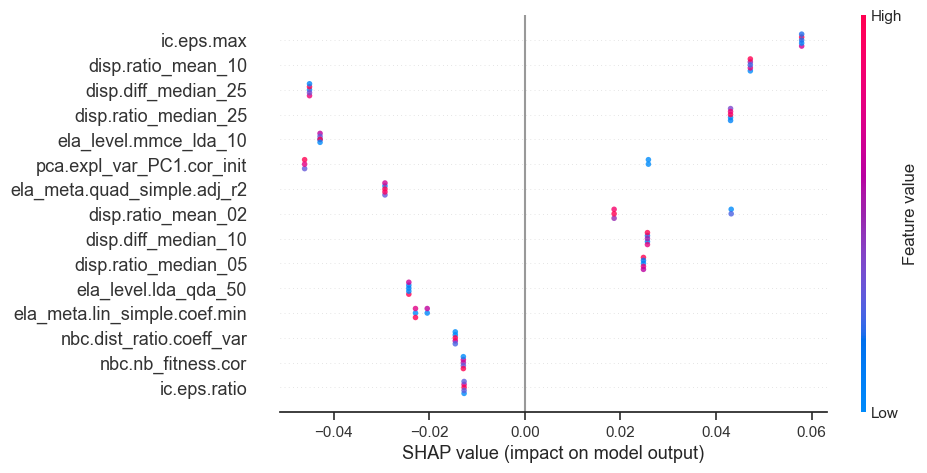

preview shap feature importance: 
             feature_name  feature_importance  rank
46             ic.eps.max            0.057913     1
10     disp.ratio_mean_10            0.047173     2
7     disp.diff_median_25            0.045048     3
15   disp.ratio_median_25            0.043038     4
25  ela_level.mmce_lda_10            0.042841     5
(61, 3)
fold_number: 9
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
9    1             -0.793271          -0.920365          -1.057360   
     2             -0.913301          -1.043042          -1.177044   
     3             -0.812190          -0.921975          -1.068605   
     4             -0.831146          -0.929886          -1.104981   
     5             -0.884886          -1.048055          -1.179052   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                   

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


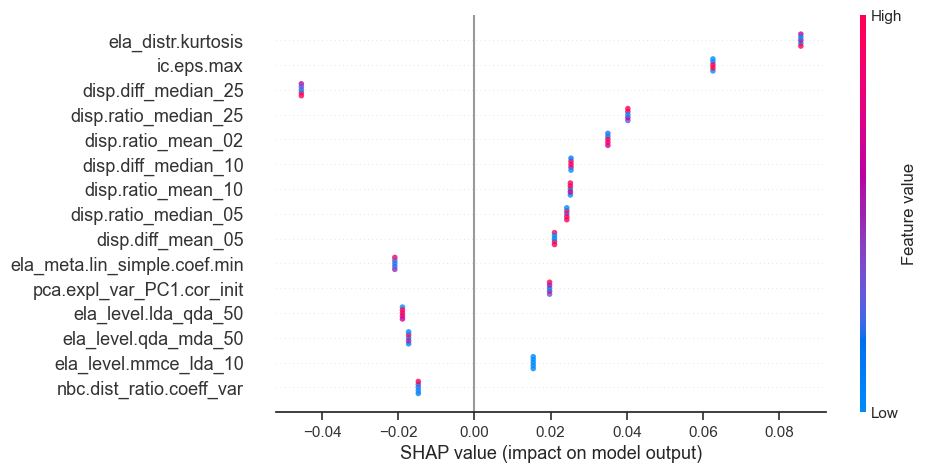

preview shap feature importance: 
            feature_name  feature_importance  rank
16    ela_distr.kurtosis            0.085676     1
46            ic.eps.max            0.062595     2
7    disp.diff_median_25            0.045437     3
15  disp.ratio_median_25            0.040263     4
8     disp.ratio_mean_02            0.035021     5
(61, 3)
fold_number: 10
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
10   1              0.671758           0.672580           0.688297   
     2              0.814386           0.801922           0.782018   
     3              0.933138           0.943057           0.978362   
     4              0.627313           0.573859           0.563109   
     5              0.838041           0.917234           0.963961   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                        

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


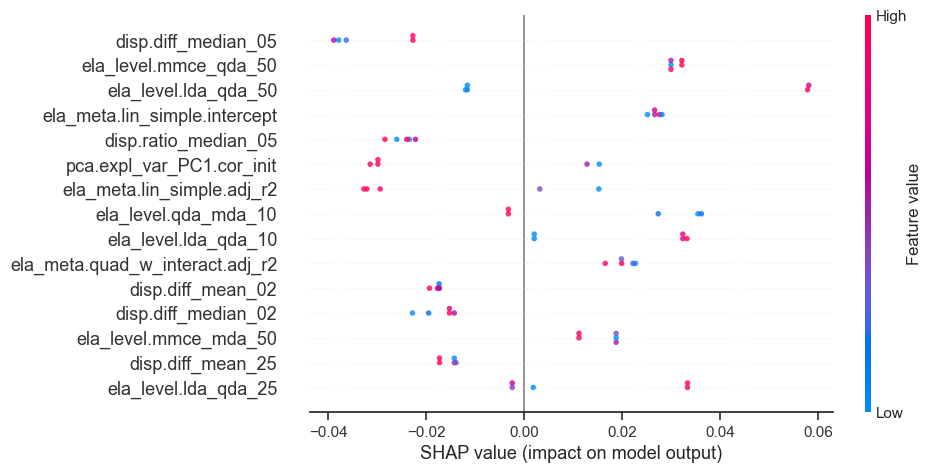

preview shap feature importance: 
                     feature_name  feature_importance  rank
5             disp.diff_median_05            0.031661     1
33          ela_level.mmce_qda_50            0.030869     2
24           ela_level.lda_qda_50            0.030207     3
41  ela_meta.lin_simple.intercept            0.026854     4
13           disp.ratio_median_05            0.024773     5
(61, 3)
fold_number: 11
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
11   1              2.089045           2.058889           2.019232   
     2              2.057637           2.022270           1.942623   
     3              1.919613           1.866701           1.785745   
     4              1.896831           1.832611           1.709556   
     5              2.093751           2.064676           2.017672   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_ini

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


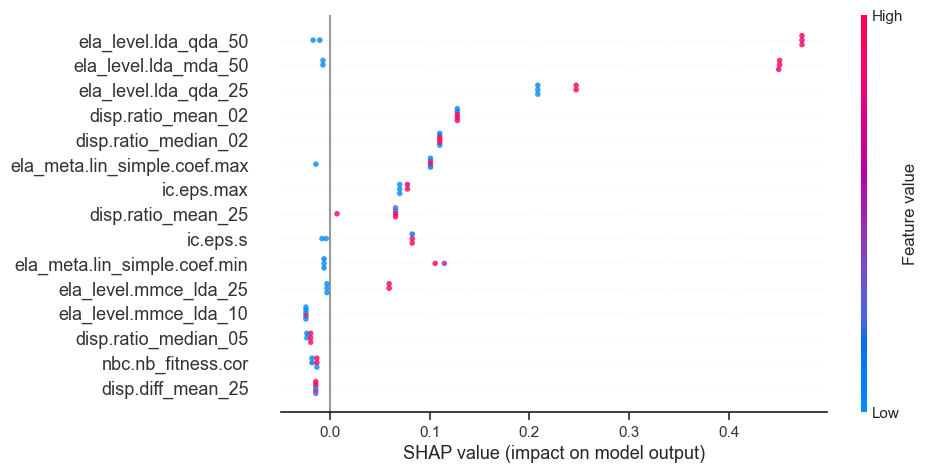

preview shap feature importance: 
            feature_name  feature_importance  rank
24  ela_level.lda_qda_50            0.289626     1
21  ela_level.lda_mda_50            0.273350     2
23  ela_level.lda_qda_25            0.224043     3
8     disp.ratio_mean_02            0.127890     4
12  disp.ratio_median_02            0.110234     5
(61, 3)
fold_number: 12
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
12   1             -1.004537          -0.958086          -0.894406   
     2             -0.920556          -0.779378          -0.621318   
     3             -0.701182          -0.575075          -0.439806   
     4             -0.931474          -0.806938          -0.658355   
     5             -0.936969          -0.810184          -0.661290   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                        

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


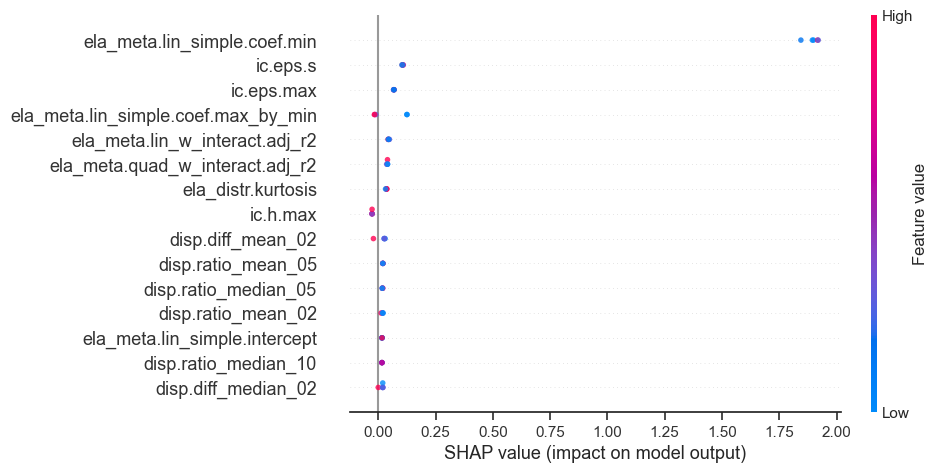

preview shap feature importance: 
                           feature_name  feature_importance  rank
40         ela_meta.lin_simple.coef.min            1.895224     1
48                             ic.eps.s            0.106338     2
46                           ic.eps.max            0.068161     3
39  ela_meta.lin_simple.coef.max_by_min            0.058631     4
42       ela_meta.lin_w_interact.adj_r2            0.045410     5
(61, 3)
fold_number: 13
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
13   1             -0.830468          -0.755455          -0.656341   
     2             -0.679676          -0.556361          -0.494882   
     3             -0.792348          -0.754178          -0.707919   
     4             -0.781624          -0.724211          -0.704586   
     5             -0.804907          -0.828251          -0.855932   

           disp.diff_mean_25  disp.diff_

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


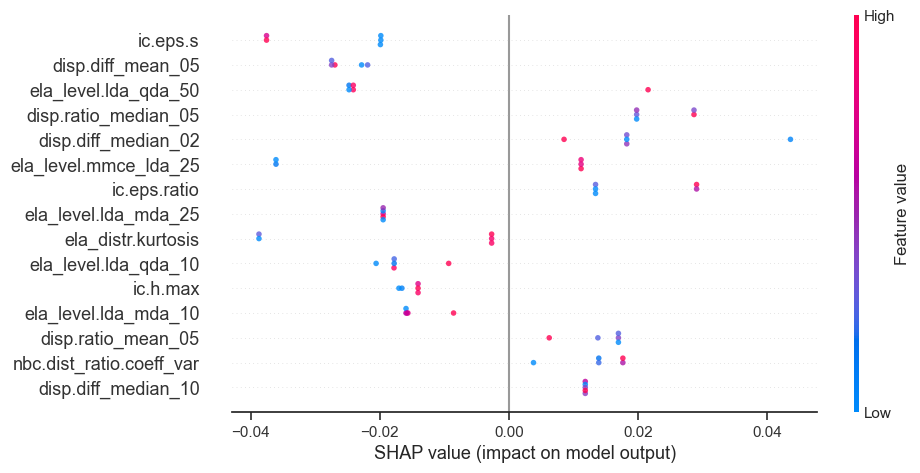

preview shap feature importance: 
            feature_name  feature_importance  rank
48              ic.eps.s            0.026943     1
1      disp.diff_mean_05            0.025325     2
24  ela_level.lda_qda_50            0.023861     3
13  disp.ratio_median_05            0.023315     4
4    disp.diff_median_02            0.021359     5
(61, 3)
fold_number: 14
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
14   1             -0.385992          -0.243033          -0.115901   
     2             -0.398480          -0.211356          -0.075269   
     3             -0.532602          -0.386145          -0.259512   
     4             -0.436743          -0.306975          -0.195933   
     5             -0.366588          -0.221568          -0.101238   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                        

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


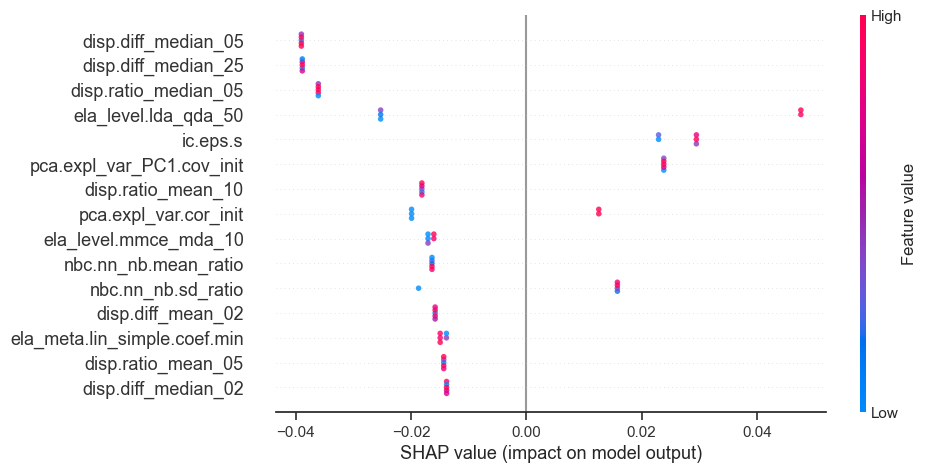

preview shap feature importance: 
            feature_name  feature_importance  rank
5    disp.diff_median_05            0.039006     1
7    disp.diff_median_25            0.038843     2
13  disp.ratio_median_05            0.036069     3
24  ela_level.lda_qda_50            0.034189     4
48              ic.eps.s            0.026849     5
(61, 3)
fold_number: 15
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
15   1             -0.916508          -0.855513          -0.835567   
     2             -0.717580          -0.687163          -0.616202   
     3             -0.759013          -0.604266          -0.504597   
     4             -0.782836          -0.732674          -0.681333   
     5             -0.868973          -0.865921          -0.893349   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                        

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


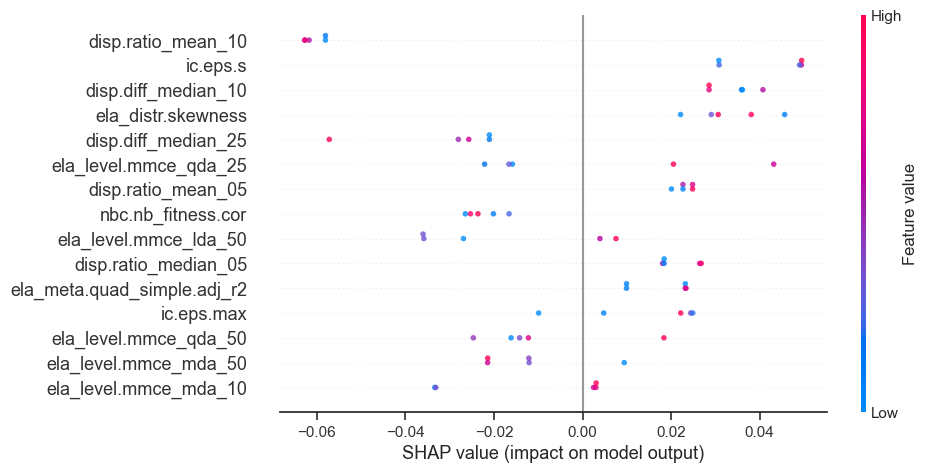

preview shap feature importance: 
           feature_name  feature_importance  rank
10   disp.ratio_mean_10            0.060678     1
48             ic.eps.s            0.041883     2
6   disp.diff_median_10            0.033962     3
18   ela_distr.skewness            0.033099     4
7   disp.diff_median_25            0.030620     5
(61, 3)
fold_number: 16
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
16   1              2.434765           2.494474           2.550378   
     2              2.421768           2.507384           2.552332   
     3              2.424278           2.459489           2.524397   
     4              2.443430           2.503486           2.570305   
     5              2.432822           2.512144           2.553783   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                          ... 

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


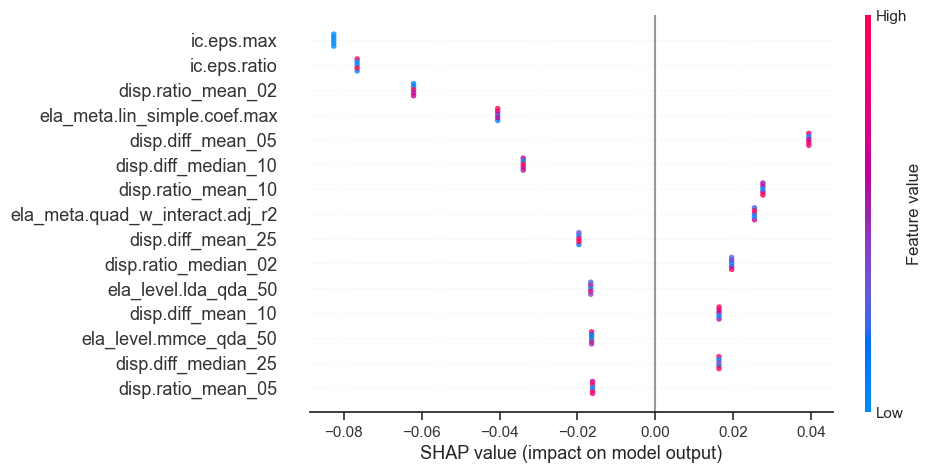

preview shap feature importance: 
                    feature_name  feature_importance  rank
46                    ic.eps.max            0.082611     1
47                  ic.eps.ratio            0.076606     2
8             disp.ratio_mean_02            0.062101     3
38  ela_meta.lin_simple.coef.max            0.040492     4
1              disp.diff_mean_05            0.039432     5
(61, 3)
fold_number: 17
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
17   1             -0.451864          -0.231918          -0.073917   
     2             -0.411901          -0.384980          -0.356872   
     3             -0.279831          -0.179240          -0.088529   
     4             -0.358666          -0.250441          -0.179059   
     5             -0.210923          -0.204269          -0.213491   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


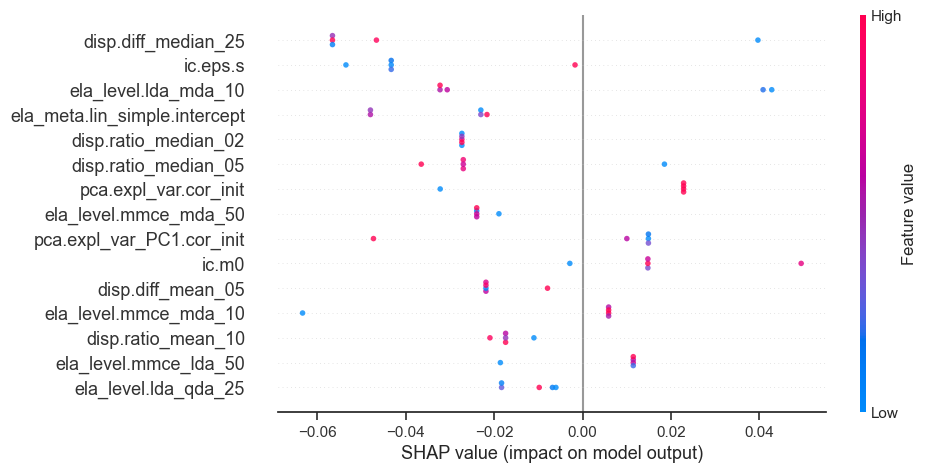

preview shap feature importance: 
                     feature_name  feature_importance  rank
7             disp.diff_median_25            0.051210     1
48                       ic.eps.s            0.037022     2
19           ela_level.lda_mda_10            0.035748     3
41  ela_meta.lin_simple.intercept            0.032728     4
12           disp.ratio_median_02            0.027305     5
(61, 3)
fold_number: 18
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
18   1             -0.317335          -0.144194           0.048400   
     2             -0.115876          -0.150873          -0.160508   
     3             -0.090471           0.017673           0.114753   
     4             -0.171004          -0.132100          -0.099301   
     5              0.067800           0.037800           0.006943   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_ini

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


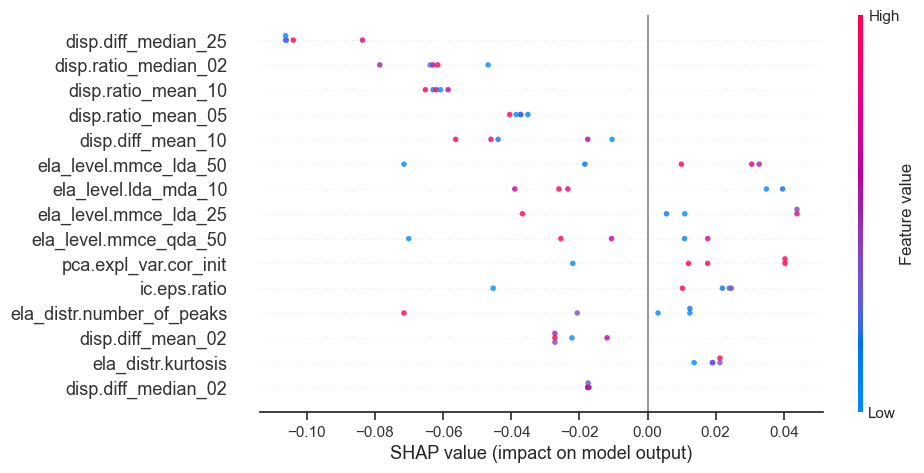

preview shap feature importance: 
            feature_name  feature_importance  rank
7    disp.diff_median_25            0.101211     1
12  disp.ratio_median_02            0.062736     2
10    disp.ratio_mean_10            0.061865     3
9     disp.ratio_mean_05            0.037720     4
2      disp.diff_mean_10            0.034809     5
(61, 3)
fold_number: 19
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
19   1             -0.704932          -0.856182          -1.044341   
     2             -0.824420          -1.002919          -1.166635   
     3             -0.700971          -0.868938          -1.032828   
     4             -0.748429          -0.921521          -1.098013   
     5             -0.692022          -0.887383          -1.057516   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                        

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


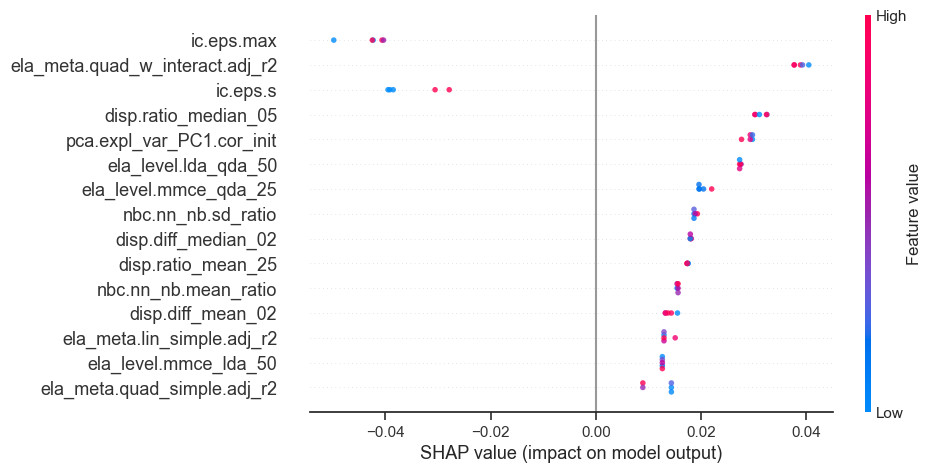

preview shap feature importance: 
                       feature_name  feature_importance  rank
46                       ic.eps.max            0.043098     1
45  ela_meta.quad_w_interact.adj_r2            0.038803     2
48                         ic.eps.s            0.035095     3
13             disp.ratio_median_05            0.031306     4
58        pca.expl_var_PC1.cor_init            0.029179     5
(61, 3)
fold_number: 20
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
20   1             -0.759997          -0.804262          -0.815284   
     2             -0.710630          -0.708234          -0.720233   
     3             -0.708246          -0.765814          -0.758276   
     4             -0.759337          -0.795221          -0.798017   
     5             -0.744739          -0.753713          -0.724819   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


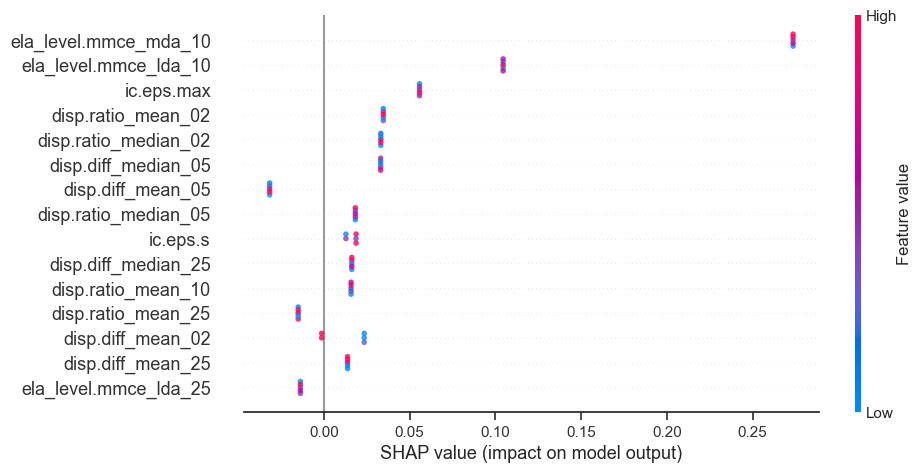

preview shap feature importance: 
             feature_name  feature_importance  rank
28  ela_level.mmce_mda_10            0.273569     1
25  ela_level.mmce_lda_10            0.104533     2
46             ic.eps.max            0.055793     3
8      disp.ratio_mean_02            0.034670     4
12   disp.ratio_median_02            0.033236     5
(61, 3)
fold_number: 21
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
21   1              1.414631           1.256553           1.080071   
     2              1.417963           1.278483           1.130253   
     3              0.959593           0.890307           0.726808   
     4              1.163388           1.040951           0.877409   
     5              1.282624           1.056219           0.830531   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                  

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


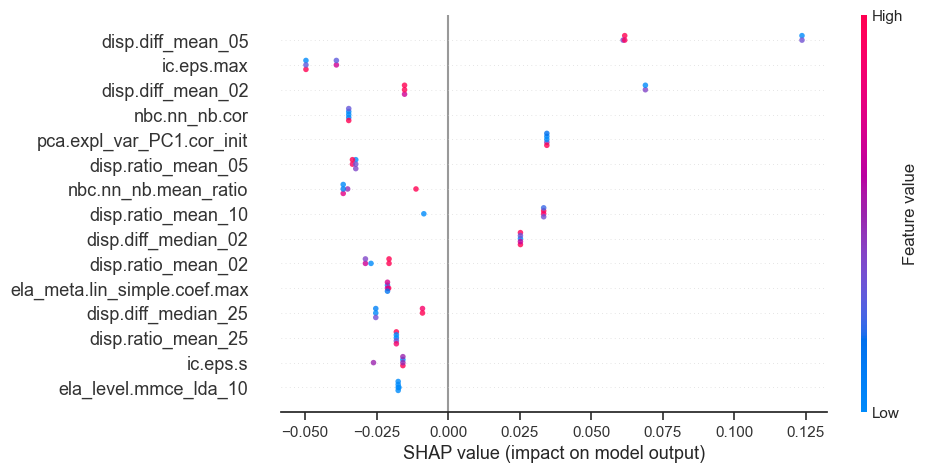

preview shap feature importance: 
                 feature_name  feature_importance  rank
1           disp.diff_mean_05            0.086385     1
46                 ic.eps.max            0.045402     2
0           disp.diff_mean_02            0.036699     3
53              nbc.nn_nb.cor            0.034702     4
58  pca.expl_var_PC1.cor_init            0.034511     5
(61, 3)
fold_number: 22
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
22   1              0.669593           0.598891           0.486788   
     2              0.878391           0.744723           0.607309   
     3              1.416490           1.274325           1.110488   
     4              0.796306           0.742891           0.663525   
     5              0.921060           0.764234           0.625067   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id          

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


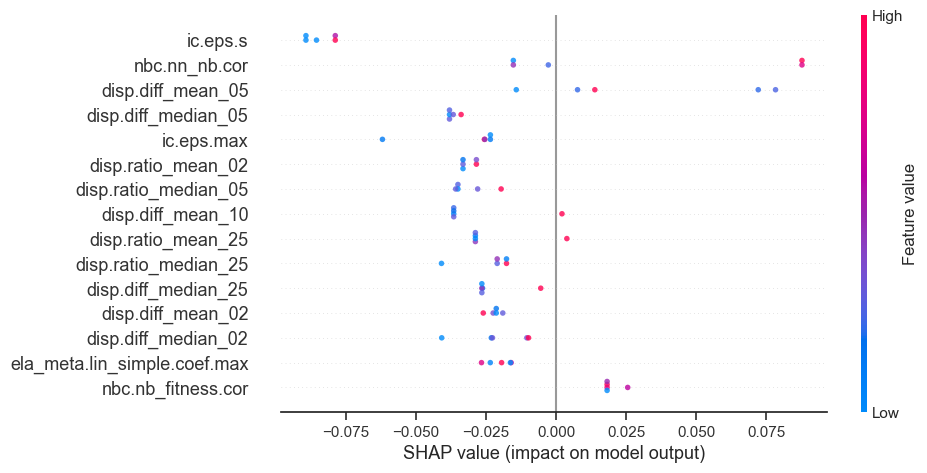

preview shap feature importance: 
           feature_name  feature_importance  rank
48             ic.eps.s            0.084247     1
53        nbc.nn_nb.cor            0.041717     2
1     disp.diff_mean_05            0.037189     3
5   disp.diff_median_05            0.036910     4
46           ic.eps.max            0.031946     5
(61, 3)
fold_number: 23
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
23   1              2.451738           2.512006           2.603447   
     2              2.455186           2.504204           2.548364   
     3              2.417544           2.516818           2.559721   
     4              2.447519           2.468389           2.536250   
     5              2.494247           2.509574           2.536502   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_init  \
f_id i_id                                          ... 

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


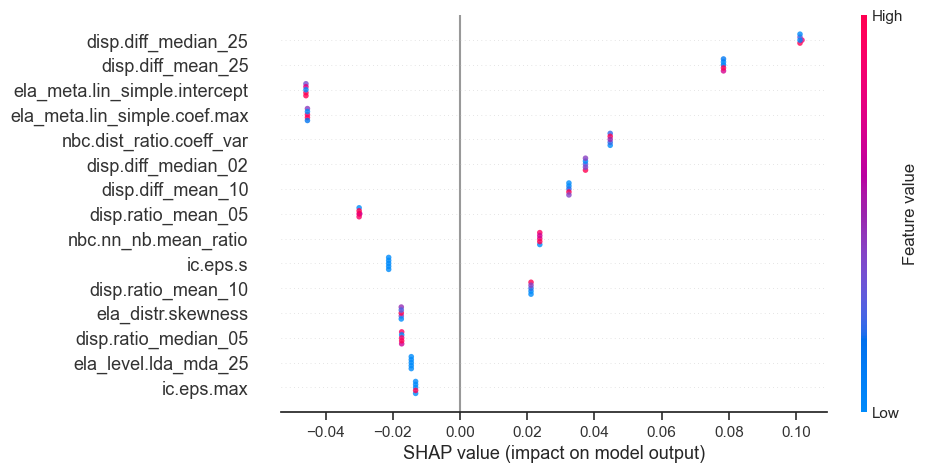

preview shap feature importance: 
                     feature_name  feature_importance  rank
7             disp.diff_median_25            0.101329     1
3               disp.diff_mean_25            0.078434     2
41  ela_meta.lin_simple.intercept            0.045873     3
38   ela_meta.lin_simple.coef.max            0.045427     4
51       nbc.dist_ratio.coeff_var            0.044709     5
(61, 3)
fold_number: 24
Preview data: 
           disp.diff_mean_02  disp.diff_mean_05  disp.diff_mean_10  \
f_id i_id                                                            
24   1             -0.675545          -0.852147          -0.986172   
     2             -0.691376          -0.833461          -0.964601   
     3             -0.700867          -0.858513          -0.984574   
     4             -0.752024          -0.870925          -1.025831   
     5             -0.719117          -0.869093          -0.984574   

           disp.diff_mean_25  disp.diff_median_02  ...  pca.expl_var.cor_ini

Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


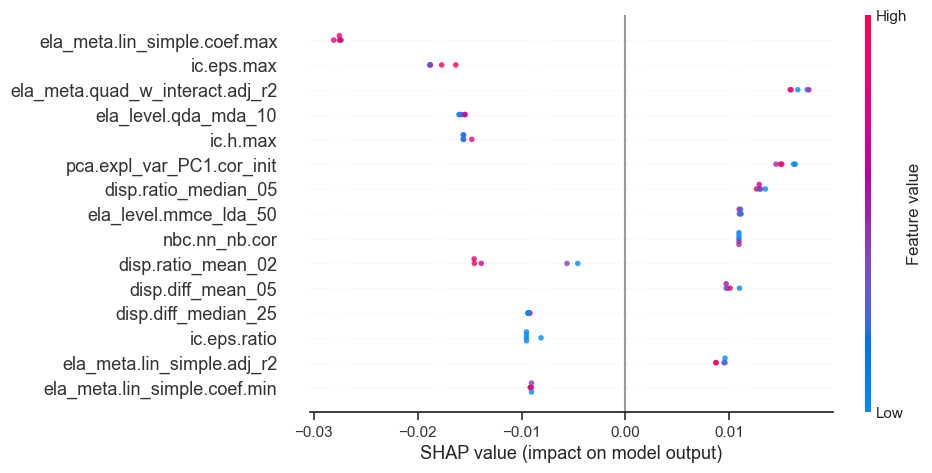

preview shap feature importance: 
                       feature_name  feature_importance  rank
38     ela_meta.lin_simple.coef.max            0.027577     1
46                       ic.eps.max            0.018078     2
45  ela_meta.quad_w_interact.adj_r2            0.016694     3
34             ela_level.qda_mda_10            0.015737     4
49                         ic.h.max            0.015431     5
(61, 3)


In [5]:
for algorithm_name, budget in product(algorithms, budgets):
    print(f"algorithm name: {algorithm_name}")
    print(f"budget: {budget}")

    # define directories
    results_folder_temp = f"{results_folder}/algorithm_name={algorithm_name}_budget={budget}"
    data_folder_temp = f"{data_folder}/algorithm_name={algorithm_name}_budget={budget}"

    # create shapley directory
    os.makedirs(f"{results_folder_temp}/shap", exist_ok=True)

    for dataset in ["train", "test"]:
        print(f"dataset: {dataset}")

        # create results placeholder
        shap_importance = pd.DataFrame()

        for fold_number in np.arange(1, n_folds+1):
            print(f"fold_number: {fold_number}")

            # load dataset
            X = pd.read_csv(f"{data_folder_temp}/X_{dataset}_fold={fold_number}.csv"
                           , index_col=['f_id', 'i_id'])

            print("Preview data: ")
            print(X.head())
            print(X.shape)
            
            # load the trained model
            model = joblib.load(f"{results_folder_temp}/models/model_fold={fold_number}.joblib")

            # calculate shapley values
            shap_values = calculate_shap_values(data=X, model=model, explainer_type=explainer_type)

            print("Preview shapley values: ")
            print(shap_values.head())
            print(shap_values.shape)    
            
            # plot
            max_display = 15
            visualise_shap_values(shap_values=shap_values.values
               , data=X
               , plot_type='dot'            
               , figsize=(10, 5)
               , max_display=15
               , title=f"shap_values_set={dataset}_fold={fold_number}_topn={max_display}"
               , save_path=f"{results_folder_temp}/shap")

            # calculate shapley feature importance
            shap_importance = calculate_shap_importance(data=shap_values)
            print("preview shap feature importance: ")
            print(shap_importance.head())
            print(shap_importance.shape)
            
            # save 
            shap_values.reset_index().to_csv(f"{results_folder_temp}/shap/shap_values_set={dataset}_fold={fold_number}.csv", index=False)                             

            # save feature importance
            shap_importance.to_csv(f"{results_folder_temp}/shap/shap_importance_set={dataset}_fold={fold_number}.csv", index=False)    